# Loading Dataset



In [ ]:
import numpy as np
from numpy import random
import matplotlib.pyplot as plt
import numpy.matlib
import pandas as pd
import seaborn as sns
import tensorflow as tf
from sklearn.metrics import r2_score
from sklearn import metrics
import sklearn.model_selection
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression,LogisticRegression
from sklearn.feature_selection import SelectKBest,f_regression
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from scipy.stats import t
from sklearn.feature_selection import SelectKBest
from scipy.stats import spearmanr
from sklearn.model_selection import train_test_split
import os

In [ ]:
#dataset
!gdown --id 1qplbQwvk_lhMFenRmQCOt51ppuHVXz_o

/usr/local/lib/python3.8/dist-packages/gdown/cli.py:127: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1qplbQwvk_lhMFenRmQCOt51ppuHVXz_o
To: /content/MS-2-all.csv
100% 3.47M/3.47M [00:00<00:00, 71.0MB/s]


In [ ]:
#trained model data
#!gdown --id 1GfeGp0SSRMstXZidLNia7OqCv9XZCZX_

In [ ]:
df = pd.read_csv('/content/MS-2-all.csv')
df.head()

,Unnamed: 0,Name,Bn-A01-p102249,Bn-A01-p10251052,Bn-A01-p1029668,Bn-A01-p1041947,Bn-A01-p10523194,Bn-A01-p10523264,Bn-A01-p1095733,Bn-A01-p1145674,...,Bn-scaffold13149-p372,Bn-scaffold15226-p540,Bn-scaffold3128-p296,Bn-scaffold5450-p277,Bn-scaffold733-p492,Height_BLUP,Yield_BLUP,Protein_BLUP,Oil_BLUP,Gluc_BLUP
0,0,11DH91,1,1,1,1,1,-1,-1,1,...,-1,1,1,-1,-1,95.4399,1271.16,28.6591,45.53354,24.1358
1,1,11DH92,1,1,1,1,1,-1,-1,1,...,-1,1,1,-1,-1,94.3613,1076.10,30.5532,44.00830,24.4354
2,2,11DH97,1,1,1,1,1,-1,-1,1,...,-1,1,1,-1,-1,97.7265,1264.38,29.5464,44.60410,22.8398
3,3,11DH108,1,1,1,1,1,-1,-1,1,...,-1,1,1,-1,-1,97.2520,1312.21,29.0722,45.63880,18.8142
4,4,11DH109,1,1,-1,-1,1,-1,-1,-1,...,-1,1,1,-1,-1,92.2041,1345.62,29.4112,45.96260,20.7013


In [ ]:
targets=['Height_BLUP', 'Yield_BLUP', 'Protein_BLUP', 'Oil_BLUP', 'Gluc_BLUP']
for column in targets:
    df[column]=(df[column] - df[column].min()) / (df[column].max() - df[column].min())
    #df[column] = (df[column] - df[column].mean()) / df[column].std()

Height_BLUP     0
Yield_BLUP      0
Protein_BLUP    0
Oil_BLUP        0
Gluc_BLUP       0
dtype: int64

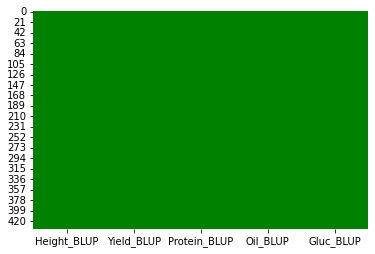

In [ ]:
#selecting last 5 columns which are target variables 
df_target=df[df.columns[-5:]]
#checking for the null data and heatmap the missing values
display(df_target.isnull().sum())
sns.heatmap(df_target.isnull(),cbar=False,cmap='ocean') # No missing value found

In [ ]:
df_target.columns=['Height','Yield','Protein','Oil','Glucose']
#df_target.columns

# Selecting feature set

In [ ]:
X_=df.drop(['Unnamed: 0', 'Name','Height_BLUP', 'Yield_BLUP', 'Protein_BLUP', 'Oil_BLUP', 'Gluc_BLUP'],axis=1)

y_=df_target.copy()
y=y_.copy()
X=X_.copy()

In [ ]:
temp_df_=pd.DataFrame(pd.DataFrame(X_.copy().to_numpy().flatten()).value_counts())
#plt.plot(list(different_values))
temp_df_.columns=['0']

#plt.bar([1,-1,0,999],list(different_values))

In [ ]:
temp_df_

,0
0,
1,567299
-1,554237
0,258865
999,16979


In [ ]:
# temp_df_2=pd.DataFrame(pd.DataFrame(temp_vc).value_counts())
# temp_df_2.columns=['0']

In [ ]:
# temp_df_2['index1'] = [3,1,2]
# sns.set_theme(style='white')
# g = sns.barplot(x='index1', y='0', data=temp_df_2)
# g.set_ylabel('Number of features')
# g.set_xlabel('Number of unique markers')


Rectangle(xy=(0.6, 0), width=0.8, height=258865, angle=0)


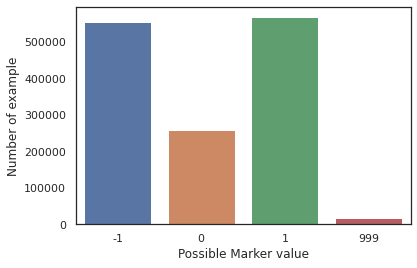

In [ ]:
temp_df_['index1'] = [1,-1,0,999]
sns.set_theme(style='white')
g = sns.barplot(x='index1', y='0', data=temp_df_)
g.set_ylabel('Number of example')
g.set_xlabel('Possible Marker value')
#g.bar_label(g.containers[0])
#g.text(-1, , round(row.total_bill, 2), color='black', ha="center")
print(g.containers[0][1])
#g.text()



In [ ]:
temp_df_

,0,index1
0,,
1,567299,1
-1,554237,-1
0,258865,0
999,16979,999


In [ ]:
temp_x=X_.copy()
#removed not useful data
for col in temp_x.columns:
    temp_x[col].replace([999], temp_x[col].value_counts().index[0],inplace=True)
x=temp_x



In [ ]:
temp_col_list=[]
for col in x.columns:
    if len(x[col].value_counts())==3:
        temp_col_list.append(col)

In [ ]:
temp_col_list_len=[len(x[i].value_counts()) for i in temp_col_list]
set(temp_col_list_len)

{3}

# Plotting

In [ ]:
def plotting(y_test,y_pred,title=""):

    y_test=np.array(y_test).flatten()
    y_pred=np.array(y_pred).flatten()
    
    figure, axis = plt.subplots(1,3)
    figure.set_figheight(6)#6
    figure.set_figwidth(20)#20
    figure.suptitle(title)
        #scatter plot
    axis[0].scatter(y_test,y_pred)
    axis[0].set_title('scatter plot')
    x_45 = np.linspace(min(y_test),max(y_test))
    axis[0].plot(x_45, x_45,linestyle='--')
    axis[0].set_xlabel('y_test ')
    axis[0].set_ylabel('y_pred ')
        
        #hist plot
    axis[1].hist(y_test - y_pred)
    axis[1].set_title('hist plot')
    axis[1].set_xlabel('y_test-y_pred ')
    #axis[0].set_ylabel('y_pred'+title)
    

        #residual plot
    axis[2].scatter(y_pred,(y_pred-y_test))
    axis[2].set_title('residual plot')
    axis[2].axhline(y=0, linestyle='--')
    axis[2].set_xlabel('y_pred ')
    axis[2].set_ylabel('y_pred-y_test ')
    plt.show()

In [ ]:
def error_matrix(y_test,y_pred,flag=False):
    y_test=np.array(y_test).flatten()
    y_pred=np.array(y_pred).flatten()
    mae=metrics.mean_absolute_error(y_test, y_pred)
    mse=metrics.mean_squared_error(y_test ,y_pred)
    rmse=np.sqrt(mse)
    #mape=((y_pred-y_test)/y_test).abs().sum()/len(y_pred) 
    mape=np.mean(np.abs((y_test - y_pred)/y_test))
    r2=r2_score(y_test,y_pred)
    skb = SelectKBest(score_func=spearmanr, k=1)
    skb.fit(y_test.reshape(-1,1),y_pred.reshape(-1,1))
    skb_score=skb.scores_
    #spearman, p = spearmanr(y_test,y_pred)

    print("\nMAE:{:.3} MAPE:{:.3} MSE:{:.3} RMSE:{:.3} R2:{:.3} SKB:{:.3}".format(mae,mape,mse,rmse,r2,skb_score))

    if flag:
        return {'MAE':mae,'MAPE':mape,'MSE':mse,'RMSE':rmse,'R2':r2,'SKB':skb_score}

In [ ]:
target_var=['Height','Yield','Protein','Oil','Glucose']
def choose_features(X=X,n=100):

    x_target={}
    y_target={}

    #X is dataframe with all the features 
    df_temp=X.copy()

    for target in target_var:
        df_temp[target]=df_target[target].copy()
    
    cor=df_temp.corr()

    for target in target_var:
        temp_target_cor=cor[target][:-5].abs()
        temp_target_indices=temp_target_cor.nlargest(n).index
        x_target[target]=X[temp_target_indices]
        y_target[target]=df_target[target]
    return (x_target,y_target)

In [ ]:
temp_vc=[]

new_x=pd.DataFrame()
for col in x.columns:
    temp_vc_ex=x[col].value_counts()
    temp_vc.append(len(temp_vc_ex))
    if (max(temp_vc_ex)/436)<0.5:
        new_x[col]=x[col].copy()
len(new_x.columns)

<ipython-input-23-c6acc73d7242>:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  new_x[col]=x[col].copy()


556

In [ ]:
pd.DataFrame(temp_vc).value_counts()


3    2348
1     591
2     266
dtype: int64

# Models


In [ ]:
a,b={},{}
a[10],b[10]=choose_features(new_x,10)
a[100],b[100]=choose_features(new_x,100)
a[500],b[500]=choose_features(new_x,500)

In [ ]:
#@title
def linear_regression_model(x,y,test_size=0.1):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = test_size,random_state=0)
    lr={}
    lr['model'] = LinearRegression()
    lr['model'].fit(x_train,y_train)
    folds = KFold(n_splits = 5, shuffle = True, random_state = 100)
    scores = cross_val_score(lr['model'], x_train, y_train, scoring='r2', cv=folds)

    y_pred= lr['model'].predict(x_test)
    plotting(y_test,y_pred,title="Linear Regression")
    lr['matrix']=error_matrix(y_test,y_pred,True)
    lr['matrix']['CV']=np.mean(scores)
    return lr

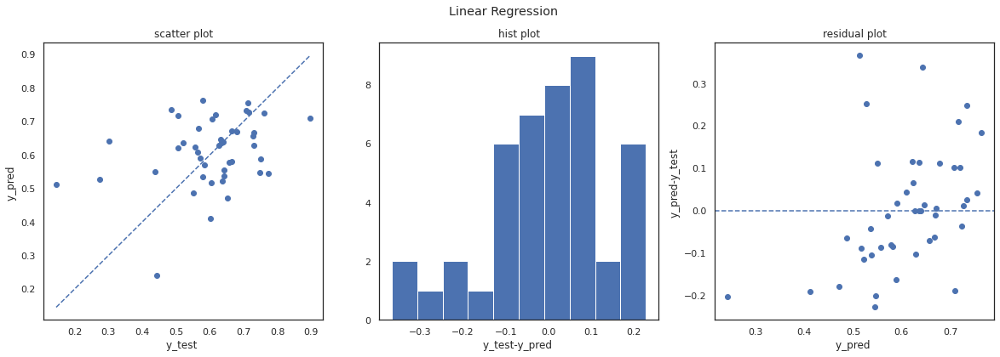


MAE:0.109 MAPE:0.248 MSE:0.02 RMSE:0.141 R2:-0.0943 SKB:0.251


In [ ]:
# target_var=['Height','Yield','Protein','Oil','Glucose']
target_var_index=target_var[2]
n=100
lr=linear_regression_model(a[n][target_var_index],b[n][target_var_index],0.1)

In [ ]:
#@title
from sklearn.linear_model import LassoCV

def lasso_regression_model(x,y,test_size=0.1):
    
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = test_size,random_state=0)
    
    lasso={}
    lasso['model'] = LassoCV(cv=5,tol=0.025,max_iter=2000)
    lasso['model'].fit(x_train,y_train)
    y_pred= lasso['model'].predict(x_test)
    
    plotting(y_test,y_pred,title="lasso Regression")
    lasso['matrix']=error_matrix(y_test,y_pred,True)
    lasso['matrix']['CV']=lasso['model'].score(x_train, y_train)
    return lasso

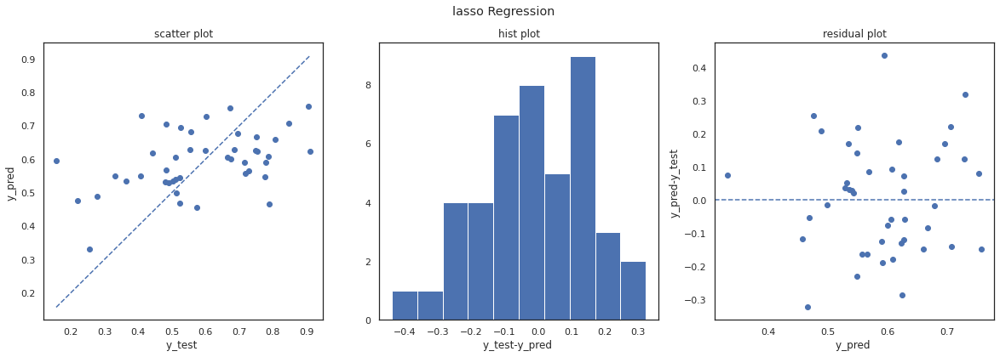


MAE:0.136 MAPE:0.309 MSE:0.027 RMSE:0.164 R2:0.184 SKB:0.403


In [ ]:
target_var_index=target_var[0]
n=100
lasso=lasso_regression_model(a[n][target_var_index],b[n][target_var_index],0.1)

In [ ]:
#@title
from sklearn.linear_model import RidgeCV


def ridge_regression_model(x,y,test_size=0.1):
    
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = test_size,random_state=0)
    
    ridge={}
    ridge['model'] = RidgeCV(cv=5)
    ridge['model'].fit(x_train,y_train)
    y_pred= ridge['model'].predict(x_test)
    
    plotting(y_test,y_pred,title="Ridge Regression")
    ridge['matrix']=error_matrix(y_test,y_pred,True)
    ridge['matrix']['CV']=ridge['model'].score(x_train, y_train)
    return ridge

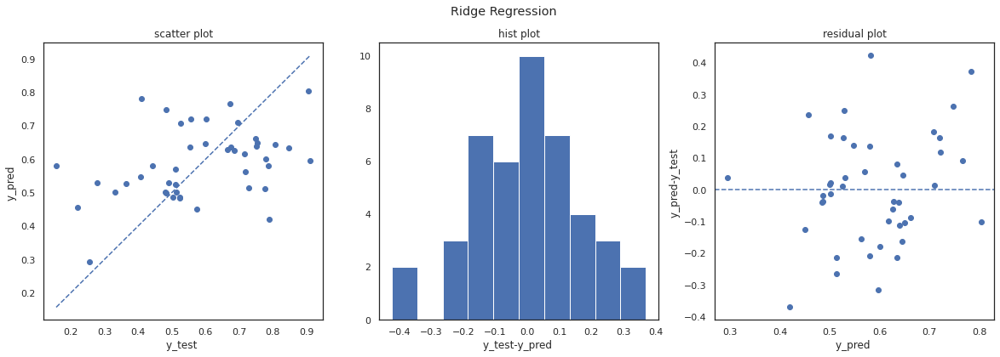


MAE:0.136 MAPE:0.302 MSE:0.0295 RMSE:0.172 R2:0.109 SKB:0.359


In [ ]:
# target_var=['Height','Yield','Protein','Oil','Glucose']
target_var_index=target_var[0]
n=100
ridge=ridge_regression_model(a[n][target_var_index],b[n][target_var_index],0.1)

In [ ]:
from sklearn.svm import LinearSVR
def svr_model(x,y,test_size=0.1):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = test_size,random_state=0)
    svr={}
    svr_reg = LinearSVR()
    svr_reg.fit(x_train,y_train)
    y_pred = svr_reg.predict(x_test)
    svr['model']=svr_reg

    folds = KFold(n_splits = 5, shuffle = True, random_state = 100)
    scores = cross_val_score(svr['model'], x_train, y_train, scoring='r2', cv=folds)

    plotting(y_test,y_pred,title="Svr Regressor")
    svr['matrix']=error_matrix(y_test,y_pred,True)
    svr['matrix']['CV']=np.mean(scores)
    return svr


/usr/local/lib/python3.8/dist-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warning

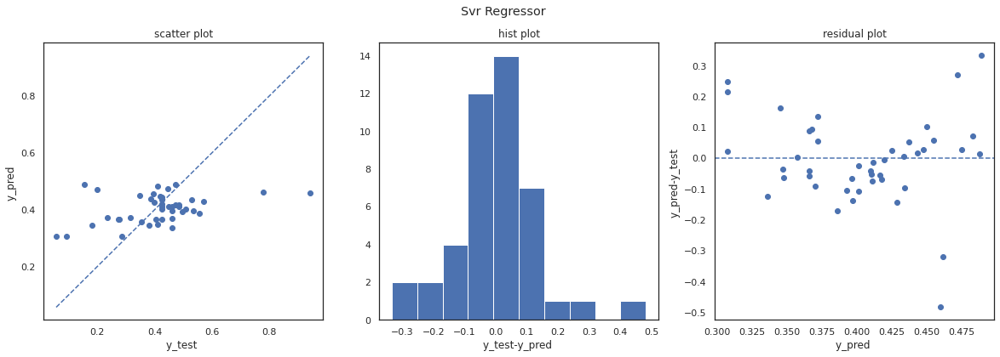


MAE:0.1 MAPE:0.402 MSE:0.0199 RMSE:0.141 R2:0.154 SKB:0.305


In [ ]:
# target_var=['Height','Yield','Protein','Oil','Glucose']
target_var_index=target_var[1]
n=10
svr=svr_model(a[n][target_var_index],b[n][target_var_index],0.1)

In [ ]:
from prompt_toolkit.shortcuts.progress_bar.formatters import D
from sklearn.tree import DecisionTreeRegressor
def decision_tree_model(x,y,test_size=0.1):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = test_size,random_state=0)
    Dtree={}
    # Fit regression model
    
    regr = DecisionTreeRegressor(max_depth=5)
    regr.fit(x_train, y_train)
    Dtree['model']=regr

    folds = KFold(n_splits = 5, shuffle = True, random_state = 100)
    scores = cross_val_score(Dtree['model'], x_train, y_train, scoring='r2', cv=folds)
    Dtree['cv']=scores

    # Predict
    y_pred = regr.predict(x_test)
    Dtree['matrix']=error_matrix(y_test,y_pred,True)
    plotting(y_test,y_pred,title="Decision Tree for max_depth=5")

    folds = KFold(n_splits = 5, shuffle = True, random_state = 100)
    scores = cross_val_score(Dtree['model'], x_train, y_train, scoring='r2', cv=folds)
    Dtree['matrix']['CV']=np.mean(scores)
    
    return Dtree    


MAE:0.11 MAPE:0.212 MSE:0.0158 RMSE:0.126 R2:0.524 SKB:0.652


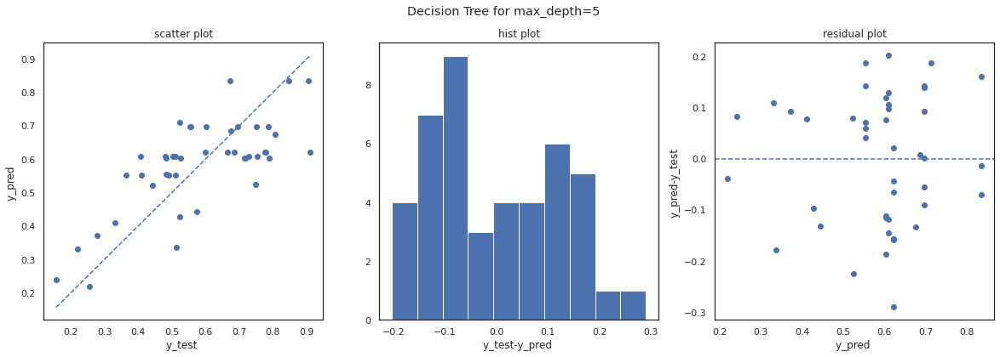

In [ ]:
# target_var=['Height','Yield','Protein','Oil','Glucose']
target_var_index=target_var[0]
n=100
Dtree=decision_tree_model(a[n][target_var_index],b[n][target_var_index],0.1)

In [ ]:
from sklearn.ensemble import RandomForestRegressor
def random_forest_model(x,y,test_size=0.1,random_state=0):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = test_size,random_state=random_state)
    RF={}
    model = RandomForestRegressor(n_estimators = 500, max_features = 'sqrt', max_depth = 5, random_state = 0).fit(x_train, y_train)
    y_pred = model.predict(x_test)
    
    plotting(y_test,y_pred,title="Random Forest")
    RF['model']=model 
    RF['matrix']=error_matrix(y_test,y_pred,True)
    
    folds = KFold(n_splits = 5, shuffle = True, random_state = 100)
    scores = cross_val_score(RF['model'], x_train, y_train, scoring='r2', cv=folds)
    RF['matrix']['CV']=np.mean(scores)

    return RF 

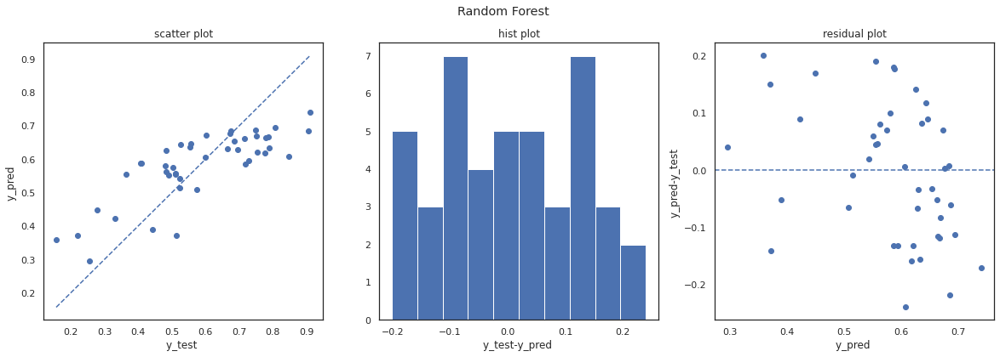


MAE:0.101 MAPE:0.211 MSE:0.0139 RMSE:0.118 R2:0.582 SKB:0.775


In [ ]:
# target_var=['Height','Yield','Protein','Oil','Glucose']
target_var_index=target_var[0]
n=500
RF=random_forest_model(a[n][target_var_index],b[n][target_var_index],0.1)

In [ ]:
from sklearn.ensemble import AdaBoostRegressor
def adaboost_model(x,y,test_size=0.1):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = test_size,random_state=0)
    
    adaboost={}
    adaboost['model'] = AdaBoostRegressor(random_state=0,n_estimators=6,learning_rate=0.2)
    adaboost['model'].fit(x_train,y_train)

    folds = KFold(n_splits = 5, shuffle = True, random_state = 100)
    scores = cross_val_score(adaboost['model'], x_train, y_train, scoring='r2', cv=folds)
    
    adaboost['y_pred'] = adaboost['model'].predict(x_test)
    adaboost['matrix']=error_matrix(y_test,adaboost['y_pred'],True)
    adaboost['matrix']['CV']=np.mean(scores)
    plotting(y_test,adaboost['y_pred'],title="Adaboost Regression")
    return adaboost


MAE:0.101 MAPE:0.216 MSE:0.0163 RMSE:0.128 R2:0.509 SKB:0.697


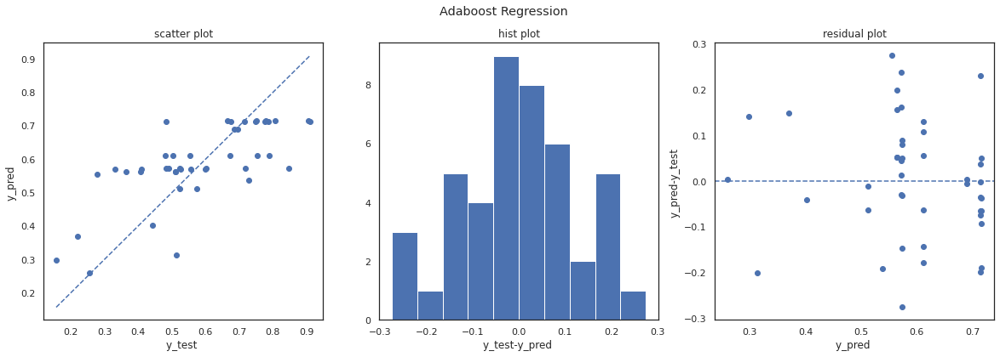

In [ ]:
# target_var=['Height','Yield','Protein','Oil','Glucose']
target_var_index=target_var[0]
n=500
adaboost=adaboost_model(a[n][target_var_index],b[n][target_var_index],0.1)

In [ ]:
from xgboost import XGBRegressor 
def xgb_model(x,y,test_size=0.1,random_state=0):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = test_size,random_state=random_state)
    xgb={}
    xg_reg = XGBRegressor(objective ='reg:linear', colsample_bytree = 0.2, learning_rate = 0.1, max_depth = 5, alpha = 10, n_estimators = 400)
    xg_reg.fit(x_train,y_train)
    folds = KFold(n_splits = 5, shuffle = True, random_state = 100)
    scores = cross_val_score(xg_reg, x_train, y_train, scoring='r2', cv=folds)
    y_pred = xg_reg.predict(x_test)
    xgb['model']=xg_reg
    plotting(y_test,y_pred,title="Xgb Regressor")
    xgb['matrix']=error_matrix(y_test,y_pred,True)
    xgb['matrix']['CV']=np.mean(scores)
    return xgb

[22:44:05] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:44:06] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:44:06] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:44:07] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:44:08] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:44:08] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


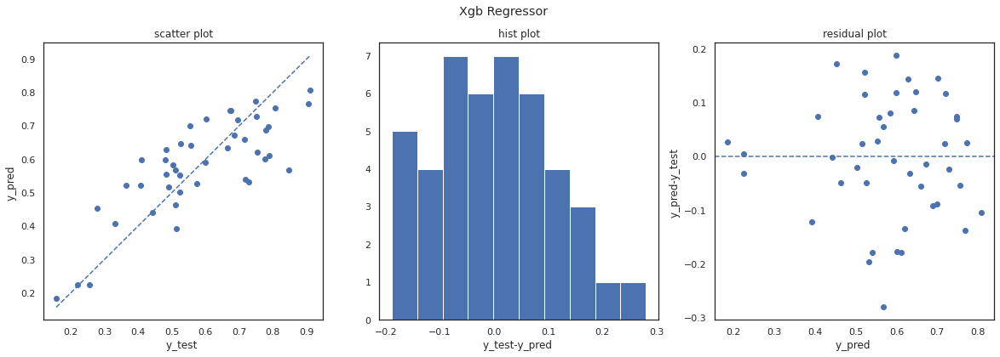


MAE:0.0897 MAPE:0.164 MSE:0.0121 RMSE:0.11 R2:0.634 SKB:0.731


In [ ]:
# target_var=['Height','Yield','Protein','Oil','Glucose']
target_var_index=target_var[0]
n=500
xgb=xgb_model(a[n][target_var_index],b[n][target_var_index],0.1)

In [ ]:
!pip3 install catboost

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 76.6 MB 1.2 MB/s 


In [ ]:
from catboost import CatBoostRegressor
def catboost_model(x,y,test_size=0.1,random_state=0):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = test_size,random_state=random_state)
    cat={}
    model = CatBoostRegressor()
    model.fit(x_train,y_train,verbose=False, plot=True)
    y_pred = model.predict(x_test)
    plotting(y_test,y_pred,title="Catboost") 
    folds = KFold(n_splits = 5, shuffle = True, random_state = 100)
    scores = cross_val_score(model, x_train, y_train, scoring='r2', cv=folds)

    cat['model']=model
    cat['matrix']=error_matrix(y_test,y_pred,True)
    cat['matrix']['CV']=np.mean(scores)
    return cat

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

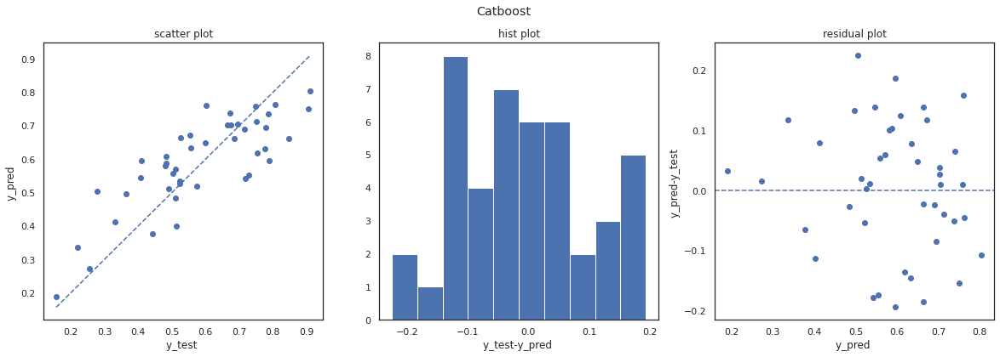

Streaming output truncated to the last 5000 lines.
6:	learn: 0.1584106	total: 93ms	remaining: 13.2s
7:	learn: 0.1571741	total: 100ms	remaining: 12.4s
8:	learn: 0.1554196	total: 107ms	remaining: 11.8s
9:	learn: 0.1536926	total: 115ms	remaining: 11.4s
10:	learn: 0.1522671	total: 121ms	remaining: 10.9s
11:	learn: 0.1509454	total: 129ms	remaining: 10.6s
12:	learn: 0.1496429	total: 136ms	remaining: 10.3s
13:	learn: 0.1483882	total: 142ms	remaining: 9.98s
14:	learn: 0.1470783	total: 149ms	remaining: 9.76s
15:	learn: 0.1456940	total: 155ms	remaining: 9.54s
16:	learn: 0.1444440	total: 162ms	remaining: 9.38s
17:	learn: 0.1433342	total: 169ms	remaining: 9.22s
18:	learn: 0.1420688	total: 177ms	remaining: 9.13s
19:	learn: 0.1409374	total: 190ms	remaining: 9.32s
20:	learn: 0.1396022	total: 201ms	remaining: 9.37s
21:	learn: 0.1384158	total: 216ms	remaining: 9.58s
22:	learn: 0.1375357	total: 223ms	remaining: 9.48s
23:	learn: 0.1362826	total: 231ms	remaining: 9.4s
24:	learn: 0.1352729	total: 239ms	rem

In [ ]:
import catboost
# target_var=['Height','Yield','Protein','Oil','Glucose']
target_var_index=target_var[0]
n=500
catboost=catboost_model(a[n][target_var_index],b[n][target_var_index],0.1)

In [ ]:
catboost['matrix']

{'MAE': 0.0885947456314007,
 'MAPE': 0.17353808935114995,
 'MSE': 0.01145087603821811,
 'RMSE': 0.10700876617463688,
 'R2': 0.6545744100130894,
 'SKB': array(0.7608711),
 'CV': 0.597393530993801}

In [ ]:
from sklearn.neighbors import KNeighborsRegressor
def knn_model(x,y,test_size=0.1,random_state=0):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = test_size,random_state=random_state)
    knn={}
    model = KNeighborsRegressor(n_neighbors=3)
    model.fit(x_train,y_train)
    y_pred = model.predict(x_test)
    folds = KFold(n_splits = 5, shuffle = True, random_state = 100)
    scores = cross_val_score(model, x_train, y_train, scoring='r2', cv=folds)
    

    plotting(y_test,y_pred,title="K-nearest neighbor Regressor") 
    knn['model']=model
    knn['matrix']=error_matrix(y_test,y_pred,True)
    knn['matrix']['CV']=np.mean(scores)
    return knn

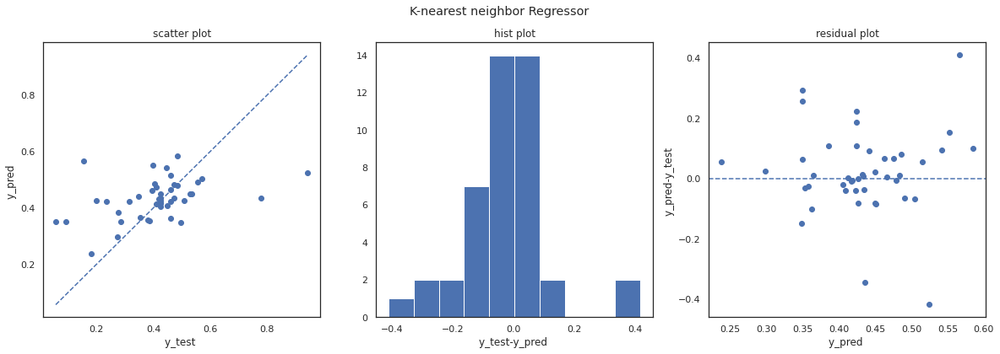


MAE:0.0936 MAPE:0.414 MSE:0.0197 RMSE:0.14 R2:0.16 SKB:0.462


In [ ]:
# target_var=['Height','Yield','Protein','Oil','Glucose']
target_var_index=target_var[1]
n=10
knn=knn_model(a[n][target_var_index],b[n][target_var_index],0.1)

In [ ]:
from numpy.random.mtrand import seed
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
import matplotlib.pyplot as plt
import numpy as np
# load pima indians dataset
#dataset = np.loadtxt("pima-indians-diabetes.csv", delimiter=",")
# split into input (X) and output (Y) variables
#X = dataset[:,0:8]
#Y = dataset[:,8]
# create model

def get_model(input_dim,output_dim=1,layers=[10,20,10]):

    model = Sequential()
    model.add(Dense(layers[0], input_dim=input_dim, kernel_initializer='he_uniform', activation='relu'))
    for layer in layers[1:]:
        model.add(Dense(layer, activation='relu'))
    model.add(Dense(output_dim))
    # Compile model
    model.compile(loss='mse', optimizer='adam', metrics=['accuracy'])

    return model

def fit_model(model,x,y,title,epochs=100):
# Fit the model
    history = model.fit(x, y, validation_split=0.1, epochs=epochs, batch_size=10, verbose=0,shuffle= True)
    # list all data in history
    print(history.history.keys())
    # summarize history for accuracy
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('model accuracy'+title)
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()
    # summarize history for loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss'+title)
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()
    return history

In [ ]:
def nn_model(x,y,test_size=0.1,output_dim=1,random_state=0,layers=[20,10,18,9,4]):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = test_size,random_state=random_state)
    nn={}
    model=get_model(x_train.shape[1],output_dim,layers)
    
    #nn['history']=fit_model(model,x_train,y_train,'(Height_Yield)',100)
    #model.fit(x, y, validation_split=0.1, epochs=100, batch_size=10, verbose=0,shuffle= True)

    ######
    history = model.fit(x, y, validation_split=0.2, epochs=10, batch_size=25, verbose=0,shuffle= True)
    # list all data in history
    print(history.history.keys())
    # summarize history for accuracy
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()
    # summarize history for loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()
    ######

    y_pred = model.predict(x_test)
    # folds = KFold(n_splits = 5, shuffle = True, random_state = 100)
    # scores = cross_val_score(model, x_train, y_train, scoring='r2', cv=folds)
    
    plotting(y_test,y_pred,title="Neural Network") 
    nn['model']=model
    nn['matrix']=error_matrix(y_test,y_pred,True)
    # nn['matrix']['CV']=np.mean(scores)
    return nn

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


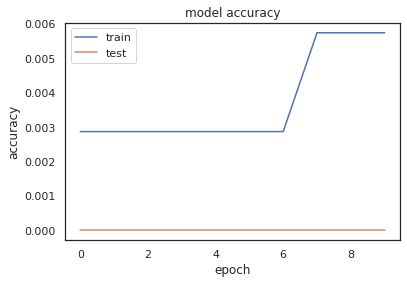

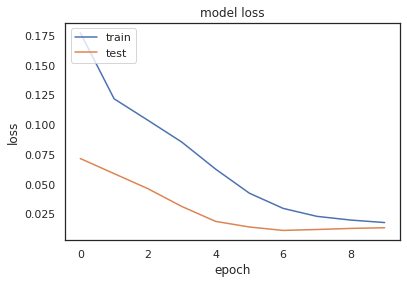

2/2 [==============================] - 0s 15ms/step


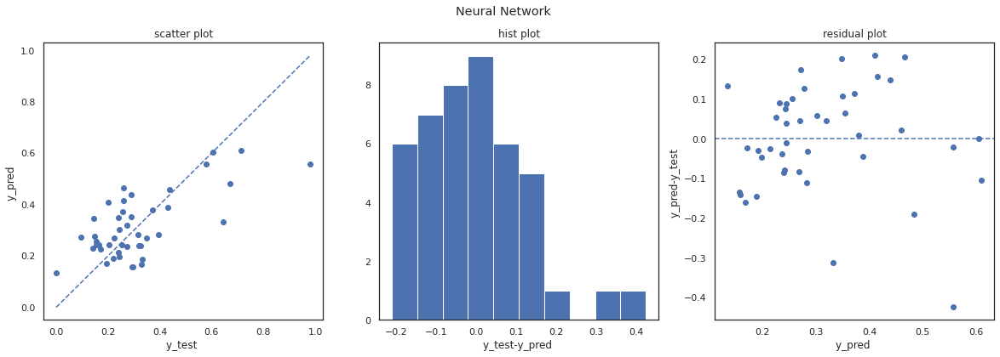


MAE:0.102 MAPE:inf MSE:0.0173 RMSE:0.132 R2:0.477 SKB:0.455


<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


In [ ]:
# target_var=['Height','Yield','Protein','Oil','Glucose']
target_var_index=target_var[4]
n=500
nn=nn_model(a[n][target_var_index],b[n][target_var_index],0.1)

# Heatmaps


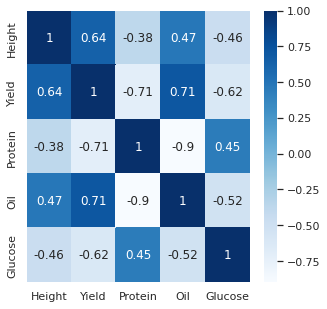

In [ ]:
plt.figure(figsize=(5,5))
sns.set_theme()
sns.heatmap(df_target.corr(),cbar=True,annot=True,cmap='Blues')

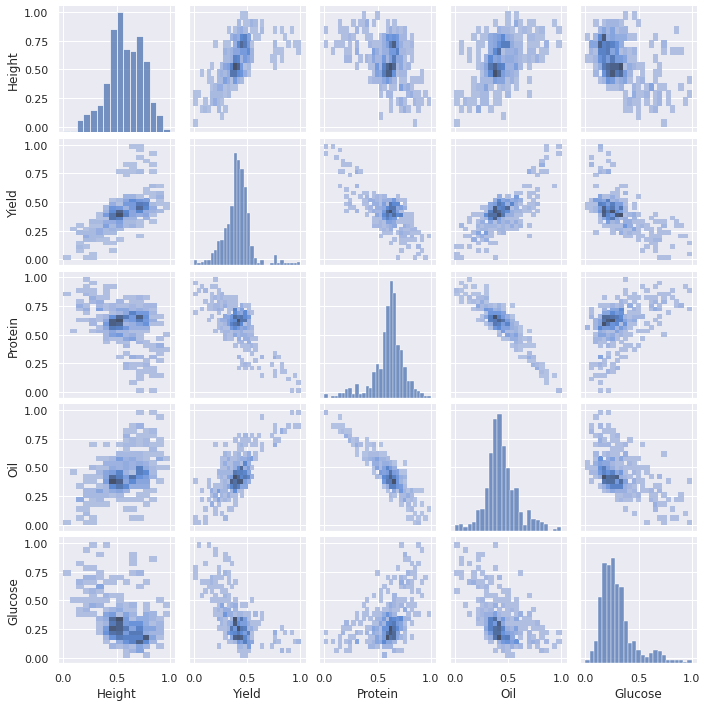

In [ ]:
sns.pairplot(df_target, kind="hist",height=2)
plt.show()

# Union of features


In [ ]:
#number of top features which we want to extract

features_number=[10,100,500]

x_target={}
y_target={}
indices={}
for num in features_number:
    x_target[num],y_target[num]=choose_features(new_x,num)
    indices[num]={}

In [ ]:
target_var=['Height','Yield','Protein','Oil','Glucose']

for num in features_number:
    for target in target_var:
        indices[num][target]=set(x_target[num][target].columns)

In [ ]:
x_union={}
y_union={}

#target_var=['Height','Yield','Protein','Oil','Glucose']

for num in features_number:
    x_union[num]={}
    y_union[num]={}
    for i in range(len(target_var)):
        x_union[num][target_var[i]]={}
        y_union[num][target_var[i]]={}
        for j in range(len(target_var)):
            if i<j:
                x_union[num][target_var[i]][target_var[j]]=x[indices[num][target_var[i]].union(indices[num][target_var[j]])]
                y_union[num][target_var[i]][target_var[j]]=df_target[[target_var[i],target_var[j]]]
            elif i>j:
                x_union[num][target_var[i]][target_var[j]]=x_union[num][target_var[j]][target_var[i]]
                y_union[num][target_var[i]][target_var[j]]=df_target[[target_var[i],target_var[j]]]
            else:
                #i==j
                #print(X[indices[num][target_var[i]]])
                x_union[num][target_var[i]][target_var[j]]=x[indices[num][target_var[i]].union(indices[num][target_var[j]])]
                y_union[num][target_var[i]][target_var[j]]=df_target[[target_var[i]]]

In [ ]:
target_indices_len={}
df_indices={}
for num in features_number:
    target_indices_len[num]=[]
    for target1 in target_var:
        l=[]
        for target2 in target_var:
            l.append(len(indices[num][target1].union(indices[num][target2])))
        target_indices_len[num].append(l.copy())
    df_indices[num] = pd.DataFrame(target_indices_len[num], index = target_var,columns = target_var)

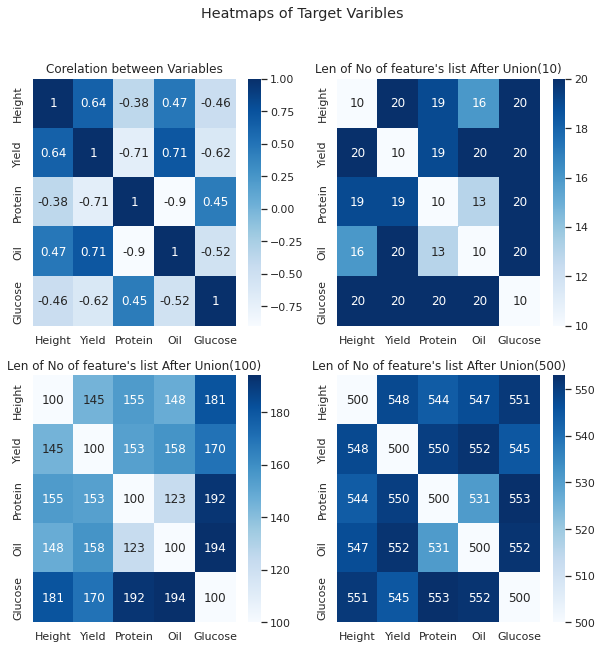

In [ ]:
figure, ((ax1,ax2),(ax3,ax4)) = plt.subplots(2,2)
figure.set_figheight(10)
figure.set_figwidth(10)
figure.suptitle("Heatmaps of Target Varibles")

sns.heatmap(df_indices[10],cbar=True,annot=True,cmap='Blues',fmt="d",ax=ax2)    
sns.heatmap(df_indices[100],cbar=True,annot=True,cmap='Blues',fmt="d",ax=ax3)
sns.heatmap(df_indices[500],cbar=True,annot=True,cmap='Blues',fmt="d",ax=ax4)
sns.heatmap(df_target.corr(),cbar=True,annot=True,cmap='Blues',ax=ax1)
ax2.set_title('Len of No of feature\'s list After Union(10)')
ax3.set_title('Len of No of feature\'s list After Union(100)')
ax4.set_title('Len of No of feature\'s list After Union(500)')
ax1.set_title('Corelation between Variables')
#print(target_indices_len)    
plt.show()

# random_forest_clubbed

In [ ]:
def train_clubbed_rf(x_union,y_union,num,var1,var2,test_size=0.1,random_State=0):
    x_train, x_test, y_train, y_test = train_test_split(x_union[num][var1][var2], y_union[num][var1][var2], test_size = 0.1,random_state=0)
            
    rf=RandomForestRegressor()
    rf.fit(x_train,y_train)
    y_pred = rf.predict(x_test) 
            
    print('--------------{} and {} are clubbed for n={}------------'.format(var1,var2,num))
    y_test_1=y_test[var1]
    print("\n{}'s error matrix clubbed for n={}".format(var1,num))
    em1=error_matrix(y_test_1,y_pred[:,0],True)

    y_test_2=y_test[var2]
    print("\n{}'s error matrix clubbed for n={}".format(var2,num))
    em2=error_matrix(y_test_2,y_pred[:,1],True)

    rf1=RandomForestRegressor()
    rf1.fit(x_train,y_train[var1])
    y_pred = rf1.predict(x_test) 
    print("\n{}'s error matrix individual for n={}".format(var1,num))
    em_ind1=error_matrix(y_test[var1],y_pred,True)

    rf2=RandomForestRegressor()
    rf2.fit(x_train,y_train[var2])
    y_pred = rf2.predict(x_test) 
    print("\n{}'s error matrix individual for n={}".format(var2,num))
    em_ind2=error_matrix(y_test[var2],y_pred,True)

    return em1,em2,em_ind1,em_ind2

In [ ]:
num=500
var1='Height'
var2='Glucose'
em=train_clubbed_rf(x_union,y_union,num,var1,var2,test_size=0.1,random_State=0)

--------------Height and Glucose are clubbed for n=500------------

Height's error matrix clubbed for n=500

MAE:0.0964 MAPE:0.201 MSE:0.0133 RMSE:0.115 R2:0.6 SKB:0.73

Glucose's error matrix clubbed for n=500

MAE:0.0697 MAPE:inf MSE:0.0102 RMSE:0.101 R2:0.693 SKB:0.695


<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))



Height's error matrix individual for n=500

MAE:0.0889 MAPE:0.182 MSE:0.011 RMSE:0.105 R2:0.669 SKB:0.784

Glucose's error matrix individual for n=500

MAE:0.0696 MAPE:inf MSE:0.0102 RMSE:0.101 R2:0.692 SKB:0.739


<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


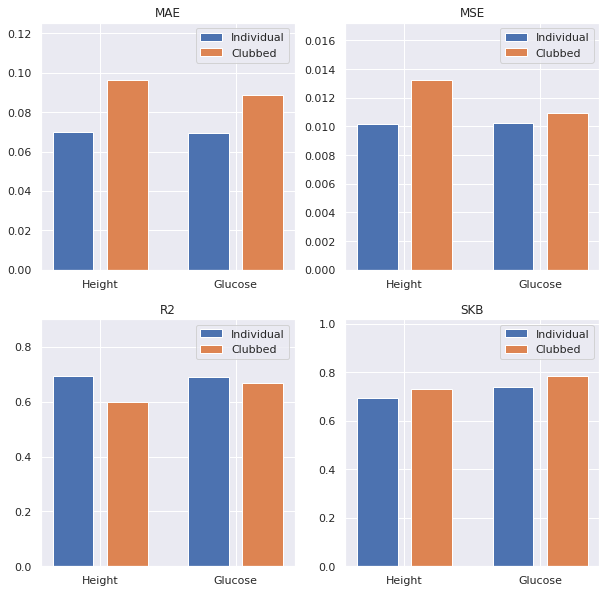

In [ ]:
temp_l=[[0,0],[0,0]]
temp_l2=[[0,0],[0,0]]
labels=[['MAE','MSE'],['R2','SKB']]
for i in range(2):
    l=[]
    for j in range(2):
        for ems in [em[0],em[2]]:
            l.append(ems[labels[i][j]])
        temp_l[i][j]=l.copy()
        l=[]
        for ems in [em[1],em[3]]:
            l.append(ems[labels[i][j]])
        temp_l2[i][j]=l.copy()
        l=[]
x_labels=[var1,var2]
X_axis = np.arange(2)
fig,ax=plt.subplots(2,2,gridspec_kw={'hspace': 0.2})
fig.set_figheight(10)
fig.set_figwidth(10)
fig.patch.set_facecolor('white')

for i in range(2):
    for j in range(2):
        ax[i][j].bar(X_axis-0.2, temp_l2[i][j],0.3,label = 'Individual')
        ax[i][j].bar(X_axis+0.2, temp_l[i][j],0.3,label = 'Clubbed')
        
        plt.sca(ax[i,j])
        plt.xticks(X_axis,[var1,var2])
        plt.title(labels[i][j])
        plt.ylim(top=1.3*max(max(temp_l2[i][j]),max(temp_l[i][j])))
        #plt.title(target_var[i])
        plt.legend(loc='upper right')

#fig.suptitle("R2 score of height(individual and clubbed)")

plt.show()

# Neural network clubbed


In [ ]:
from numpy.random.mtrand import seed
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
import matplotlib.pyplot as plt
import numpy as np
# load pima indians dataset
#dataset = np.loadtxt("pima-indians-diabetes.csv", delimiter=",")
# split into input (X) and output (Y) variables
#X = dataset[:,0:8]
#Y = dataset[:,8]
# create model

def get_model(input_dim,output_dim=1,layers=[10,20,10]):

    model = Sequential()
    model.add(Dense(layers[0], input_dim=input_dim, kernel_initializer='he_uniform', activation='relu'))
    for layer in layers[1:]:
        model.add(Dense(layer, activation='relu'))
    model.add(Dense(output_dim))
    # Compile model
    model.compile(loss='mse', optimizer='adam', metrics=['accuracy'])

    return model

def fit_model(model,x,y,title,epochs=100):
# Fit the model
    history = model.fit(x, y, validation_split=0.1, epochs=epochs, batch_size=10, verbose=0,shuffle= True)
    # list all data in history
    print(history.history.keys())
    # summarize history for accuracy
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('model accuracy'+title)
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()
    # summarize history for loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss'+title)
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()
    return history

In [ ]:
def nn_model(x_union,y_union,num,var1,var2,test_size=0.1,random_State=0,layers=[20,10,9,4]):
    x_train, x_test, y_train, y_test = train_test_split(x_union[num][var1][var2], y_union[num][var1][var2], test_size = 0.1,random_state=0)
    
    model=get_model(x_train.shape[1],2,layers)    
    model.fit(x_train, y_train, validation_split=0.2, epochs=50, batch_size=10, verbose=0,shuffle= True)
    y_pred = model.predict(x_test)
    
    print('--------------{} and {} are clubbed for n={}------------'.format(var1,var2,num))
    y_test_1=y_test[var1]
    print("\n{}'s error matrix clubbed for n={}".format(var1,num))
    em1=error_matrix(y_test_1,y_pred[:,0],True)

    y_test_2=y_test[var2]
    print("\n{}'s error matrix clubbed for n={}".format(var2,num))
    em2=error_matrix(y_test_2,y_pred[:,1],True)

    model1=get_model(x_train.shape[1],1,layers)    
    model1.fit(x_train,y_train[var1], validation_split=0.2, epochs=25, batch_size=10, verbose=0,shuffle= True)
    y_pred = model1.predict(x_test) 
    print("\n{}'s error matrix individual for n={}".format(var1,num))
    em_ind1=error_matrix(y_test[var1],y_pred,True)

    model2=get_model(x_train.shape[1],1,layers)    
    model2.fit(x_train,y_train[var1], validation_split=0.2, epochs=25, batch_size=10, verbose=0,shuffle= True)
    y_pred = model1.predict(x_test) 
    print("\n{}'s error matrix individual for n={}".format(var2,num))
    em_ind2=error_matrix(y_test[var2],y_pred,True)

    return em1,em2,em_ind1,em_ind2

In [ ]:
# num=10
# var1='Height'
# var2='Glucose'
# em=nn_model(x_union,y_union,num,var1,var2,test_size=0.1,random_State=0,layers=[5,2])

# Results


In [ ]:
trained_model_data={}
r2_score_matrix={}
skb_scores={}
for num in features_number:
    trained_model_data[num]={}
    r2_score_matrix[num]=np.ones(25).reshape((5,5))
    skb_scores[num]=np.ones(25).reshape((5,5))
    for i in range(len(target_var)-1):
        var1=target_var[i]
        trained_model_data[num][var1]={}
        for j in range(i+1,len(target_var)):
            
            var2=target_var[j]
            trained_model_data[num][var1][var2]={}
            
            x_train, x_test, y_train, y_test = train_test_split(x_union[num][var1][var2], y_union[num][var1][var2], test_size = 0.1,random_state=0)
            
            rf=RandomForestRegressor()
            rf.fit(x_train,y_train)
            y_pred = rf.predict(x_test) 
            
            print('--------------{} and {} are clubbed for n={}------------'.format(var1,var2,num))
            y_test_1=y_test[var1]
            print("{}'s error matrix clubbed for n={}".format(var1,num))
            em1=error_matrix(y_test_1,y_pred[:,0],True)

            y_test_2=y_test[var2]
            print("{}'s error matrix clubbed for n={}".format(var2,num))
            em2=error_matrix(y_test_2,y_pred[:,1],True)

            
            trained_model_data[num][var1][var2]['Combined']={}

            trained_model_data[num][var1][var2]['Combined'][var1]=em1
            trained_model_data[num][var1][var2]['Combined'][var2]=em2

            #individual 
            
            #for var1

            trained_model_data[num][var1][var2][var1]={}

            rf1=RandomForestRegressor()
            rf1.fit(x_train,y_train[var1])
            y_pred = rf1.predict(x_test) 
            print("{}'s error matrix individual for n={}".format(var1,num))
            em_ind1=error_matrix(y_test[var1],y_pred,True)
            trained_model_data[num][var1][var2][var1]['Error']=em_ind1 

            #for var2

            trained_model_data[num][var1][var2][var2]={}

            rf2=RandomForestRegressor()
            rf2.fit(x_train,y_train[var2])
            y_pred = rf2.predict(x_test) 
            print("{}'s error matrix individual for n={}".format(var2,num))
            em_ind2=error_matrix(y_test[var2],y_pred,True)
            trained_model_data[num][var1][var2][var2]['Error']=em_ind2

            # var2's(j) ratio when var1(i) is clubbed with
            r2_score_matrix[num][i][j]=em2['R2']/em_ind2['R2']
            r2_score_matrix[num][j][i]=em1['R2']/em_ind1['R2']
            skb_scores[num][i][j]=em2['SKB']/em_ind2['SKB']
            skb_scores[num][j][i]=em1['SKB']/em_ind1['SKB']

--------------Height and Yield are clubbed for n=10------------
Height's error matrix clubbed for n=10

MAE:0.112 MAPE:0.243 MSE:0.0187 RMSE:0.137 R2:0.437 SKB:0.632
Yield's error matrix clubbed for n=10

MAE:0.0809 MAPE:0.285 MSE:0.0148 RMSE:0.122 R2:0.369 SKB:0.593
Height's error matrix individual for n=10

MAE:0.107 MAPE:0.231 MSE:0.0181 RMSE:0.135 R2:0.454 SKB:0.663
Yield's error matrix individual for n=10

MAE:0.0751 MAPE:0.271 MSE:0.0139 RMSE:0.118 R2:0.406 SKB:0.641
--------------Height and Protein are clubbed for n=10------------
Height's error matrix clubbed for n=10

MAE:0.117 MAPE:0.244 MSE:0.0205 RMSE:0.143 R2:0.382 SKB:0.613
Protein's error matrix clubbed for n=10

MAE:0.108 MAPE:0.234 MSE:0.019 RMSE:0.138 R2:-0.0399 SKB:0.289
Height's error matrix individual for n=10

MAE:0.121 MAPE:0.254 MSE:0.0223 RMSE:0.149 R2:0.326 SKB:0.589
Protein's error matrix individual for n=10

MAE:0.106 MAPE:0.222 MSE:0.0186 RMSE:0.136 R2:-0.02 SKB:0.338
--------------Height and Oil are clubbe

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


Oil's error matrix individual for n=10

MAE:0.122 MAPE:inf MSE:0.0239 RMSE:0.154 R2:-0.0687 SKB:0.248


<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


--------------Height and Glucose are clubbed for n=10------------
Height's error matrix clubbed for n=10

MAE:0.11 MAPE:0.24 MSE:0.018 RMSE:0.134 R2:0.457 SKB:0.671
Glucose's error matrix clubbed for n=10

MAE:0.0943 MAPE:inf MSE:0.0146 RMSE:0.121 R2:0.56 SKB:0.648


<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


Height's error matrix individual for n=10

MAE:0.105 MAPE:0.232 MSE:0.0172 RMSE:0.131 R2:0.48 SKB:0.709
Glucose's error matrix individual for n=10

MAE:0.096 MAPE:inf MSE:0.0143 RMSE:0.119 R2:0.569 SKB:0.616


<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


--------------Yield and Protein are clubbed for n=10------------
Yield's error matrix clubbed for n=10

MAE:0.0818 MAPE:0.297 MSE:0.0157 RMSE:0.125 R2:0.331 SKB:0.572
Protein's error matrix clubbed for n=10

MAE:0.101 MAPE:0.214 MSE:0.017 RMSE:0.13 R2:0.0671 SKB:0.424
Yield's error matrix individual for n=10

MAE:0.083 MAPE:0.314 MSE:0.0162 RMSE:0.127 R2:0.309 SKB:0.532
Protein's error matrix individual for n=10

MAE:0.0977 MAPE:0.208 MSE:0.0158 RMSE:0.126 R2:0.133 SKB:0.44
--------------Yield and Oil are clubbed for n=10------------
Yield's error matrix clubbed for n=10

MAE:0.0824 MAPE:0.284 MSE:0.0159 RMSE:0.126 R2:0.321 SKB:0.54
Oil's error matrix clubbed for n=10

MAE:0.12 MAPE:inf MSE:0.0225 RMSE:0.15 R2:-0.00719 SKB:0.283


<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


Yield's error matrix individual for n=10

MAE:0.0863 MAPE:0.331 MSE:0.0172 RMSE:0.131 R2:0.267 SKB:0.492
Oil's error matrix individual for n=10

MAE:0.113 MAPE:inf MSE:0.0218 RMSE:0.148 R2:0.0229 SKB:0.31


<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


--------------Yield and Glucose are clubbed for n=10------------
Yield's error matrix clubbed for n=10

MAE:0.0857 MAPE:0.281 MSE:0.017 RMSE:0.13 R2:0.276 SKB:0.468
Glucose's error matrix clubbed for n=10

MAE:0.0926 MAPE:inf MSE:0.0132 RMSE:0.115 R2:0.601 SKB:0.461


<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


Yield's error matrix individual for n=10

MAE:0.0786 MAPE:0.257 MSE:0.0137 RMSE:0.117 R2:0.416 SKB:0.588
Glucose's error matrix individual for n=10

MAE:0.0919 MAPE:inf MSE:0.0136 RMSE:0.117 R2:0.588 SKB:0.489
--------------Protein and Oil are clubbed for n=10------------
Protein's error matrix clubbed for n=10

MAE:0.11 MAPE:0.23 MSE:0.0198 RMSE:0.141 R2:-0.0854 SKB:0.367
Oil's error matrix clubbed for n=10


<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))
<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))



MAE:0.118 MAPE:inf MSE:0.024 RMSE:0.155 R2:-0.0764 SKB:0.289
Protein's error matrix individual for n=10

MAE:0.106 MAPE:0.223 MSE:0.0186 RMSE:0.136 R2:-0.0193 SKB:0.388
Oil's error matrix individual for n=10

MAE:0.114 MAPE:inf MSE:0.0227 RMSE:0.151 R2:-0.0164 SKB:0.278


<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


--------------Protein and Glucose are clubbed for n=10------------
Protein's error matrix clubbed for n=10

MAE:0.1 MAPE:0.208 MSE:0.0174 RMSE:0.132 R2:0.0445 SKB:0.456
Glucose's error matrix clubbed for n=10

MAE:0.0844 MAPE:inf MSE:0.0129 RMSE:0.114 R2:0.61 SKB:0.51


<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


Protein's error matrix individual for n=10

MAE:0.0999 MAPE:0.207 MSE:0.0172 RMSE:0.131 R2:0.0576 SKB:0.478
Glucose's error matrix individual for n=10

MAE:0.0819 MAPE:inf MSE:0.0123 RMSE:0.111 R2:0.63 SKB:0.53


<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


--------------Oil and Glucose are clubbed for n=10------------
Oil's error matrix clubbed for n=10

MAE:0.102 MAPE:inf MSE:0.0178 RMSE:0.134 R2:0.202 SKB:0.438
Glucose's error matrix clubbed for n=10

MAE:0.0855 MAPE:inf MSE:0.0126 RMSE:0.112 R2:0.618 SKB:0.619


<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))
<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


Oil's error matrix individual for n=10

MAE:0.111 MAPE:inf MSE:0.0209 RMSE:0.145 R2:0.0639 SKB:0.382


<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


Glucose's error matrix individual for n=10

MAE:0.0914 MAPE:inf MSE:0.0154 RMSE:0.124 R2:0.534 SKB:0.648


<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


--------------Height and Yield are clubbed for n=100------------
Height's error matrix clubbed for n=100

MAE:0.0921 MAPE:0.189 MSE:0.012 RMSE:0.11 R2:0.638 SKB:0.754
Yield's error matrix clubbed for n=100

MAE:0.0688 MAPE:0.242 MSE:0.0122 RMSE:0.111 R2:0.48 SKB:0.696
Height's error matrix individual for n=100

MAE:0.0933 MAPE:0.185 MSE:0.012 RMSE:0.11 R2:0.637 SKB:0.726
Yield's error matrix individual for n=100

MAE:0.0756 MAPE:0.273 MSE:0.0123 RMSE:0.111 R2:0.478 SKB:0.648
--------------Height and Protein are clubbed for n=100------------
Height's error matrix clubbed for n=100

MAE:0.102 MAPE:0.205 MSE:0.0149 RMSE:0.122 R2:0.551 SKB:0.659
Protein's error matrix clubbed for n=100

MAE:0.0838 MAPE:0.185 MSE:0.0107 RMSE:0.103 R2:0.416 SKB:0.544
Height's error matrix individual for n=100

MAE:0.0984 MAPE:0.192 MSE:0.0127 RMSE:0.113 R2:0.616 SKB:0.719
Protein's error matrix individual for n=100

MAE:0.0871 MAPE:0.184 MSE:0.0117 RMSE:0.108 R2:0.361 SKB:0.529
--------------Height and Oil a

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


Height's error matrix individual for n=100

MAE:0.0993 MAPE:0.192 MSE:0.0127 RMSE:0.113 R2:0.616 SKB:0.724
Oil's error matrix individual for n=100

MAE:0.101 MAPE:inf MSE:0.0172 RMSE:0.131 R2:0.23 SKB:0.405


<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


--------------Height and Glucose are clubbed for n=100------------
Height's error matrix clubbed for n=100

MAE:0.0932 MAPE:0.193 MSE:0.0121 RMSE:0.11 R2:0.636 SKB:0.746
Glucose's error matrix clubbed for n=100

MAE:0.0698 MAPE:inf MSE:0.00997 RMSE:0.0999 R2:0.699 SKB:0.66


<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


Height's error matrix individual for n=100

MAE:0.0909 MAPE:0.185 MSE:0.0117 RMSE:0.108 R2:0.647 SKB:0.757
Glucose's error matrix individual for n=100

MAE:0.0692 MAPE:inf MSE:0.00929 RMSE:0.0964 R2:0.719 SKB:0.629


<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


--------------Yield and Protein are clubbed for n=100------------
Yield's error matrix clubbed for n=100

MAE:0.0729 MAPE:0.262 MSE:0.0116 RMSE:0.108 R2:0.506 SKB:0.564
Protein's error matrix clubbed for n=100

MAE:0.0833 MAPE:0.179 MSE:0.0106 RMSE:0.103 R2:0.418 SKB:0.578
Yield's error matrix individual for n=100

MAE:0.0674 MAPE:0.234 MSE:0.0108 RMSE:0.104 R2:0.541 SKB:0.622
Protein's error matrix individual for n=100

MAE:0.0861 MAPE:0.179 MSE:0.0109 RMSE:0.105 R2:0.4 SKB:0.511
--------------Yield and Oil are clubbed for n=100------------
Yield's error matrix clubbed for n=100

MAE:0.0704 MAPE:0.246 MSE:0.0114 RMSE:0.107 R2:0.513 SKB:0.55
Oil's error matrix clubbed for n=100

MAE:0.0996 MAPE:inf MSE:0.0169 RMSE:0.13 R2:0.241 SKB:0.444


<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


Yield's error matrix individual for n=100

MAE:0.0672 MAPE:0.241 MSE:0.0108 RMSE:0.104 R2:0.542 SKB:0.626
Oil's error matrix individual for n=100

MAE:0.0962 MAPE:inf MSE:0.016 RMSE:0.127 R2:0.282 SKB:0.359


<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


--------------Yield and Glucose are clubbed for n=100------------
Yield's error matrix clubbed for n=100

MAE:0.0724 MAPE:0.246 MSE:0.0121 RMSE:0.11 R2:0.484 SKB:0.585
Glucose's error matrix clubbed for n=100

MAE:0.0669 MAPE:inf MSE:0.00872 RMSE:0.0934 R2:0.737 SKB:0.683


<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


Yield's error matrix individual for n=100

MAE:0.0701 MAPE:0.243 MSE:0.0113 RMSE:0.106 R2:0.519 SKB:0.624
Glucose's error matrix individual for n=100

MAE:0.0659 MAPE:inf MSE:0.00923 RMSE:0.0961 R2:0.721 SKB:0.641


<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


--------------Protein and Oil are clubbed for n=100------------
Protein's error matrix clubbed for n=100

MAE:0.0861 MAPE:0.186 MSE:0.0121 RMSE:0.11 R2:0.336 SKB:0.512
Oil's error matrix clubbed for n=100

MAE:0.0981 MAPE:inf MSE:0.0157 RMSE:0.125 R2:0.297 SKB:0.438


<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


Protein's error matrix individual for n=100

MAE:0.0888 MAPE:0.185 MSE:0.0114 RMSE:0.107 R2:0.375 SKB:0.513
Oil's error matrix individual for n=100

MAE:0.0969 MAPE:inf MSE:0.0162 RMSE:0.127 R2:0.275 SKB:0.465


<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


--------------Protein and Glucose are clubbed for n=100------------
Protein's error matrix clubbed for n=100

MAE:0.0935 MAPE:0.201 MSE:0.0128 RMSE:0.113 R2:0.296 SKB:0.486
Glucose's error matrix clubbed for n=100

MAE:0.0707 MAPE:inf MSE:0.00929 RMSE:0.0964 R2:0.719 SKB:0.648


<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


Protein's error matrix individual for n=100

MAE:0.0876 MAPE:0.185 MSE:0.0117 RMSE:0.108 R2:0.36 SKB:0.52
Glucose's error matrix individual for n=100

MAE:0.0645 MAPE:inf MSE:0.00808 RMSE:0.0899 R2:0.756 SKB:0.662


<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


--------------Oil and Glucose are clubbed for n=100------------
Oil's error matrix clubbed for n=100

MAE:0.101 MAPE:inf MSE:0.0171 RMSE:0.131 R2:0.232 SKB:0.401
Glucose's error matrix clubbed for n=100

MAE:0.0657 MAPE:inf MSE:0.00862 RMSE:0.0929 R2:0.74 SKB:0.71


<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))
<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


Oil's error matrix individual for n=100

MAE:0.0976 MAPE:inf MSE:0.0168 RMSE:0.13 R2:0.246 SKB:0.429


<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


Glucose's error matrix individual for n=100

MAE:0.0642 MAPE:inf MSE:0.00816 RMSE:0.0903 R2:0.754 SKB:0.702


<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


--------------Height and Yield are clubbed for n=500------------
Height's error matrix clubbed for n=500

MAE:0.0866 MAPE:0.175 MSE:0.0117 RMSE:0.108 R2:0.646 SKB:0.796
Yield's error matrix clubbed for n=500

MAE:0.0704 MAPE:0.246 MSE:0.0111 RMSE:0.105 R2:0.529 SKB:0.601
Height's error matrix individual for n=500

MAE:0.09 MAPE:0.185 MSE:0.0118 RMSE:0.108 R2:0.645 SKB:0.789
Yield's error matrix individual for n=500

MAE:0.0651 MAPE:0.232 MSE:0.0105 RMSE:0.102 R2:0.554 SKB:0.626
--------------Height and Protein are clubbed for n=500------------
Height's error matrix clubbed for n=500

MAE:0.0941 MAPE:0.191 MSE:0.013 RMSE:0.114 R2:0.609 SKB:0.75
Protein's error matrix clubbed for n=500

MAE:0.0863 MAPE:0.192 MSE:0.0111 RMSE:0.105 R2:0.393 SKB:0.51
Height's error matrix individual for n=500

MAE:0.0868 MAPE:0.182 MSE:0.0114 RMSE:0.107 R2:0.657 SKB:0.797
Protein's error matrix individual for n=500

MAE:0.0881 MAPE:0.189 MSE:0.0116 RMSE:0.108 R2:0.362 SKB:0.505
--------------Height and Oil 

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


Height's error matrix individual for n=500

MAE:0.0872 MAPE:0.178 MSE:0.0115 RMSE:0.107 R2:0.653 SKB:0.778
Oil's error matrix individual for n=500

MAE:0.0952 MAPE:inf MSE:0.0156 RMSE:0.125 R2:0.302 SKB:0.427


<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


--------------Height and Glucose are clubbed for n=500------------
Height's error matrix clubbed for n=500

MAE:0.0927 MAPE:0.187 MSE:0.0121 RMSE:0.11 R2:0.635 SKB:0.77
Glucose's error matrix clubbed for n=500

MAE:0.0708 MAPE:inf MSE:0.0105 RMSE:0.102 R2:0.684 SKB:0.711


<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


Height's error matrix individual for n=500

MAE:0.0866 MAPE:0.172 MSE:0.011 RMSE:0.105 R2:0.667 SKB:0.782
Glucose's error matrix individual for n=500

MAE:0.0682 MAPE:inf MSE:0.00919 RMSE:0.0959 R2:0.722 SKB:0.717


<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


--------------Yield and Protein are clubbed for n=500------------
Yield's error matrix clubbed for n=500

MAE:0.0745 MAPE:0.271 MSE:0.0126 RMSE:0.112 R2:0.463 SKB:0.544
Protein's error matrix clubbed for n=500

MAE:0.0871 MAPE:0.192 MSE:0.0116 RMSE:0.108 R2:0.363 SKB:0.554
Yield's error matrix individual for n=500

MAE:0.0652 MAPE:0.237 MSE:0.0113 RMSE:0.106 R2:0.52 SKB:0.581
Protein's error matrix individual for n=500

MAE:0.0873 MAPE:0.19 MSE:0.0118 RMSE:0.109 R2:0.354 SKB:0.524
--------------Yield and Oil are clubbed for n=500------------
Yield's error matrix clubbed for n=500

MAE:0.0703 MAPE:0.249 MSE:0.0118 RMSE:0.109 R2:0.497 SKB:0.572
Oil's error matrix clubbed for n=500

MAE:0.0939 MAPE:inf MSE:0.0151 RMSE:0.123 R2:0.323 SKB:0.455


<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


Yield's error matrix individual for n=500

MAE:0.0678 MAPE:0.24 MSE:0.0108 RMSE:0.104 R2:0.539 SKB:0.561
Oil's error matrix individual for n=500

MAE:0.0964 MAPE:inf MSE:0.0156 RMSE:0.125 R2:0.302 SKB:0.437


<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


--------------Yield and Glucose are clubbed for n=500------------
Yield's error matrix clubbed for n=500

MAE:0.0738 MAPE:0.277 MSE:0.0122 RMSE:0.11 R2:0.48 SKB:0.527
Glucose's error matrix clubbed for n=500

MAE:0.0696 MAPE:inf MSE:0.0103 RMSE:0.102 R2:0.688 SKB:0.711


<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


Yield's error matrix individual for n=500

MAE:0.0676 MAPE:0.24 MSE:0.011 RMSE:0.105 R2:0.53 SKB:0.606
Glucose's error matrix individual for n=500

MAE:0.0671 MAPE:inf MSE:0.00907 RMSE:0.0952 R2:0.726 SKB:0.737


<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


--------------Protein and Oil are clubbed for n=500------------
Protein's error matrix clubbed for n=500

MAE:0.0876 MAPE:0.191 MSE:0.0122 RMSE:0.11 R2:0.333 SKB:0.533
Oil's error matrix clubbed for n=500

MAE:0.0951 MAPE:inf MSE:0.0157 RMSE:0.125 R2:0.298 SKB:0.466


<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


Protein's error matrix individual for n=500

MAE:0.0849 MAPE:0.188 MSE:0.0113 RMSE:0.106 R2:0.379 SKB:0.56
Oil's error matrix individual for n=500

MAE:0.0961 MAPE:inf MSE:0.0162 RMSE:0.127 R2:0.276 SKB:0.425


<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


--------------Protein and Glucose are clubbed for n=500------------
Protein's error matrix clubbed for n=500

MAE:0.0895 MAPE:0.196 MSE:0.0119 RMSE:0.109 R2:0.346 SKB:0.476
Glucose's error matrix clubbed for n=500

MAE:0.0696 MAPE:inf MSE:0.00945 RMSE:0.0972 R2:0.714 SKB:0.689


<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


Protein's error matrix individual for n=500

MAE:0.089 MAPE:0.191 MSE:0.0119 RMSE:0.109 R2:0.35 SKB:0.523
Glucose's error matrix individual for n=500

MAE:0.0695 MAPE:inf MSE:0.0104 RMSE:0.102 R2:0.686 SKB:0.694


<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


--------------Oil and Glucose are clubbed for n=500------------
Oil's error matrix clubbed for n=500

MAE:0.0958 MAPE:inf MSE:0.0157 RMSE:0.125 R2:0.298 SKB:0.453
Glucose's error matrix clubbed for n=500

MAE:0.0652 MAPE:inf MSE:0.00879 RMSE:0.0938 R2:0.735 SKB:0.748


<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))
<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


Oil's error matrix individual for n=500

MAE:0.0937 MAPE:inf MSE:0.0155 RMSE:0.124 R2:0.306 SKB:0.457


<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


Glucose's error matrix individual for n=500

MAE:0.0672 MAPE:inf MSE:0.00998 RMSE:0.0999 R2:0.699 SKB:0.734


<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


In [ ]:
samples_len={}
for num in features_number:
    samples_len[num]=np.ones(25).reshape((5,5))*num
    i=0
    for target1 in target_var:
        j=0
        for target2 in target_var:
            samples_len[num][i][j]=int(len(indices[num][target1].union(indices[num][target2])))
            j+=1 
        i+=1

In [ ]:
df_indices={}
df_avg={}
df_samples={}
for num in features_number:
    df_indices[num] = pd.DataFrame(r2_score_matrix[num], index = target_var,columns = target_var)
    df_avg[num] = pd.DataFrame((r2_score_matrix[num]+r2_score_matrix[num].T)/2, index = target_var,columns = target_var)
    df_samples[num]=pd.DataFrame(samples_len[num], index = target_var,columns = target_var).astype('int')
cor_mat=df_target.corr()

df_indices_skb={}
df_avg_skb={}
for num in features_number:
    df_indices_skb[num] = pd.DataFrame(skb_scores[num], index = target_var,columns = target_var)
    df_avg_skb[num] = pd.DataFrame((skb_scores[num]+skb_scores[num].T)/2, index = target_var,columns = target_var)

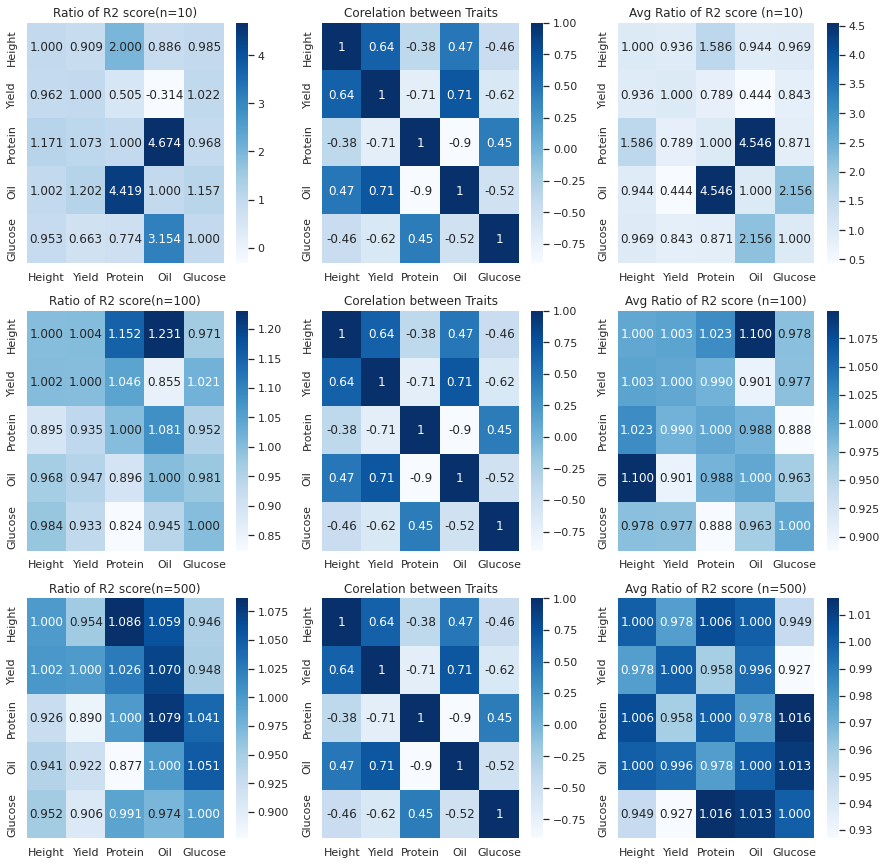

In [ ]:
figure,ax = plt.subplots(3,3)
figure.set_figheight(15)
figure.set_figwidth(15)
figure.patch.set_facecolor('white')
#figure.suptitle("Heatmaps of Target Varibles(R2)")

for i in range(3):
    num=features_number[i]
    sns.heatmap(df_indices[num],cbar=True,annot=True,cmap='Blues',fmt=".3f",ax=ax[i][0])    
    sns.heatmap(cor_mat,cbar=True,annot=True,cmap='Blues',ax=ax[i][1])
    mask = np.triu(np.ones_like(df_avg[num]))
    sns.heatmap(df_avg[num],cbar=True,annot=True,cmap='Blues',fmt=".3f",ax=ax[i][2])
    #sns.heatmap(df_samples[num],cbar=True,annot=True,cmap='Blues',fmt="d",ax=ax[i][3])
    ax[i][0].set_title('Ratio of R2 score(n={})'.format(num))
    ax[i][1].set_title('Corelation between Traits')
    ax[i][2].set_title('Avg Ratio of R2 score (n={})'.format(num))
    #ax[i][3].set_title('Union feature set length for (n={})'.format(num))

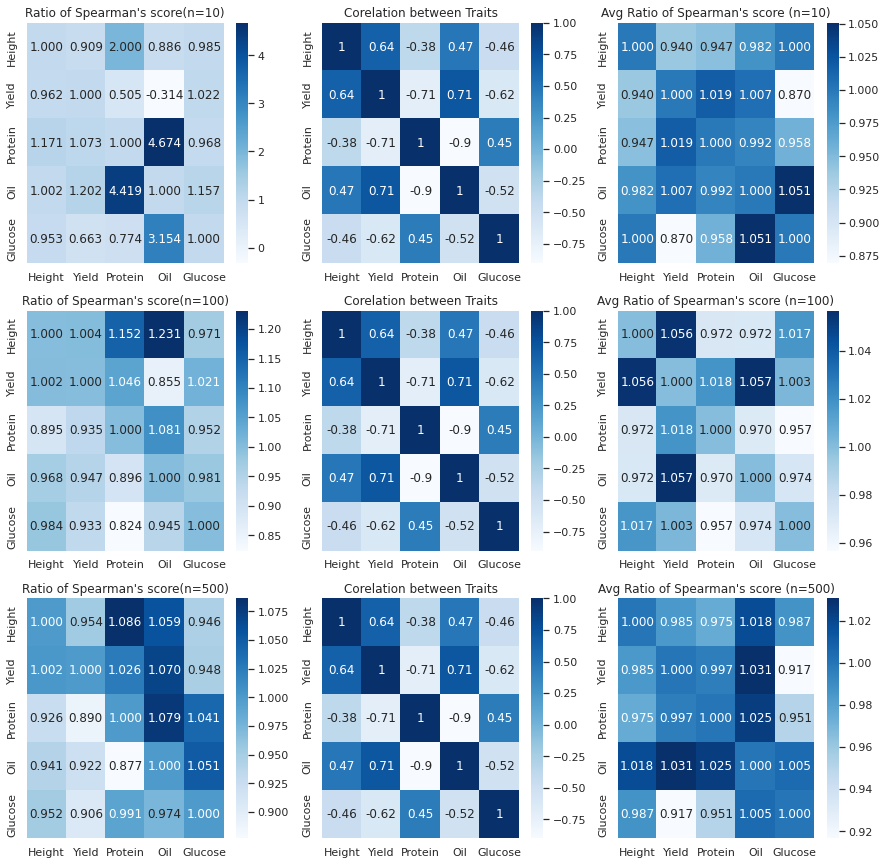

In [ ]:
figure,ax = plt.subplots(3,3)
figure.set_figheight(15)
figure.set_figwidth(15)
figure.patch.set_facecolor('white')
#figure.suptitle("Heatmaps of Target Varibles(Spearman's Rank-Order Correlation score)")

for i in range(3):
    num=features_number[i]
    sns.heatmap(df_indices[num],cbar=True,annot=True,cmap='Blues',fmt=".3f",ax=ax[i][0])    
    sns.heatmap(cor_mat,cbar=True,annot=True,cmap='Blues',ax=ax[i][1])
    mask = np.triu(np.ones_like(df_avg_skb[num]))
    sns.heatmap(df_avg_skb[num],cbar=True,annot=True,cmap='Blues',fmt=".3f",ax=ax[i][2])
    #sns.heatmap(df_samples[num],cbar=True,annot=True,cmap='Blues',fmt="d",ax=ax[i][3])
    ax[i][0].set_title('Ratio of Spearman\'s score(n={})'.format(num))
    ax[i][1].set_title('Corelation between Traits')
    ax[i][2].set_title('Avg Ratio of Spearman\'s score (n={})'.format(num))
    #ax[i][3].set_title('Union feature set length for (n={})'.format(num))

plt.show()

In [ ]:
temp_l={}
temp_l_skb={}
for j in range(5):
    var1=target_var[j]
    temp_l[var1]={}
    temp_l_skb[var1]={}
    for num in features_number:
        
        temp_l[var1][num]={}
        temp_l[var1][num]['ind']=[]
        temp_l[var1][num]['com']=[]

        temp_l_skb[var1][num]={}
        temp_l_skb[var1][num]['ind']=[]
        temp_l_skb[var1][num]['com']=[]
        
        
        for i in range(5):
            if i==j:
                continue
            var2=target_var[i]

            if i>j:
                temp_l[var1][num]['ind'].append(trained_model_data[num][var1][var2]['Combined'][var1]['R2'])
                temp_l[var1][num]['com'].append(trained_model_data[num][var1][var2][var1]['Error']['R2'])

                temp_l_skb[var1][num]['ind'].append(trained_model_data[num][var1][var2]['Combined'][var1]['SKB'])
                temp_l_skb[var1][num]['com'].append(trained_model_data[num][var1][var2][var1]['Error']['SKB'])

            if i<j:
                temp_l[var1][num]['ind'].append(trained_model_data[num][var2][var1]['Combined'][var2]['R2'])
                temp_l[var1][num]['com'].append(trained_model_data[num][var2][var1][var1]['Error']['R2'])

                temp_l_skb[var1][num]['ind'].append(trained_model_data[num][var2][var1]['Combined'][var2]['SKB'])
                temp_l_skb[var1][num]['com'].append(trained_model_data[num][var2][var1][var1]['Error']['SKB'])
                                


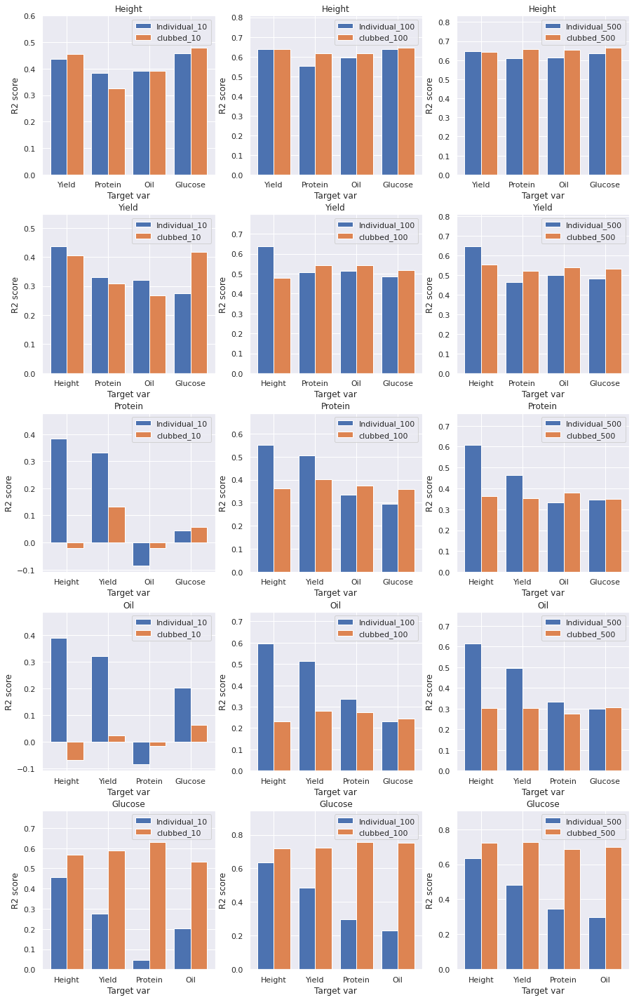

In [ ]:

X_axis = np.arange(len(target_var)-1)
fig,ax=plt.subplots(5,3,gridspec_kw={'hspace': 0.25})
fig.set_figheight(25)
fig.set_figwidth(15)
fig.patch.set_facecolor('white')

for i in range(5):
    for j in range(3):
        ax[i][j].bar(X_axis - 0.2, temp_l[target_var[i]][features_number[j]]['ind'], 0.4, label = 'Individual_'+str(features_number[j]))
        ax[i][j].bar(X_axis +0.2, temp_l[target_var[i]][features_number[j]]['com'], 0.4, label = 'clubbed_'+str(features_number[j]))
        plt.sca(ax[i,j])
        plt.xticks(X_axis,target_var[:i]+target_var[i+1:])
        plt.title(target_var[i])
        plt.ylim(top=1.25*max(max(temp_l[target_var[i]][features_number[j]]['ind']),max(temp_l[target_var[i]][features_number[j]]['com'])))

for axs in ax.flat:
    axs.set(xlabel='Target var', ylabel='R2 score')
    axs.legend(loc='upper right')

#fig.suptitle("R2 score of height(individual and clubbed)")

plt.show()

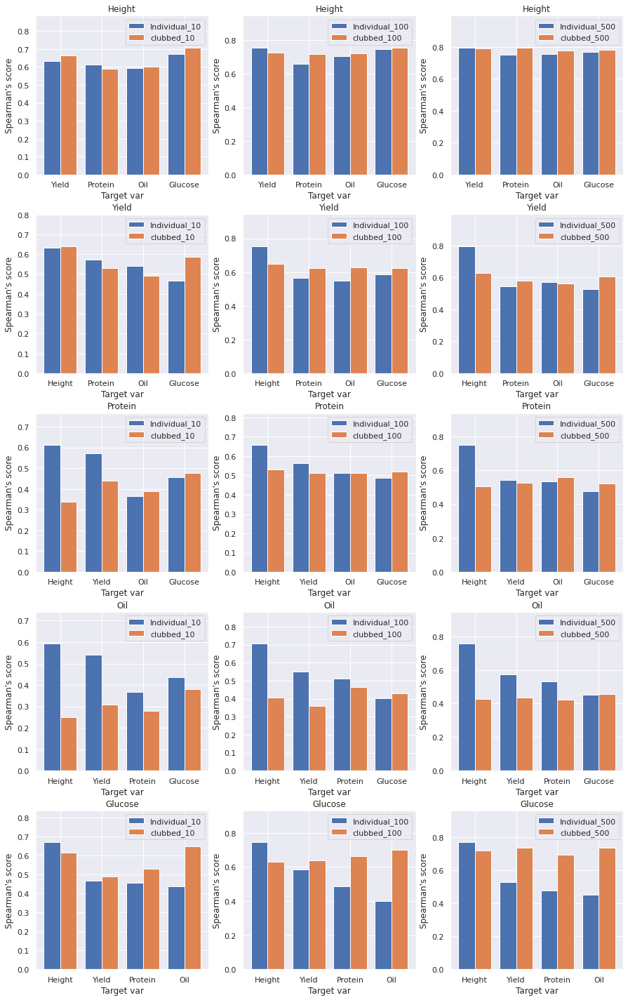

In [ ]:

X_axis = np.arange(len(target_var)-1)
fig,ax=plt.subplots(5,3,gridspec_kw={'hspace': 0.25})
fig.set_figheight(25)
fig.set_figwidth(15)
fig.patch.set_facecolor('white')

for i in range(5):
    for j in range(3):
        ax[i][j].bar(X_axis - 0.2, temp_l_skb[target_var[i]][features_number[j]]['ind'], 0.4, label = 'Individual_'+str(features_number[j]))
        ax[i][j].bar(X_axis +0.2, temp_l_skb[target_var[i]][features_number[j]]['com'], 0.4, label = 'clubbed_'+str(features_number[j])) 
        plt.sca(ax[i,j])
        plt.xticks(X_axis,target_var[:i]+target_var[i+1:])
        plt.title(target_var[i])
        plt.ylim(top=1.25*max(max(temp_l_skb[target_var[i]][features_number[j]]['ind']),max(temp_l_skb[target_var[i]][features_number[j]]['com'])))

for axs in ax.flat:
    axs.set(xlabel='Target var', ylabel='Spearman\'s score')
    axs.legend(loc='upper right')

#fig.suptitle("SKB score of height(individual and clubbed)")

plt.show()

In [ ]:
models_function=[linear_regression_model,lasso_regression_model,ridge_regression_model,decision_tree_model,adaboost_model,random_forest_model,catboost_model,xgb_model,knn_model]


#lr=linear_regression_model(a[n][target_var_index],b[n][target_var_index],0.1)
#models=[lr,lasso,ridge,Dtree,adaboost,RF,catboost,xgb,knn]
target_var_index=target_var[0]
n=10
models=[model(a[n][target_var_index],b[n][target_var_index],0.1) for model in models_function]


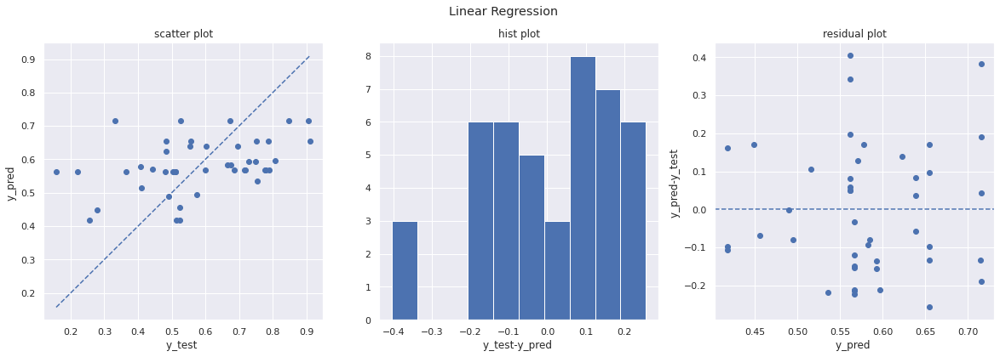


MAE:0.143 MAPE:0.326 MSE:0.028 RMSE:0.167 R2:0.157 SKB:0.445


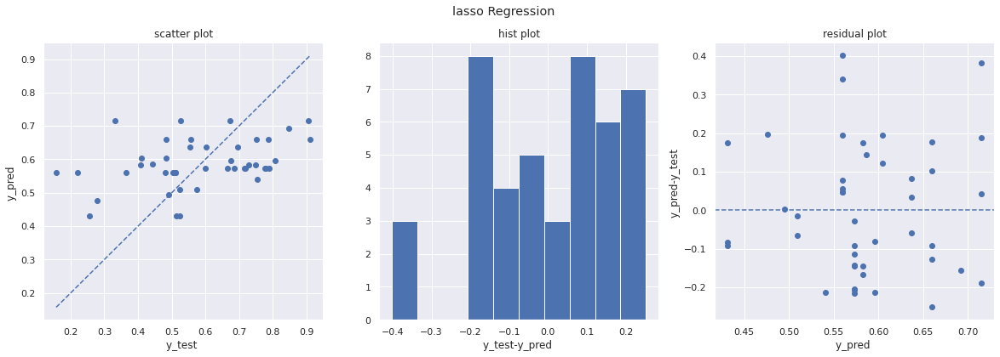


MAE:0.143 MAPE:0.329 MSE:0.0284 RMSE:0.168 R2:0.144 SKB:0.384


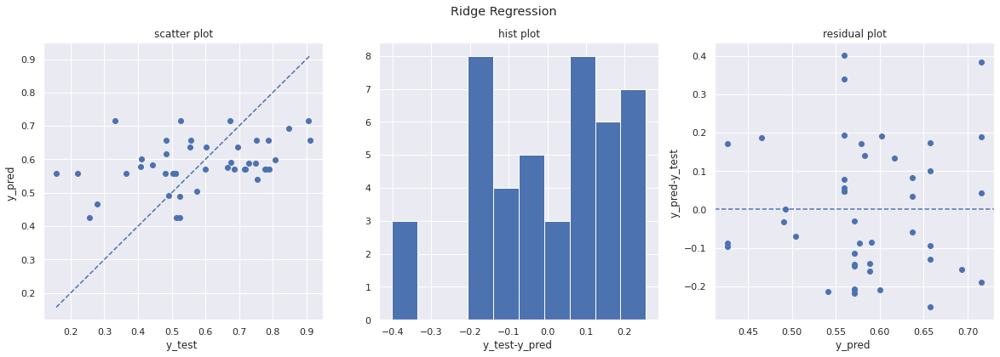


MAE:0.143 MAPE:0.329 MSE:0.0283 RMSE:0.168 R2:0.146 SKB:0.392

MAE:0.119 MAPE:0.282 MSE:0.0227 RMSE:0.151 R2:0.316 SKB:0.631


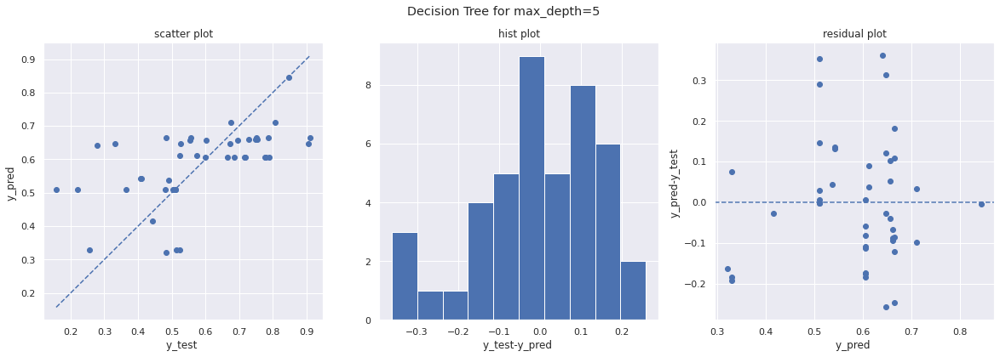


MAE:0.125 MAPE:0.293 MSE:0.0247 RMSE:0.157 R2:0.255 SKB:0.479


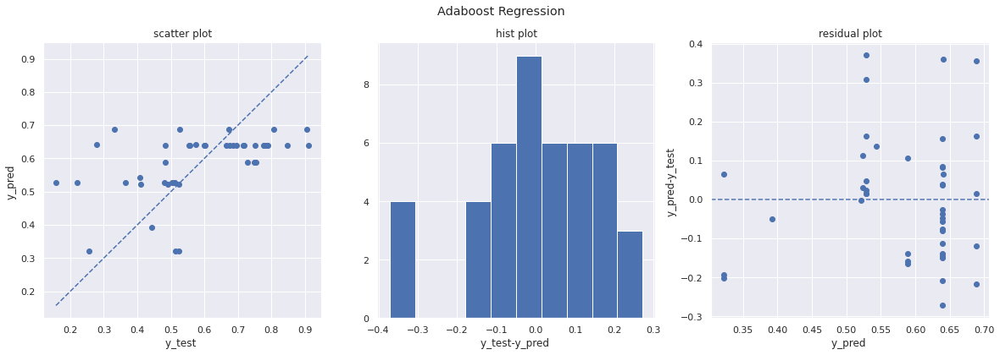

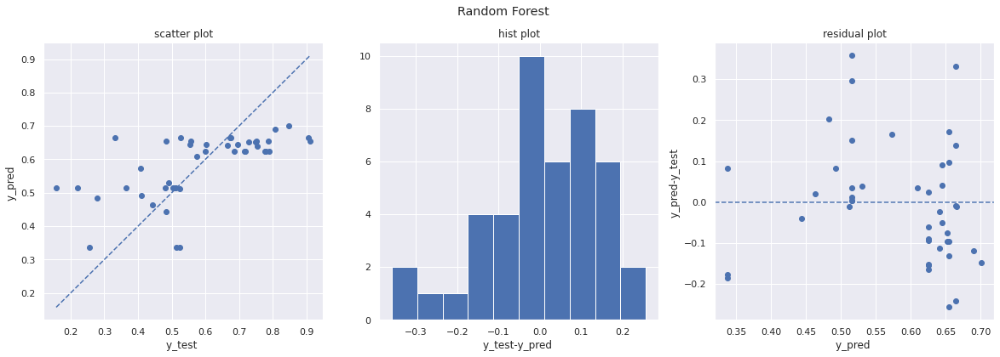


MAE:0.111 MAPE:0.261 MSE:0.0201 RMSE:0.142 R2:0.394 SKB:0.641


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

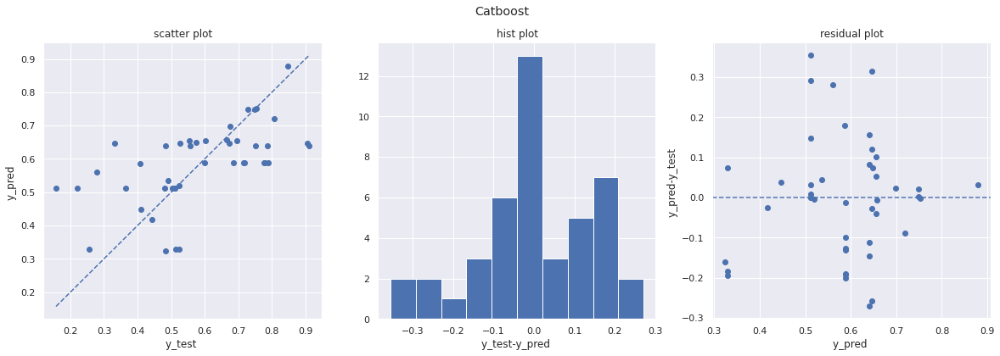

Streaming output truncated to the last 5000 lines.
12:	learn: 0.1522567	total: 8.2ms	remaining: 623ms
13:	learn: 0.1513195	total: 8.82ms	remaining: 622ms
14:	learn: 0.1504306	total: 9.43ms	remaining: 619ms
15:	learn: 0.1496925	total: 9.89ms	remaining: 608ms
16:	learn: 0.1488337	total: 10.5ms	remaining: 607ms
17:	learn: 0.1481451	total: 11.1ms	remaining: 605ms
18:	learn: 0.1474087	total: 11.6ms	remaining: 601ms
19:	learn: 0.1469348	total: 12.2ms	remaining: 598ms
20:	learn: 0.1462236	total: 12.8ms	remaining: 595ms
21:	learn: 0.1456459	total: 13.2ms	remaining: 588ms
22:	learn: 0.1449902	total: 13.8ms	remaining: 586ms
23:	learn: 0.1444483	total: 14.4ms	remaining: 586ms
24:	learn: 0.1439513	total: 15ms	remaining: 584ms
25:	learn: 0.1433893	total: 15.6ms	remaining: 583ms
26:	learn: 0.1428514	total: 16.1ms	remaining: 581ms
27:	learn: 0.1423527	total: 16.7ms	remaining: 578ms
28:	learn: 0.1419979	total: 17.3ms	remaining: 578ms
29:	learn: 0.1415835	total: 17.8ms	remaining: 577ms
30:	learn: 0.141

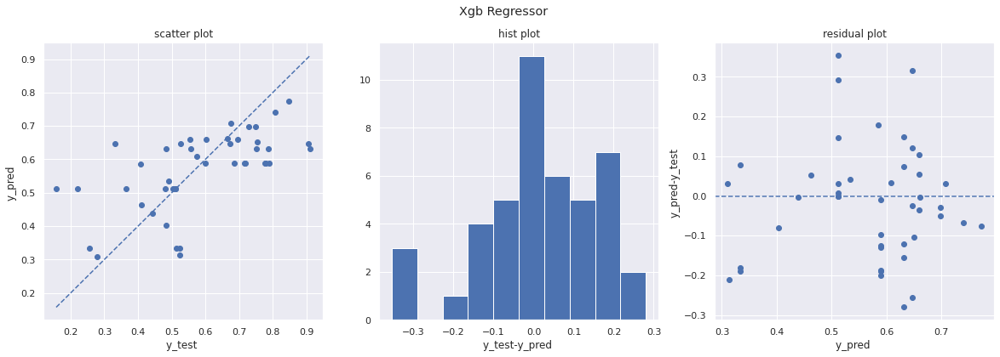


MAE:0.112 MAPE:0.253 MSE:0.0208 RMSE:0.144 R2:0.371 SKB:0.647


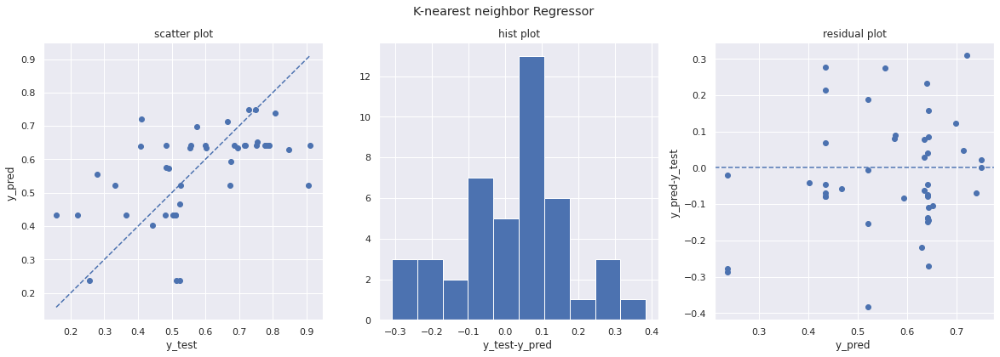


MAE:0.125 MAPE:0.271 MSE:0.0243 RMSE:0.156 R2:0.266 SKB:0.583


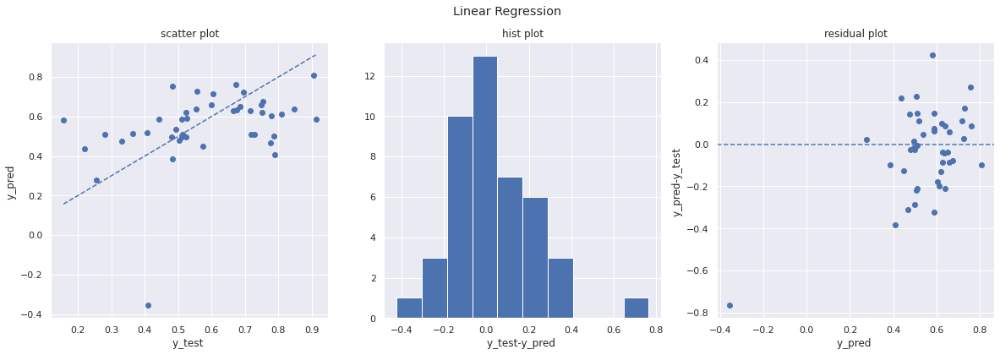


MAE:0.148 MAPE:0.324 MSE:0.0413 RMSE:0.203 R2:-0.245 SKB:0.408


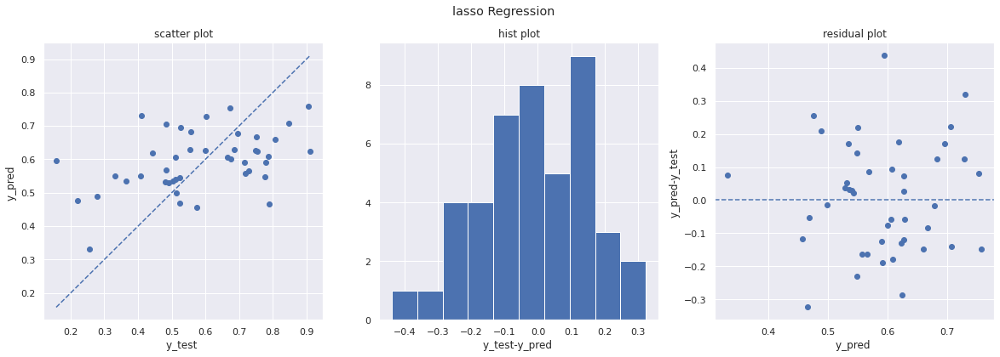


MAE:0.136 MAPE:0.309 MSE:0.027 RMSE:0.164 R2:0.184 SKB:0.403


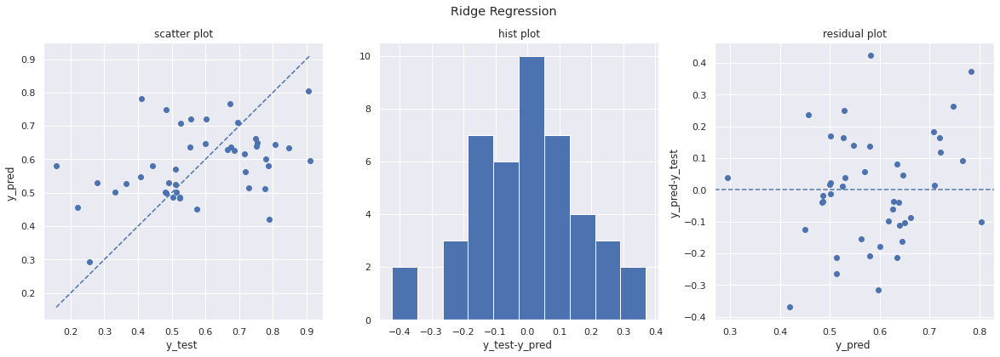


MAE:0.136 MAPE:0.302 MSE:0.0295 RMSE:0.172 R2:0.109 SKB:0.359

MAE:0.11 MAPE:0.212 MSE:0.0158 RMSE:0.126 R2:0.524 SKB:0.652


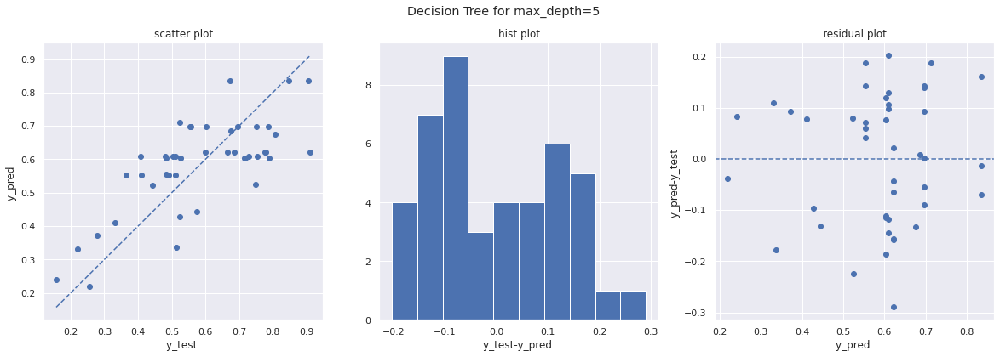


MAE:0.112 MAPE:0.236 MSE:0.0171 RMSE:0.131 R2:0.484 SKB:0.617


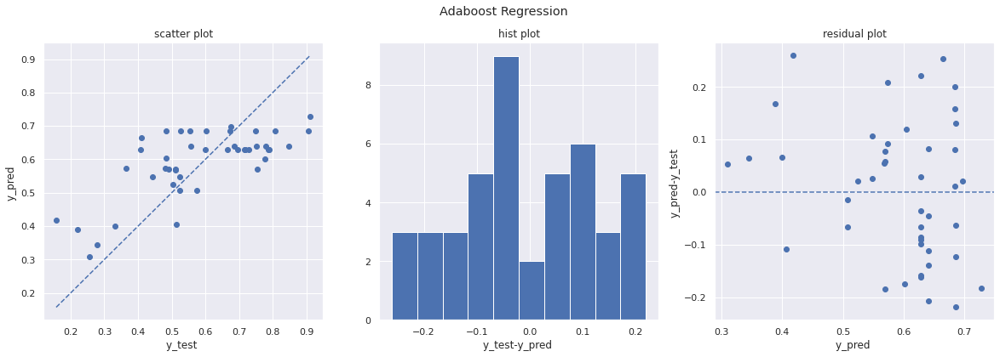

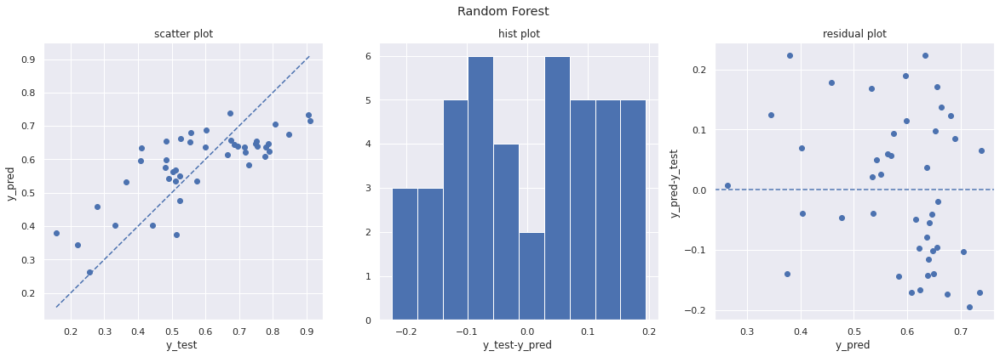


MAE:0.106 MAPE:0.219 MSE:0.0145 RMSE:0.121 R2:0.561 SKB:0.713


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

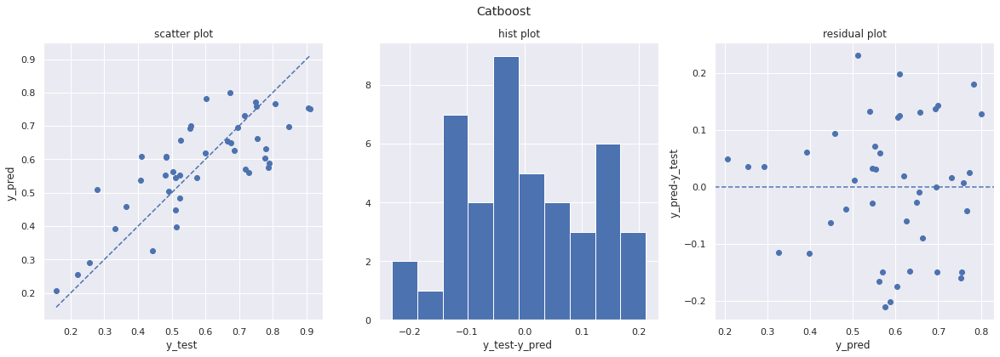

Streaming output truncated to the last 5000 lines.
12:	learn: 0.1505095	total: 18.5ms	remaining: 1.41s
13:	learn: 0.1490270	total: 20ms	remaining: 1.41s
14:	learn: 0.1477001	total: 21.5ms	remaining: 1.41s
15:	learn: 0.1465278	total: 23.1ms	remaining: 1.42s
16:	learn: 0.1451376	total: 24.5ms	remaining: 1.42s
17:	learn: 0.1437858	total: 25.9ms	remaining: 1.42s
18:	learn: 0.1425573	total: 27.4ms	remaining: 1.42s
19:	learn: 0.1415439	total: 28.8ms	remaining: 1.41s
20:	learn: 0.1405881	total: 30.2ms	remaining: 1.41s
21:	learn: 0.1393816	total: 31.6ms	remaining: 1.41s
22:	learn: 0.1384937	total: 33ms	remaining: 1.4s
23:	learn: 0.1373001	total: 34.5ms	remaining: 1.4s
24:	learn: 0.1361979	total: 35.9ms	remaining: 1.4s
25:	learn: 0.1352075	total: 37.3ms	remaining: 1.4s
26:	learn: 0.1342924	total: 38.7ms	remaining: 1.4s
27:	learn: 0.1332822	total: 40.1ms	remaining: 1.39s
28:	learn: 0.1324841	total: 41.5ms	remaining: 1.39s
29:	learn: 0.1315031	total: 42.8ms	remaining: 1.38s
30:	learn: 0.1305554	t

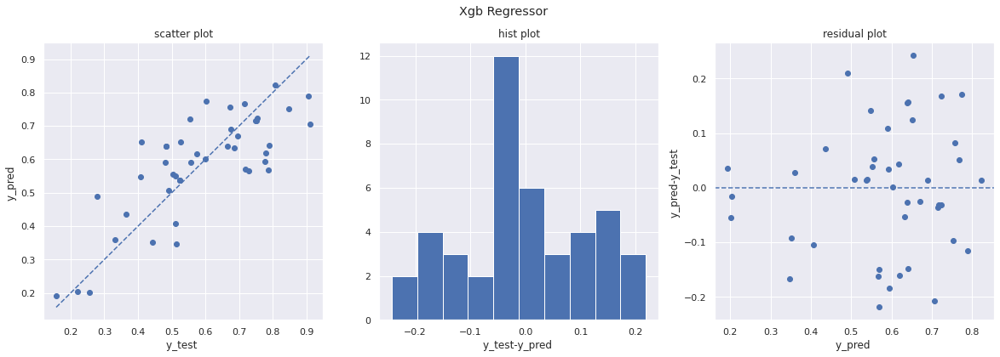


MAE:0.0925 MAPE:0.174 MSE:0.0132 RMSE:0.115 R2:0.601 SKB:0.704


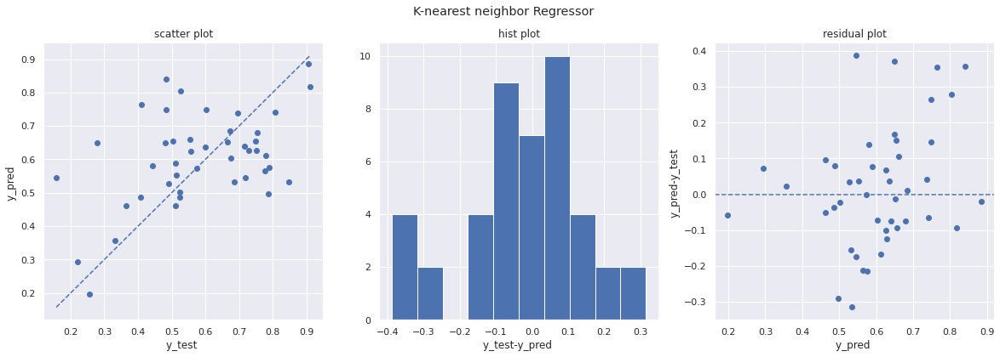


MAE:0.13 MAPE:0.288 MSE:0.0286 RMSE:0.169 R2:0.137 SKB:0.323


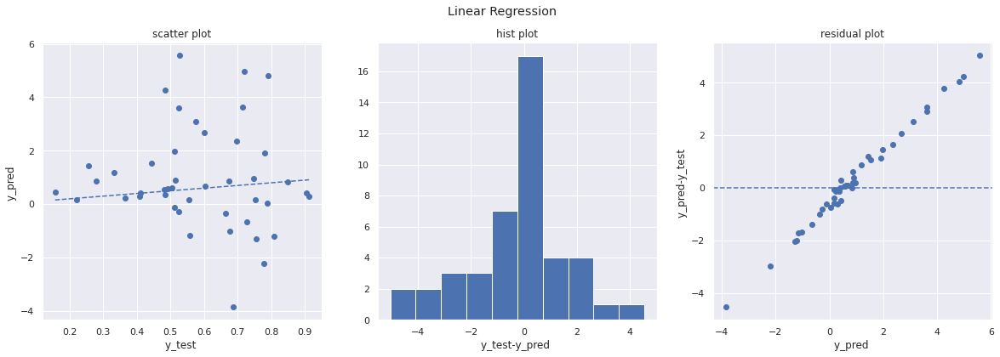


MAE:1.35 MAPE:2.29 MSE:3.69 RMSE:1.92 R2:-1.1e+02 SKB:-0.133


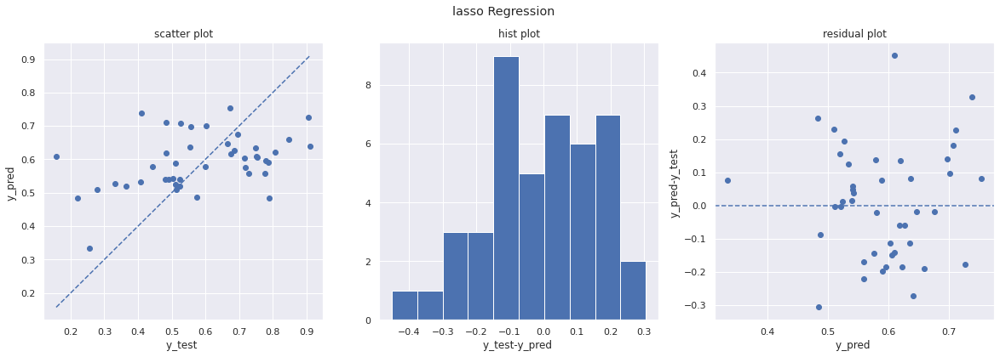


MAE:0.136 MAPE:0.308 MSE:0.0277 RMSE:0.166 R2:0.165 SKB:0.393


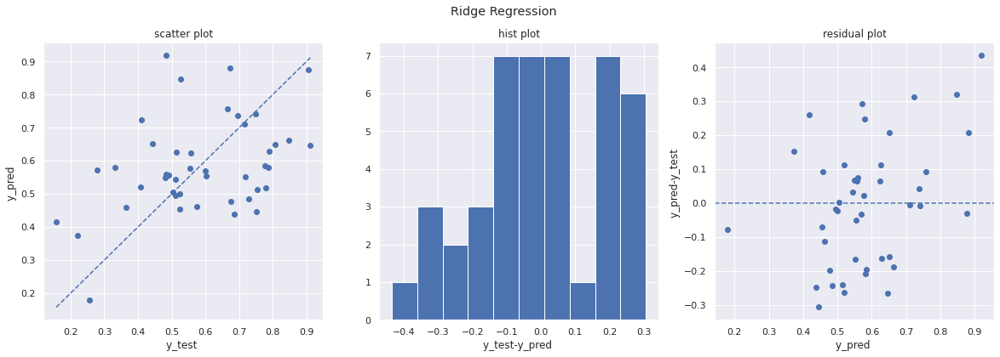


MAE:0.147 MAPE:0.304 MSE:0.033 RMSE:0.182 R2:0.00442 SKB:0.324

MAE:0.103 MAPE:0.213 MSE:0.0181 RMSE:0.134 R2:0.455 SKB:0.689


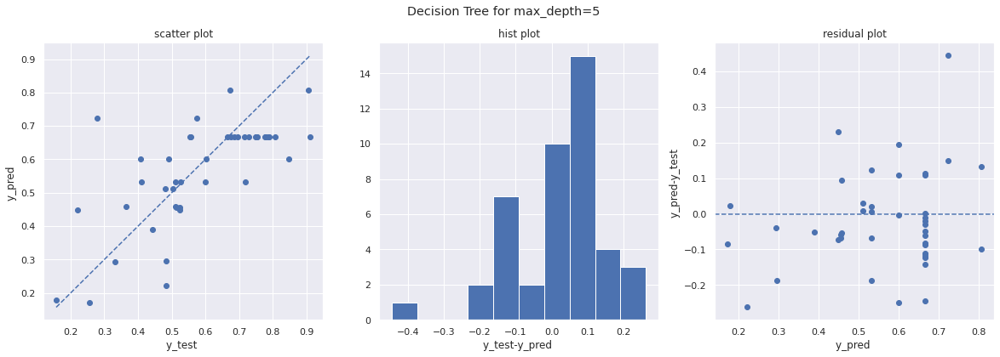


MAE:0.101 MAPE:0.216 MSE:0.0163 RMSE:0.128 R2:0.509 SKB:0.697


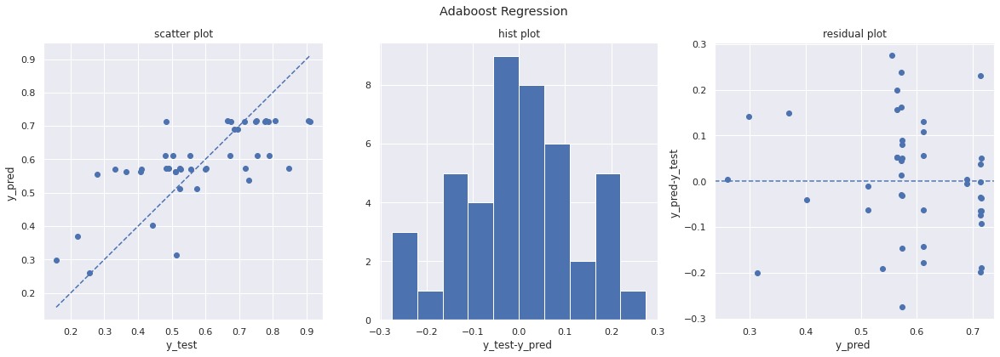

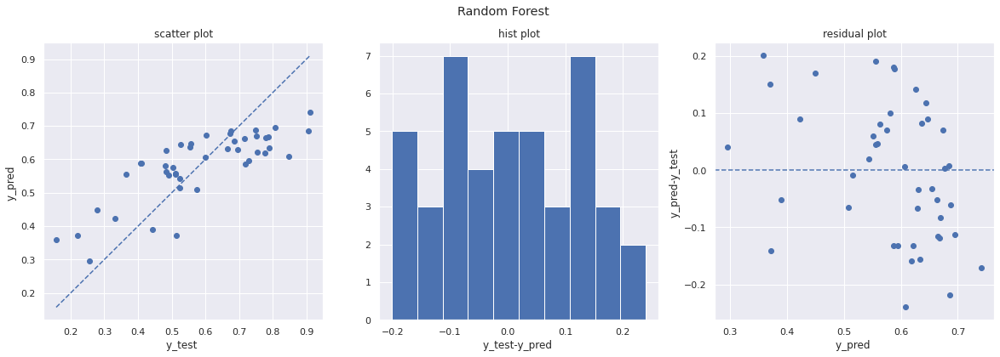


MAE:0.101 MAPE:0.211 MSE:0.0139 RMSE:0.118 R2:0.582 SKB:0.775


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

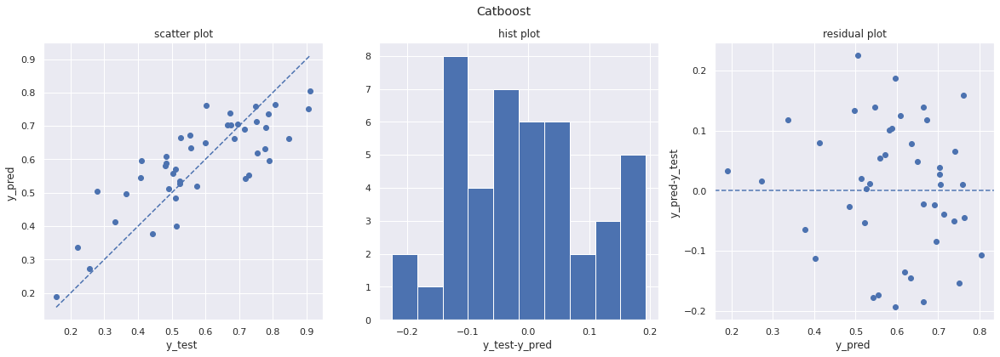

Streaming output truncated to the last 5000 lines.
12:	learn: 0.1496429	total: 70.1ms	remaining: 5.32s
13:	learn: 0.1483882	total: 77.8ms	remaining: 5.48s
14:	learn: 0.1470783	total: 83.2ms	remaining: 5.46s
15:	learn: 0.1456940	total: 88.6ms	remaining: 5.45s
16:	learn: 0.1444440	total: 94.8ms	remaining: 5.48s
17:	learn: 0.1433342	total: 100ms	remaining: 5.46s
18:	learn: 0.1420688	total: 106ms	remaining: 5.45s
19:	learn: 0.1409374	total: 111ms	remaining: 5.43s
20:	learn: 0.1396022	total: 116ms	remaining: 5.42s
21:	learn: 0.1384158	total: 122ms	remaining: 5.41s
22:	learn: 0.1375357	total: 128ms	remaining: 5.42s
23:	learn: 0.1362826	total: 134ms	remaining: 5.44s
24:	learn: 0.1352729	total: 139ms	remaining: 5.42s
25:	learn: 0.1342374	total: 144ms	remaining: 5.4s
26:	learn: 0.1331860	total: 150ms	remaining: 5.39s
27:	learn: 0.1321561	total: 156ms	remaining: 5.4s
28:	learn: 0.1310396	total: 161ms	remaining: 5.39s
29:	learn: 0.1299807	total: 167ms	remaining: 5.39s
30:	learn: 0.1291504	total: 

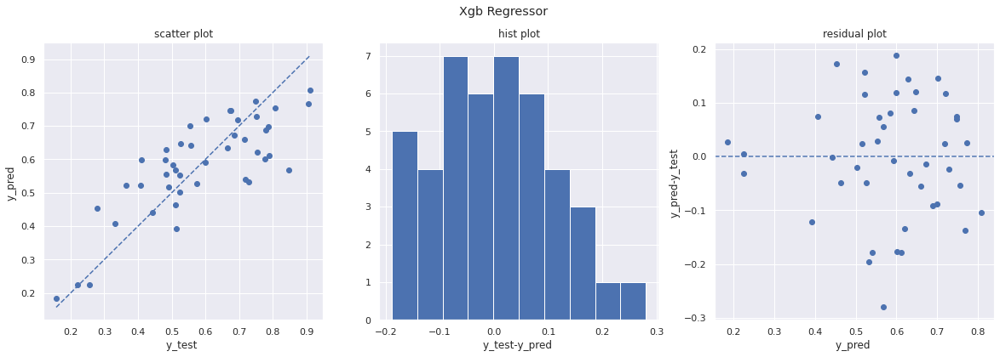


MAE:0.0897 MAPE:0.164 MSE:0.0121 RMSE:0.11 R2:0.634 SKB:0.731


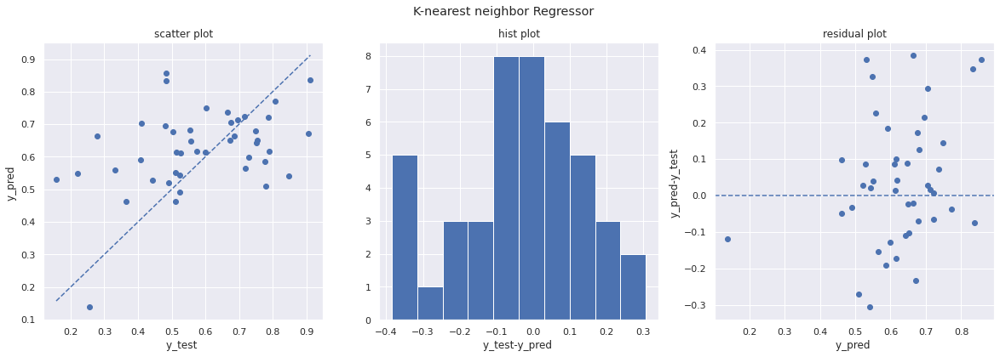


MAE:0.138 MAPE:0.327 MSE:0.0314 RMSE:0.177 R2:0.0536 SKB:0.324


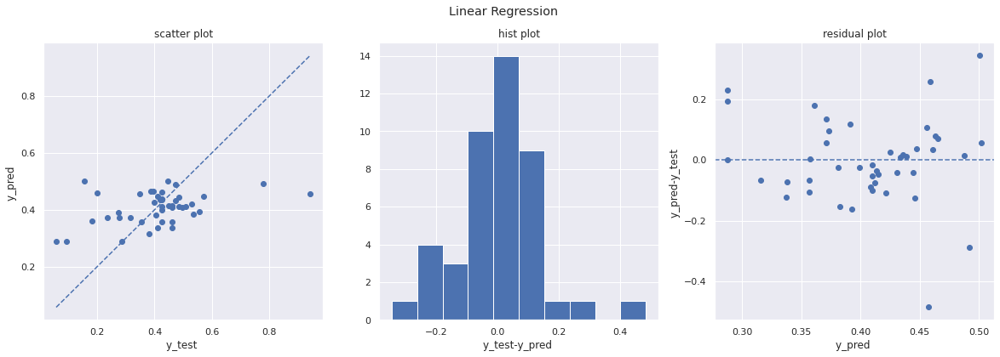


MAE:0.0995 MAPE:0.393 MSE:0.0194 RMSE:0.139 R2:0.175 SKB:0.305


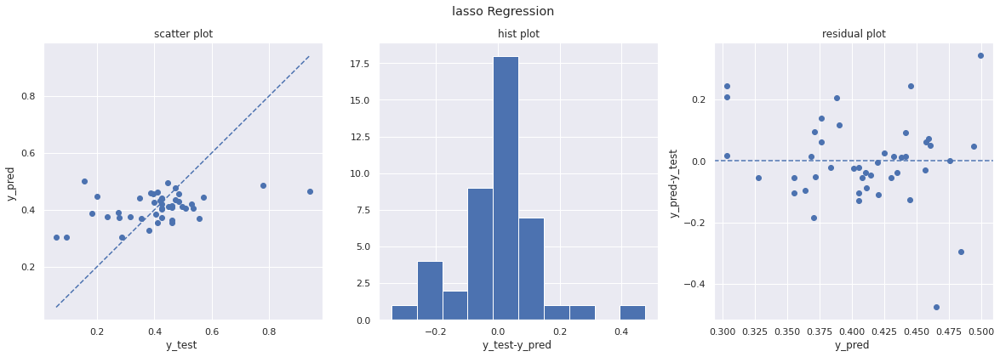


MAE:0.0978 MAPE:0.4 MSE:0.0193 RMSE:0.139 R2:0.177 SKB:0.322


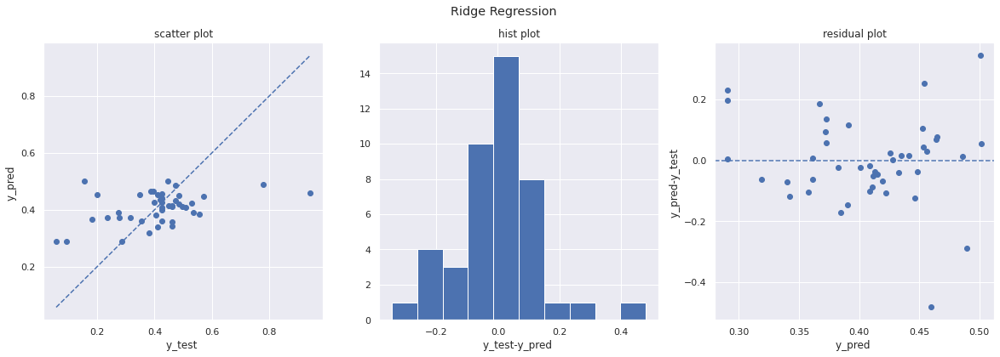


MAE:0.0988 MAPE:0.394 MSE:0.0193 RMSE:0.139 R2:0.179 SKB:0.314

MAE:0.0941 MAPE:0.355 MSE:0.0175 RMSE:0.132 R2:0.254 SKB:0.363


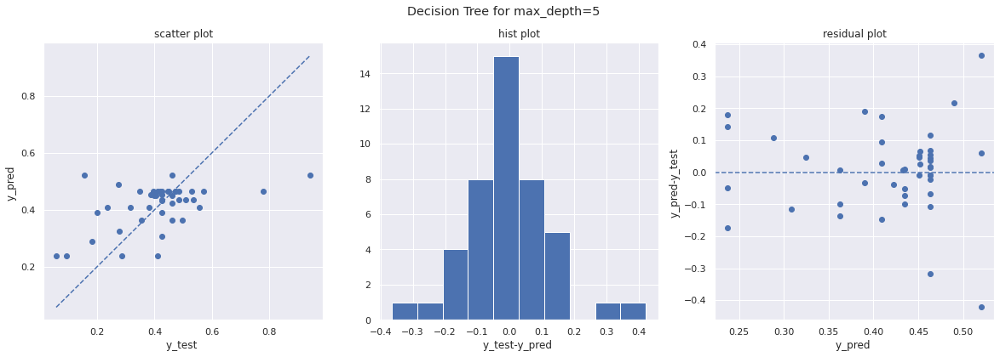


MAE:0.0826 MAPE:0.325 MSE:0.0158 RMSE:0.126 R2:0.325 SKB:0.478


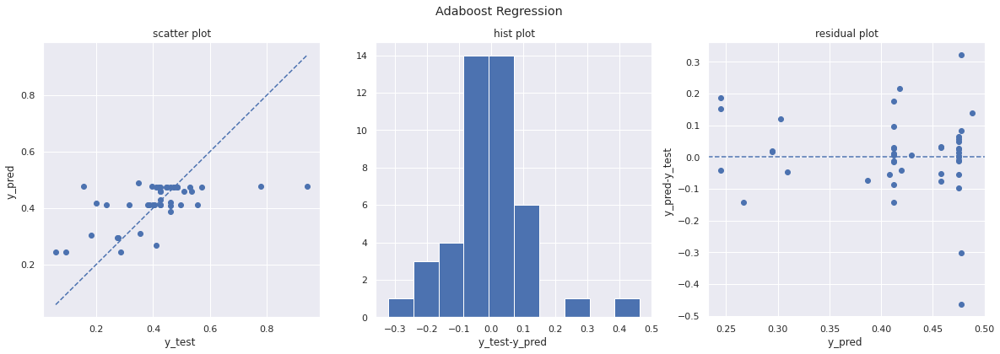

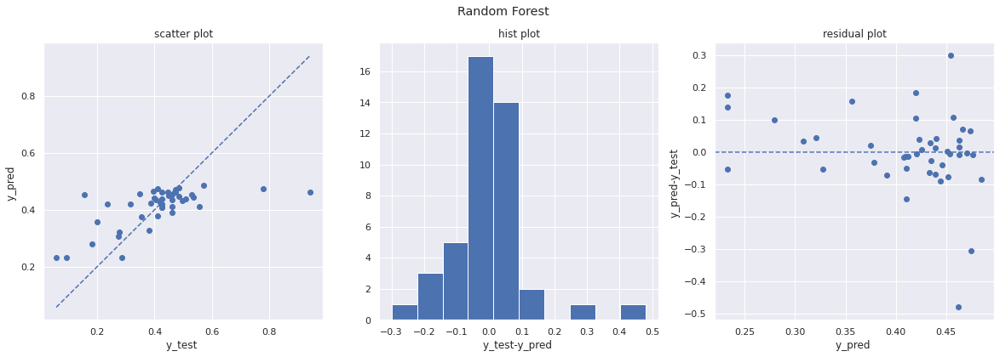


MAE:0.0773 MAPE:0.299 MSE:0.0146 RMSE:0.121 R2:0.379 SKB:0.586


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

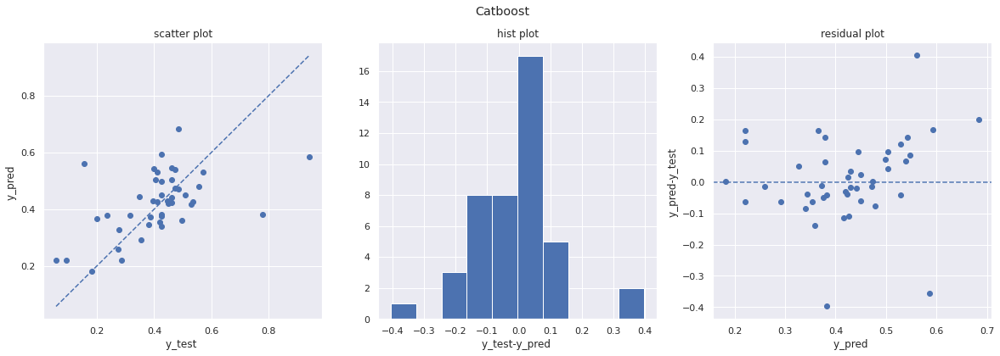

Streaming output truncated to the last 5000 lines.
12:	learn: 0.1198235	total: 7.88ms	remaining: 599ms
13:	learn: 0.1191910	total: 8.26ms	remaining: 582ms
14:	learn: 0.1186466	total: 8.65ms	remaining: 568ms
15:	learn: 0.1181022	total: 8.99ms	remaining: 553ms
16:	learn: 0.1174077	total: 9.35ms	remaining: 541ms
17:	learn: 0.1169155	total: 9.69ms	remaining: 528ms
18:	learn: 0.1163009	total: 10ms	remaining: 517ms
19:	learn: 0.1156185	total: 10.3ms	remaining: 507ms
20:	learn: 0.1150430	total: 10.6ms	remaining: 495ms
21:	learn: 0.1144299	total: 10.9ms	remaining: 485ms
22:	learn: 0.1139301	total: 11.2ms	remaining: 477ms
23:	learn: 0.1133152	total: 11.6ms	remaining: 471ms
24:	learn: 0.1128431	total: 11.9ms	remaining: 466ms
25:	learn: 0.1123736	total: 12.3ms	remaining: 461ms
26:	learn: 0.1119997	total: 12.6ms	remaining: 453ms
27:	learn: 0.1115335	total: 12.9ms	remaining: 447ms
28:	learn: 0.1111724	total: 13.2ms	remaining: 442ms
29:	learn: 0.1105895	total: 13.5ms	remaining: 437ms
30:	learn: 0.11

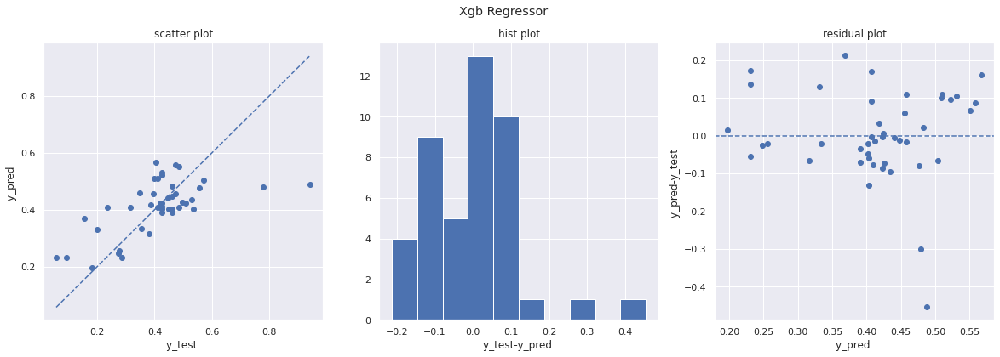


MAE:0.0847 MAPE:0.299 MSE:0.0141 RMSE:0.119 R2:0.399 SKB:0.57


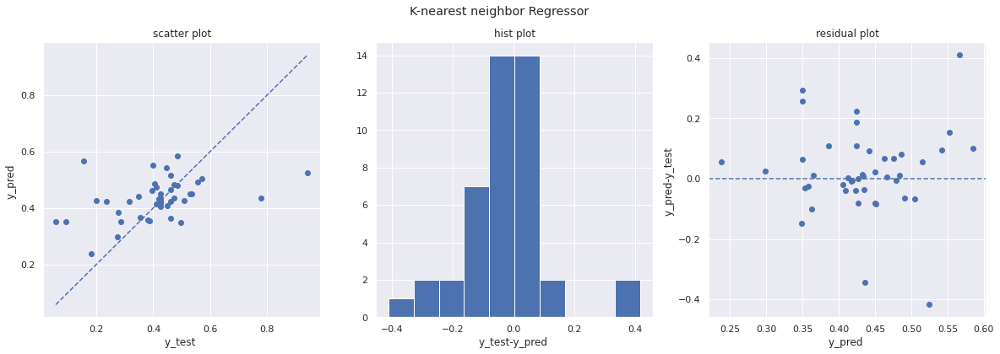


MAE:0.0936 MAPE:0.414 MSE:0.0197 RMSE:0.14 R2:0.16 SKB:0.462


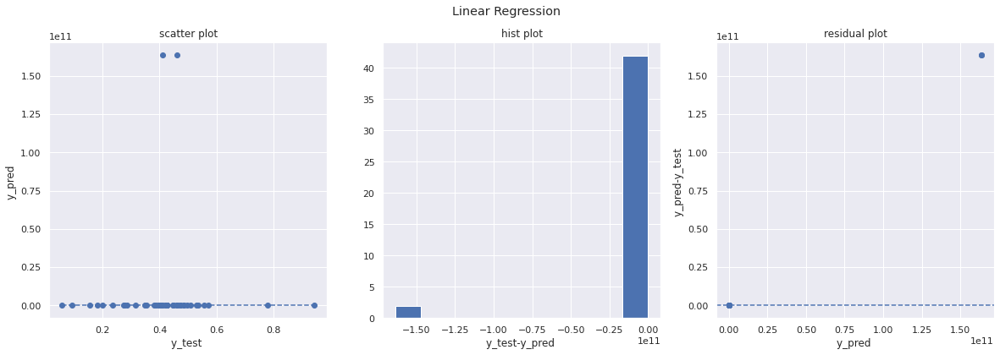


MAE:7.44e+09 MAPE:1.72e+10 MSE:1.22e+21 RMSE:3.49e+10 R2:-5.19e+22 SKB:0.334


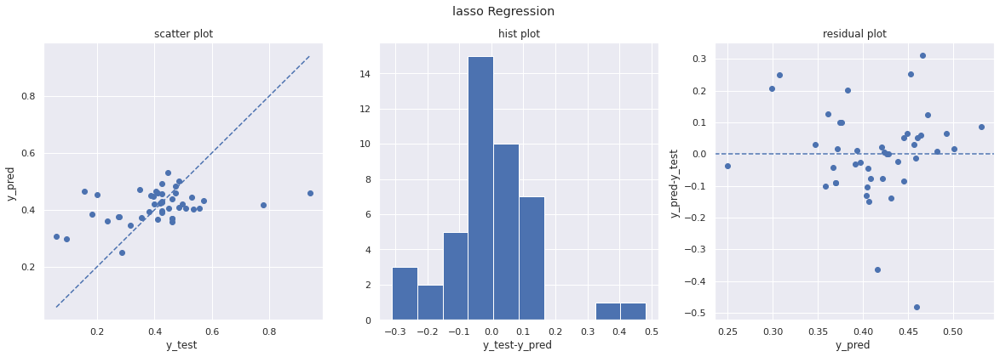


MAE:0.0978 MAPE:0.395 MSE:0.0198 RMSE:0.141 R2:0.155 SKB:0.308


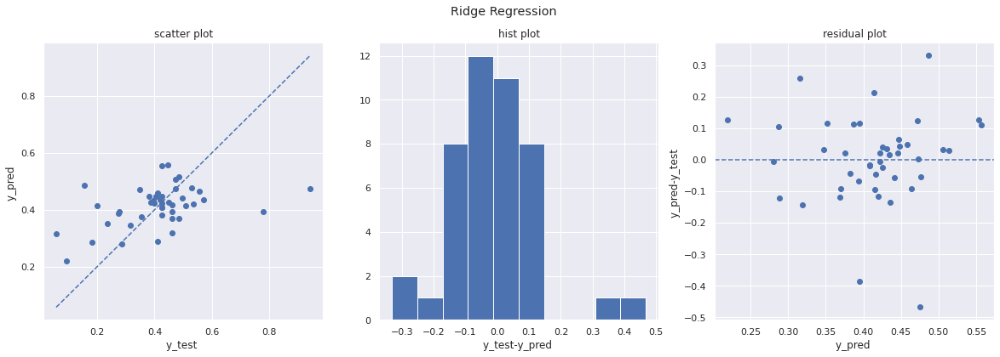


MAE:0.0965 MAPE:0.373 MSE:0.019 RMSE:0.138 R2:0.19 SKB:0.397

MAE:0.0809 MAPE:0.227 MSE:0.0151 RMSE:0.123 R2:0.358 SKB:0.632


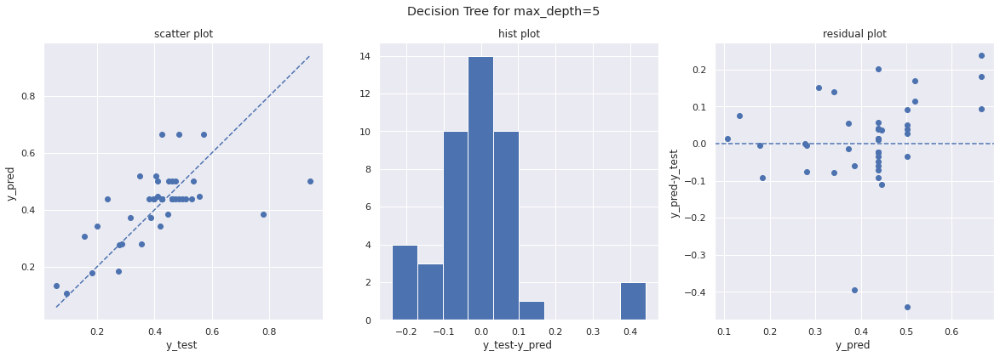


MAE:0.0835 MAPE:0.315 MSE:0.0155 RMSE:0.125 R2:0.339 SKB:0.559


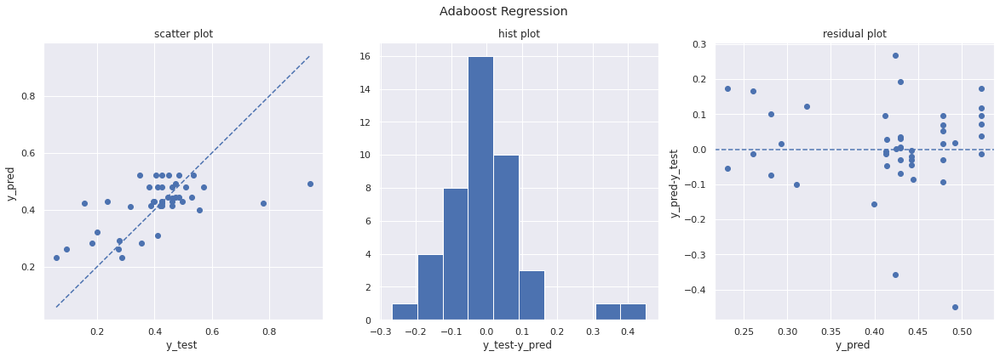

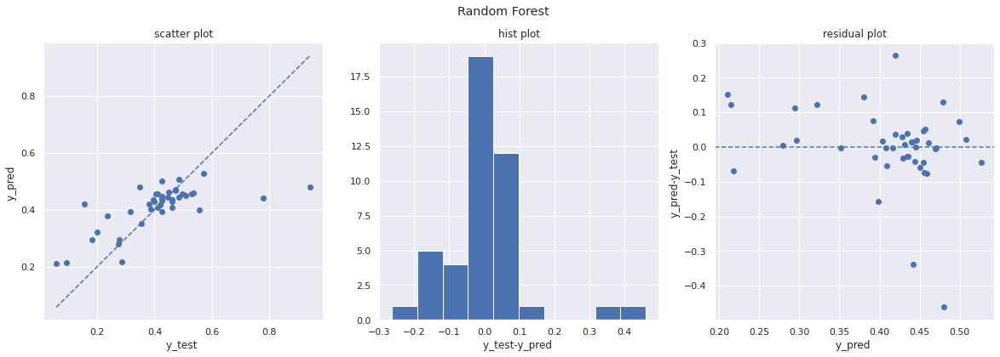


MAE:0.0699 MAPE:0.264 MSE:0.0132 RMSE:0.115 R2:0.44 SKB:0.704


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

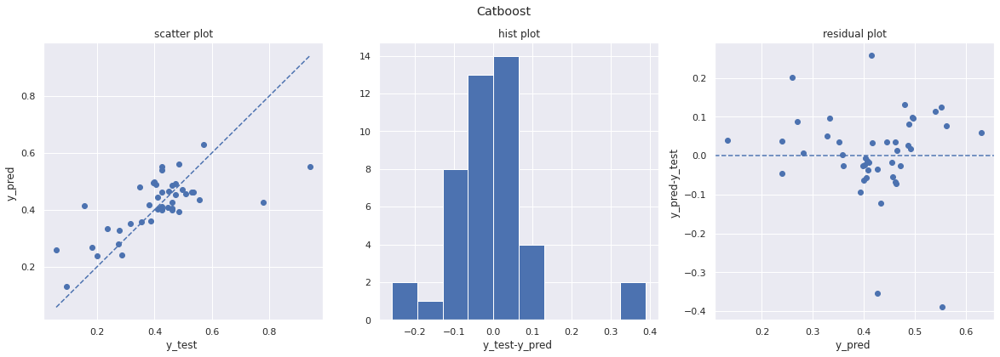

Streaming output truncated to the last 5000 lines.
12:	learn: 0.1191869	total: 39.7ms	remaining: 3.01s
13:	learn: 0.1185918	total: 43ms	remaining: 3.03s
14:	learn: 0.1178138	total: 44.7ms	remaining: 2.93s
15:	learn: 0.1170579	total: 46.2ms	remaining: 2.84s
16:	learn: 0.1161406	total: 47.3ms	remaining: 2.73s
17:	learn: 0.1153538	total: 48.7ms	remaining: 2.65s
18:	learn: 0.1147189	total: 50ms	remaining: 2.58s
19:	learn: 0.1139708	total: 51.5ms	remaining: 2.52s
20:	learn: 0.1132394	total: 53ms	remaining: 2.47s
21:	learn: 0.1125038	total: 54.4ms	remaining: 2.42s
22:	learn: 0.1117230	total: 55.8ms	remaining: 2.37s
23:	learn: 0.1111731	total: 57.2ms	remaining: 2.33s
24:	learn: 0.1104665	total: 58.7ms	remaining: 2.29s
25:	learn: 0.1099005	total: 60.1ms	remaining: 2.25s
26:	learn: 0.1093786	total: 61.6ms	remaining: 2.22s
27:	learn: 0.1086710	total: 63ms	remaining: 2.19s
28:	learn: 0.1078619	total: 64.4ms	remaining: 2.16s
29:	learn: 0.1073317	total: 65.8ms	remaining: 2.13s
30:	learn: 0.1068249	

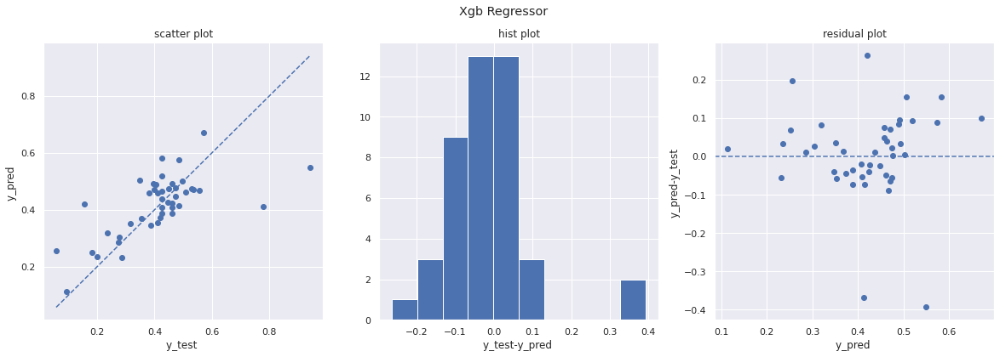


MAE:0.077 MAPE:0.268 MSE:0.0129 RMSE:0.114 R2:0.451 SKB:0.624


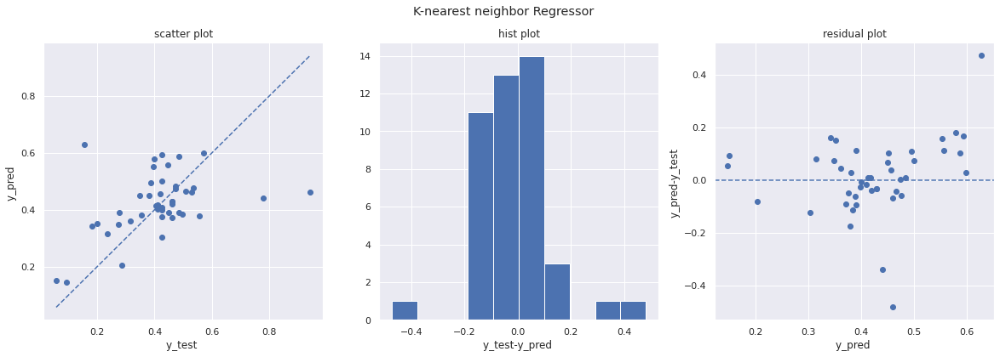


MAE:0.0994 MAPE:0.325 MSE:0.0206 RMSE:0.143 R2:0.125 SKB:0.418


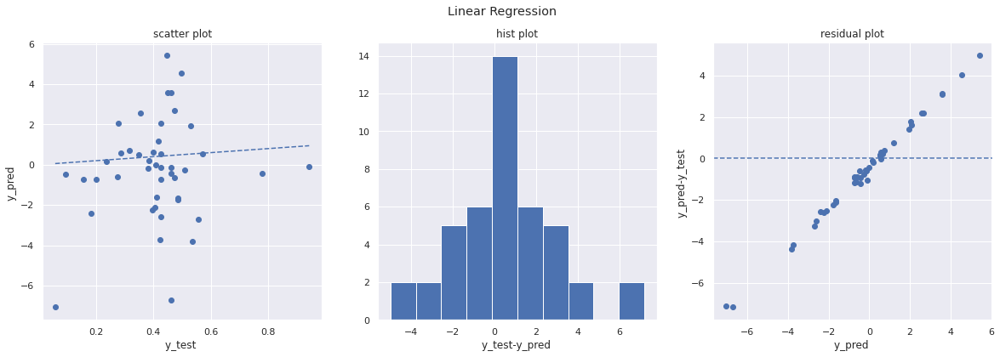


MAE:1.86 MAPE:7.05 MSE:6.41 RMSE:2.53 R2:-2.72e+02 SKB:0.0631


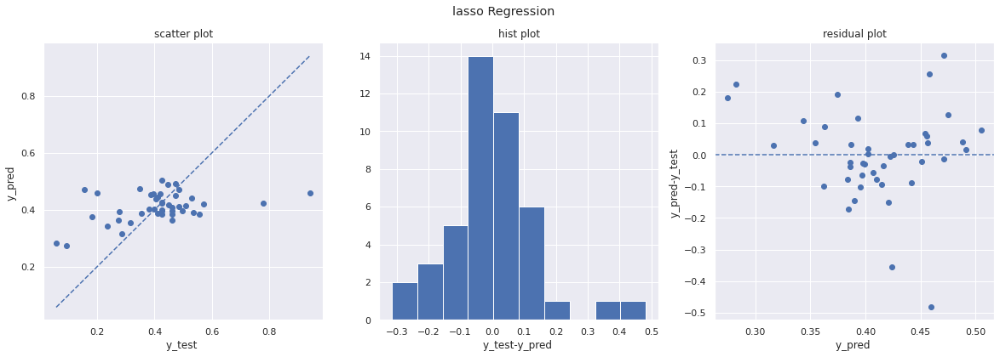


MAE:0.0968 MAPE:0.378 MSE:0.0194 RMSE:0.139 R2:0.174 SKB:0.281


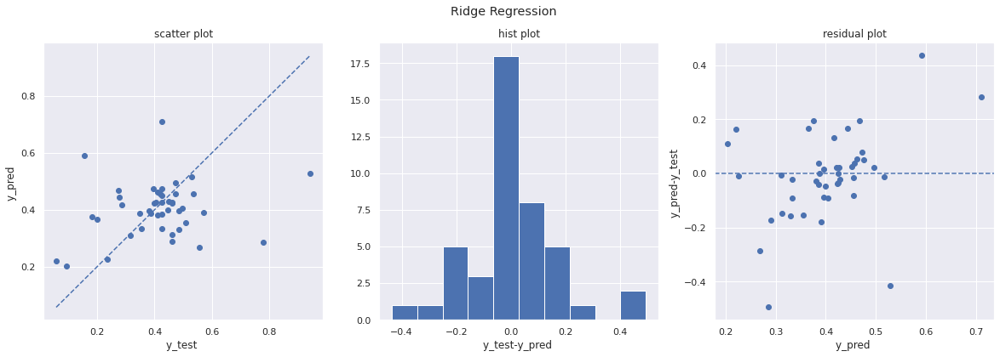


MAE:0.11 MAPE:0.378 MSE:0.026 RMSE:0.161 R2:-0.108 SKB:0.133

MAE:0.0766 MAPE:0.256 MSE:0.0136 RMSE:0.117 R2:0.42 SKB:0.634


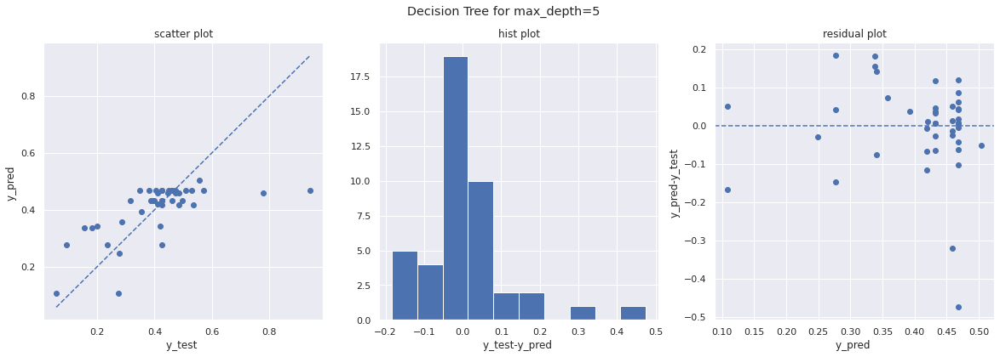


MAE:0.0745 MAPE:0.289 MSE:0.0139 RMSE:0.118 R2:0.41 SKB:0.616


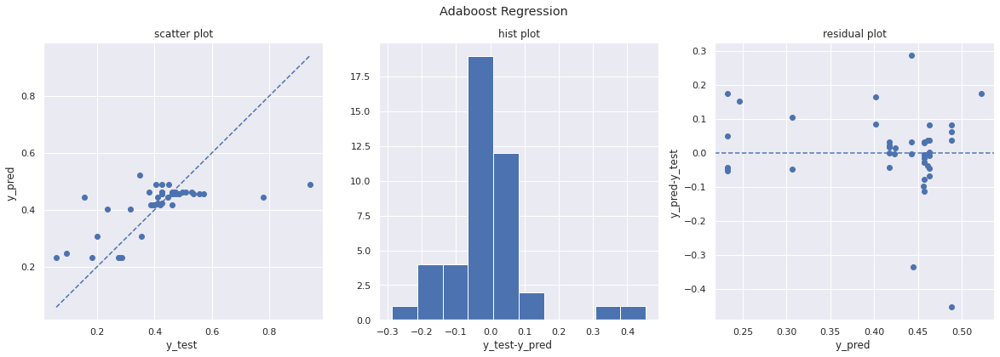

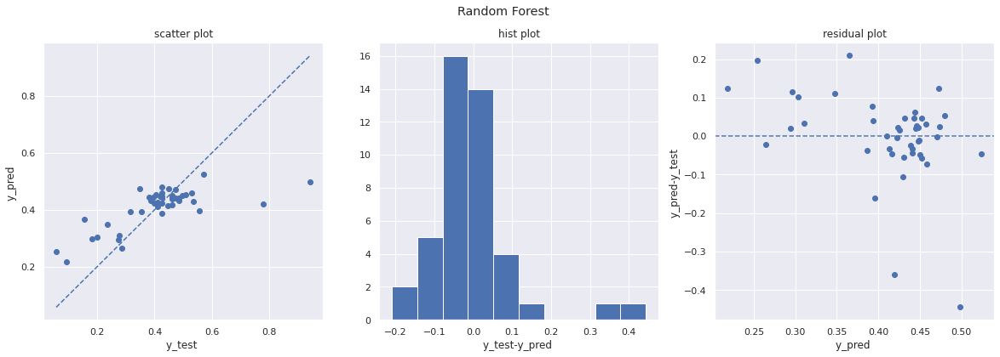


MAE:0.0725 MAPE:0.278 MSE:0.0128 RMSE:0.113 R2:0.454 SKB:0.609


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

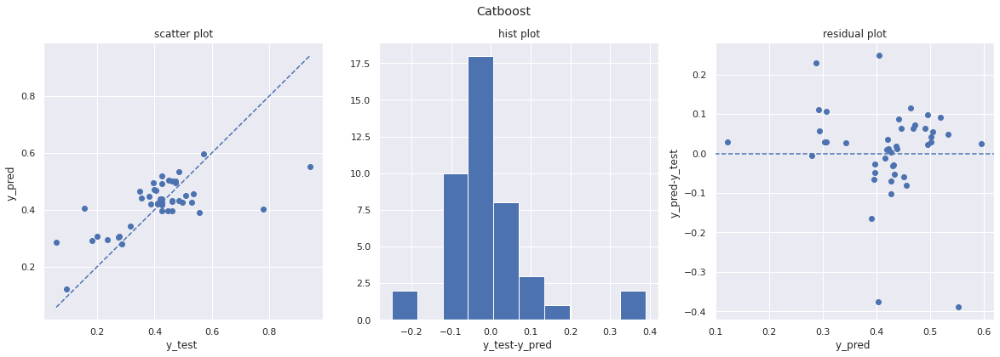

Streaming output truncated to the last 5000 lines.
12:	learn: 0.1184578	total: 70.4ms	remaining: 5.35s
13:	learn: 0.1175564	total: 76.7ms	remaining: 5.4s
14:	learn: 0.1168700	total: 82ms	remaining: 5.39s
15:	learn: 0.1160599	total: 87.6ms	remaining: 5.39s
16:	learn: 0.1153613	total: 97ms	remaining: 5.61s
17:	learn: 0.1145662	total: 102ms	remaining: 5.58s
18:	learn: 0.1137546	total: 108ms	remaining: 5.55s
19:	learn: 0.1131540	total: 113ms	remaining: 5.53s
20:	learn: 0.1125001	total: 119ms	remaining: 5.54s
21:	learn: 0.1117235	total: 124ms	remaining: 5.53s
22:	learn: 0.1110209	total: 130ms	remaining: 5.53s
23:	learn: 0.1101509	total: 136ms	remaining: 5.53s
24:	learn: 0.1094453	total: 141ms	remaining: 5.5s
25:	learn: 0.1086868	total: 146ms	remaining: 5.49s
26:	learn: 0.1081274	total: 152ms	remaining: 5.47s
27:	learn: 0.1075100	total: 157ms	remaining: 5.46s
28:	learn: 0.1069652	total: 163ms	remaining: 5.44s
29:	learn: 0.1063480	total: 168ms	remaining: 5.43s
30:	learn: 0.1057294	total: 174m

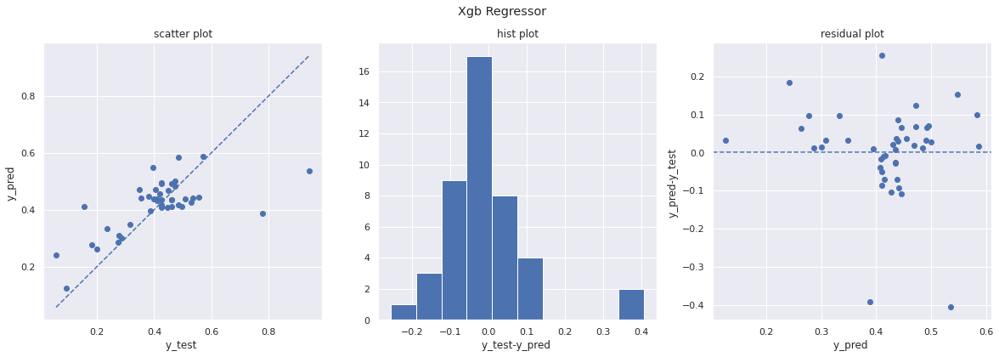


MAE:0.0752 MAPE:0.261 MSE:0.0132 RMSE:0.115 R2:0.44 SKB:0.532


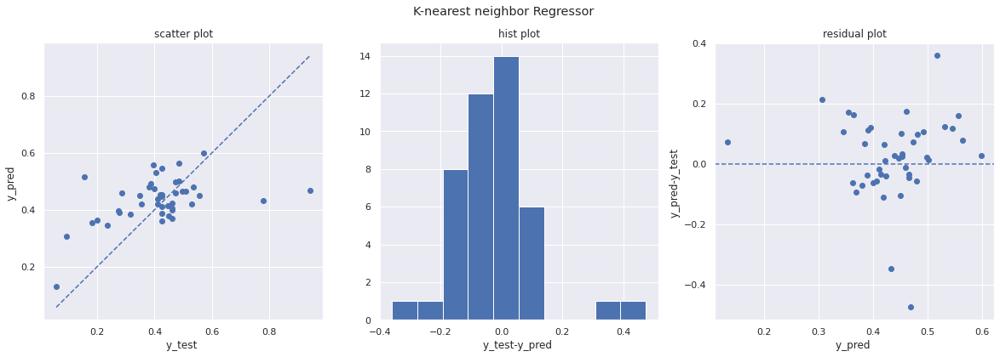


MAE:0.0987 MAPE:0.347 MSE:0.0187 RMSE:0.137 R2:0.202 SKB:0.385


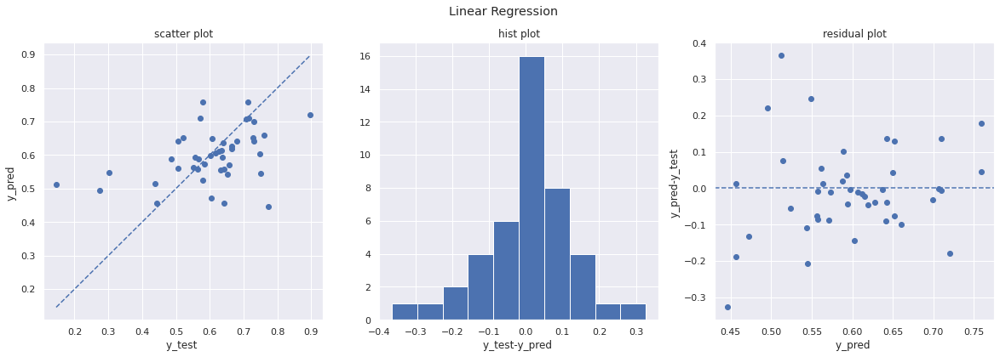


MAE:0.0897 MAPE:0.204 MSE:0.0154 RMSE:0.124 R2:0.156 SKB:0.395


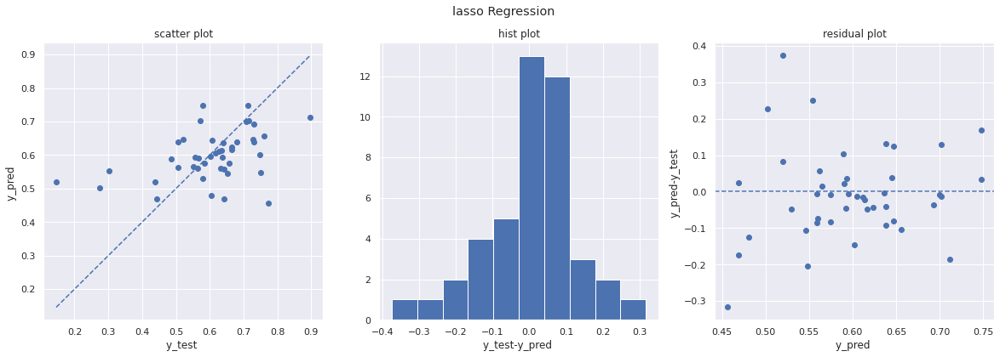


MAE:0.0898 MAPE:0.206 MSE:0.0153 RMSE:0.124 R2:0.164 SKB:0.392


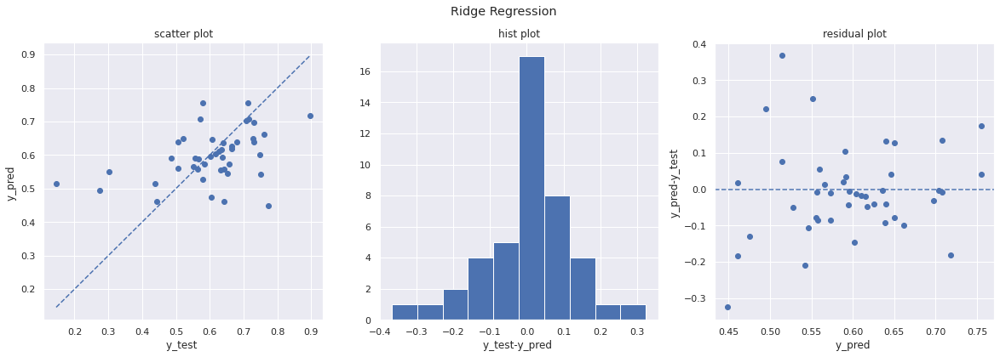


MAE:0.0898 MAPE:0.205 MSE:0.0154 RMSE:0.124 R2:0.159 SKB:0.394

MAE:0.112 MAPE:0.253 MSE:0.0212 RMSE:0.145 R2:-0.16 SKB:0.273


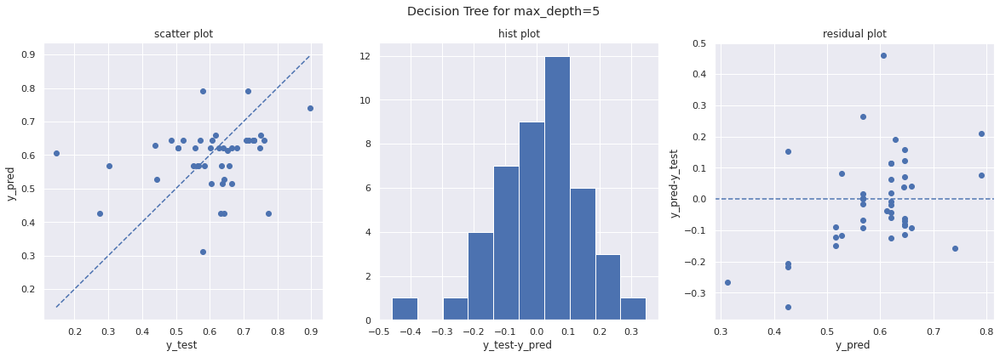


MAE:0.101 MAPE:0.228 MSE:0.0173 RMSE:0.132 R2:0.0514 SKB:0.352


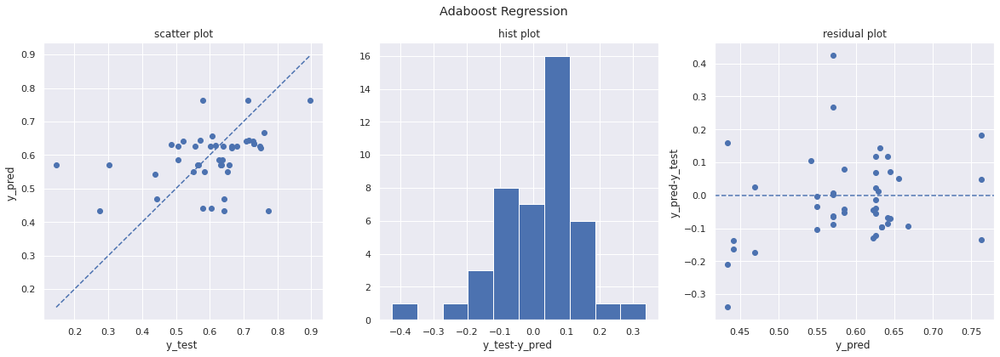

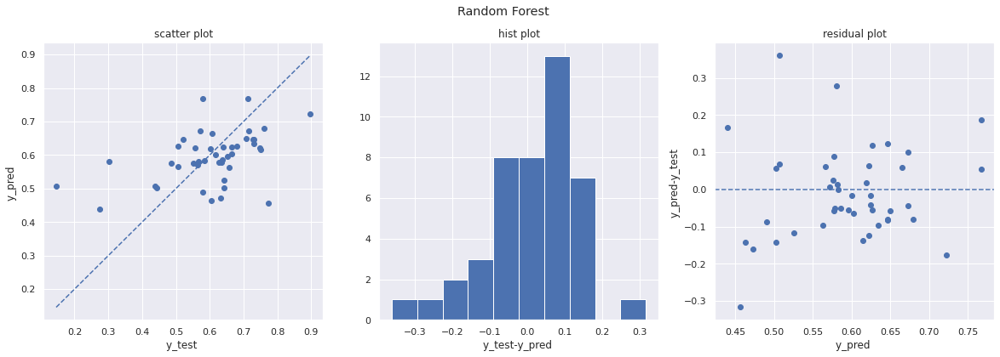


MAE:0.0955 MAPE:0.212 MSE:0.015 RMSE:0.122 R2:0.179 SKB:0.435


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

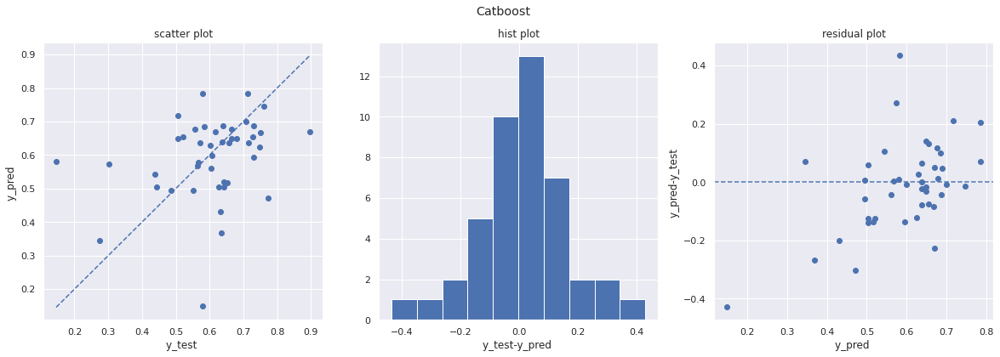

Streaming output truncated to the last 5000 lines.
12:	learn: 0.1380319	total: 4.29ms	remaining: 326ms
13:	learn: 0.1376410	total: 4.48ms	remaining: 315ms
14:	learn: 0.1370461	total: 4.74ms	remaining: 311ms
15:	learn: 0.1363379	total: 5.06ms	remaining: 311ms
16:	learn: 0.1355548	total: 5.38ms	remaining: 311ms
17:	learn: 0.1349522	total: 5.68ms	remaining: 310ms
18:	learn: 0.1342900	total: 6.03ms	remaining: 311ms
19:	learn: 0.1337836	total: 6.33ms	remaining: 310ms
20:	learn: 0.1331919	total: 6.61ms	remaining: 308ms
21:	learn: 0.1325654	total: 6.89ms	remaining: 306ms
22:	learn: 0.1320629	total: 7.2ms	remaining: 306ms
23:	learn: 0.1315111	total: 7.53ms	remaining: 306ms
24:	learn: 0.1310438	total: 7.9ms	remaining: 308ms
25:	learn: 0.1305197	total: 8.25ms	remaining: 309ms
26:	learn: 0.1299230	total: 8.63ms	remaining: 311ms
27:	learn: 0.1298361	total: 8.79ms	remaining: 305ms
28:	learn: 0.1293996	total: 9.19ms	remaining: 308ms
29:	learn: 0.1290499	total: 9.48ms	remaining: 307ms
30:	learn: 0.12

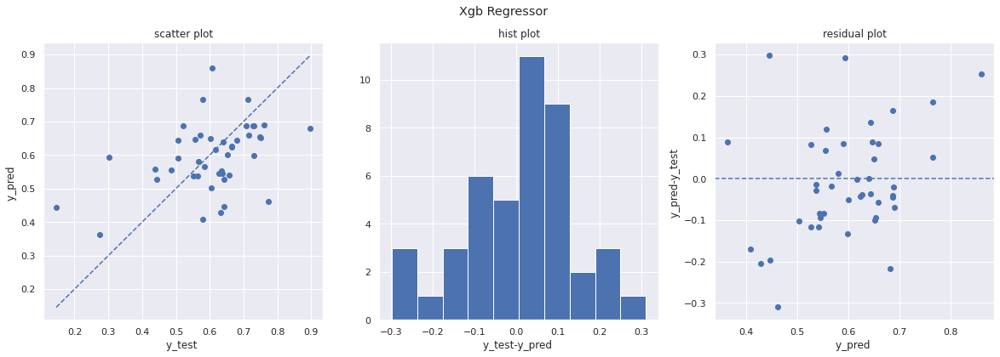


MAE:0.103 MAPE:0.217 MSE:0.017 RMSE:0.131 R2:0.0668 SKB:0.395


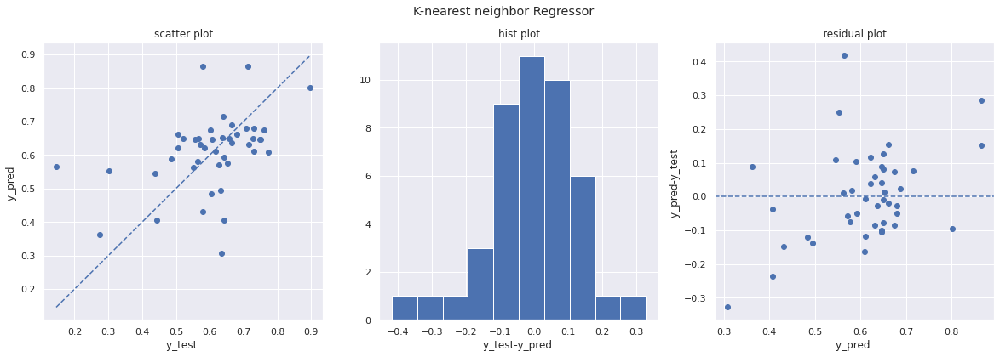


MAE:0.102 MAPE:0.229 MSE:0.0179 RMSE:0.134 R2:0.0185 SKB:0.457


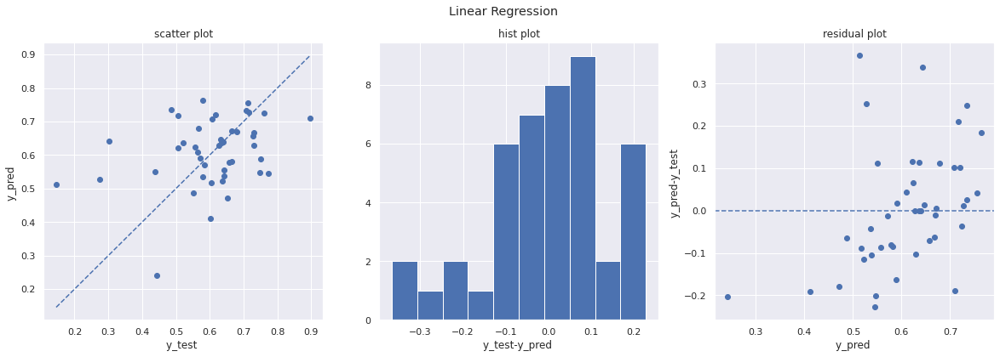


MAE:0.109 MAPE:0.248 MSE:0.02 RMSE:0.141 R2:-0.0943 SKB:0.251


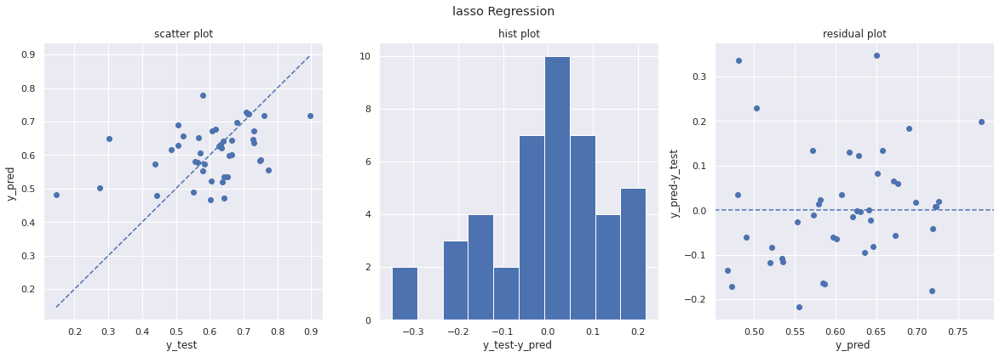


MAE:0.095 MAPE:0.218 MSE:0.0161 RMSE:0.127 R2:0.12 SKB:0.339


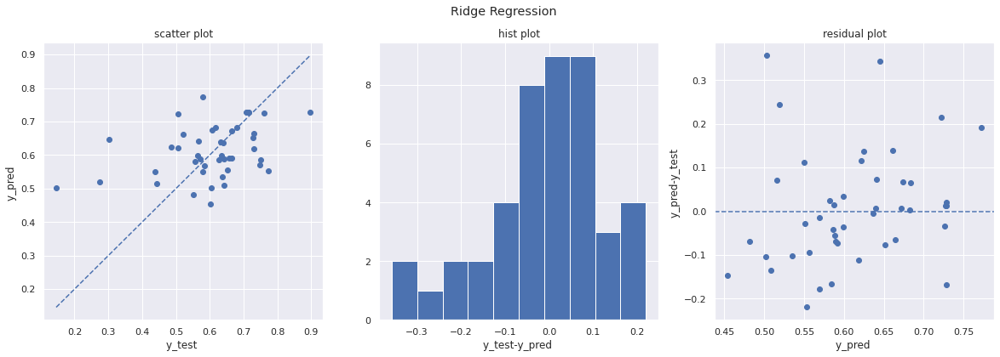


MAE:0.097 MAPE:0.225 MSE:0.0165 RMSE:0.129 R2:0.0935 SKB:0.335

MAE:0.107 MAPE:0.223 MSE:0.0187 RMSE:0.137 R2:-0.0221 SKB:0.33


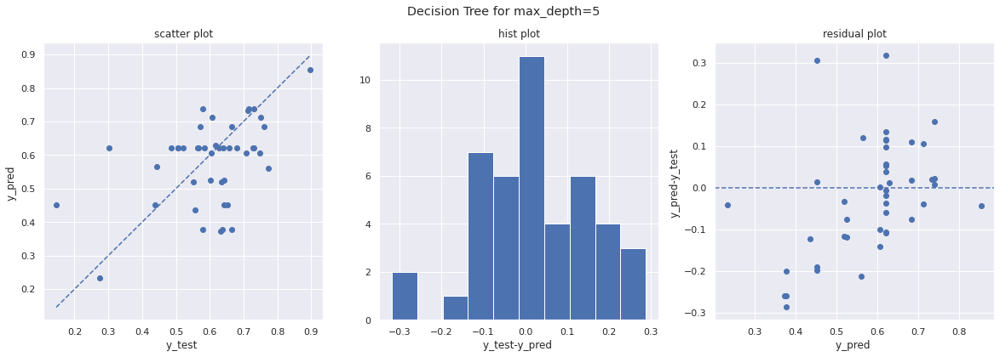


MAE:0.0946 MAPE:0.208 MSE:0.0142 RMSE:0.119 R2:0.224 SKB:0.297


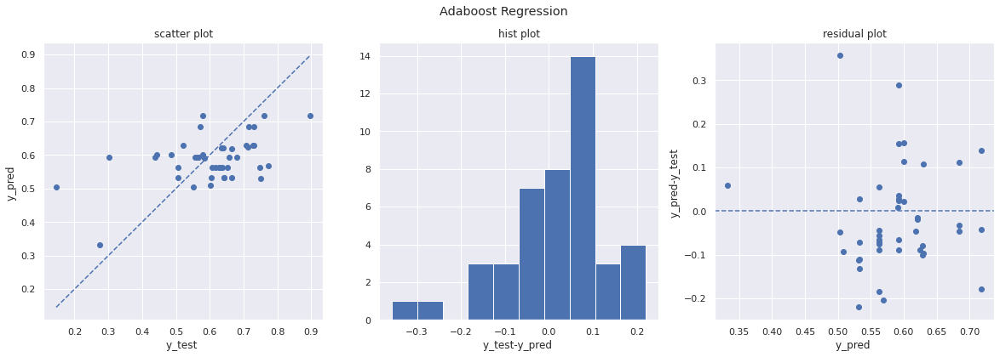

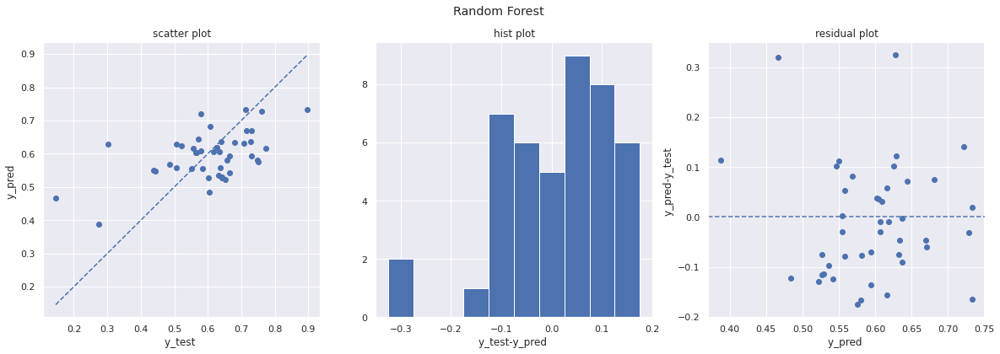


MAE:0.0919 MAPE:0.203 MSE:0.0131 RMSE:0.115 R2:0.281 SKB:0.359


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

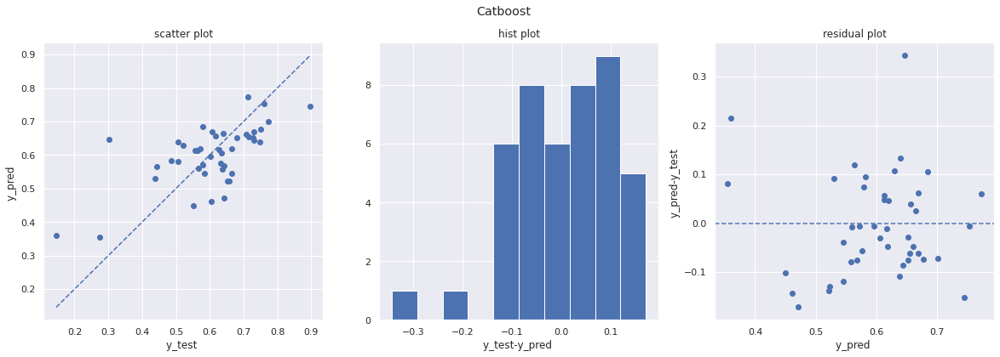

Streaming output truncated to the last 5000 lines.
12:	learn: 0.1341438	total: 51.1ms	remaining: 3.88s
13:	learn: 0.1332352	total: 53.1ms	remaining: 3.74s
14:	learn: 0.1320983	total: 54.6ms	remaining: 3.59s
15:	learn: 0.1310607	total: 56.3ms	remaining: 3.46s
16:	learn: 0.1299530	total: 57.7ms	remaining: 3.34s
17:	learn: 0.1289407	total: 59.3ms	remaining: 3.24s
18:	learn: 0.1281343	total: 60.8ms	remaining: 3.14s
19:	learn: 0.1269756	total: 62.2ms	remaining: 3.05s
20:	learn: 0.1261760	total: 63.6ms	remaining: 2.96s
21:	learn: 0.1251238	total: 65.2ms	remaining: 2.9s
22:	learn: 0.1243340	total: 66.6ms	remaining: 2.83s
23:	learn: 0.1235371	total: 68ms	remaining: 2.76s
24:	learn: 0.1225688	total: 69.4ms	remaining: 2.71s
25:	learn: 0.1216333	total: 70.8ms	remaining: 2.65s
26:	learn: 0.1208120	total: 72.3ms	remaining: 2.6s
27:	learn: 0.1199130	total: 73.7ms	remaining: 2.56s
28:	learn: 0.1191685	total: 75.1ms	remaining: 2.51s
29:	learn: 0.1183050	total: 76.5ms	remaining: 2.47s
30:	learn: 0.1175

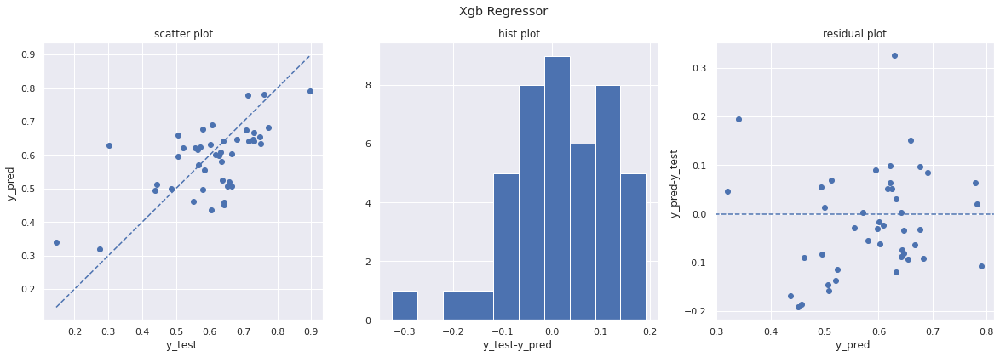


MAE:0.086 MAPE:0.176 MSE:0.0113 RMSE:0.106 R2:0.382 SKB:0.547


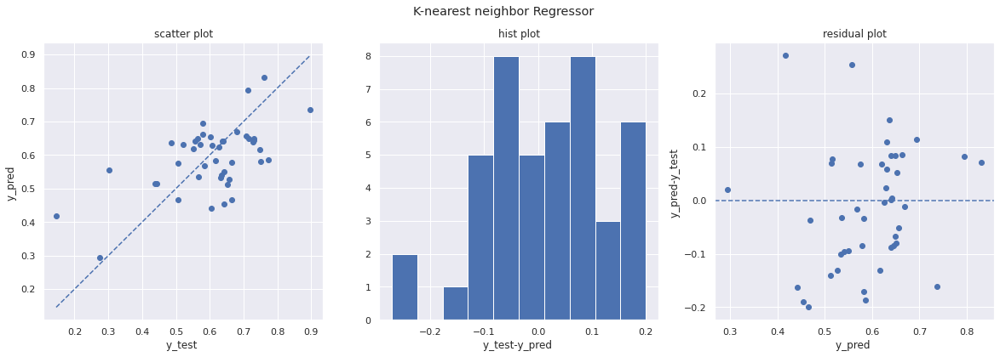


MAE:0.0931 MAPE:0.191 MSE:0.0127 RMSE:0.113 R2:0.303 SKB:0.402


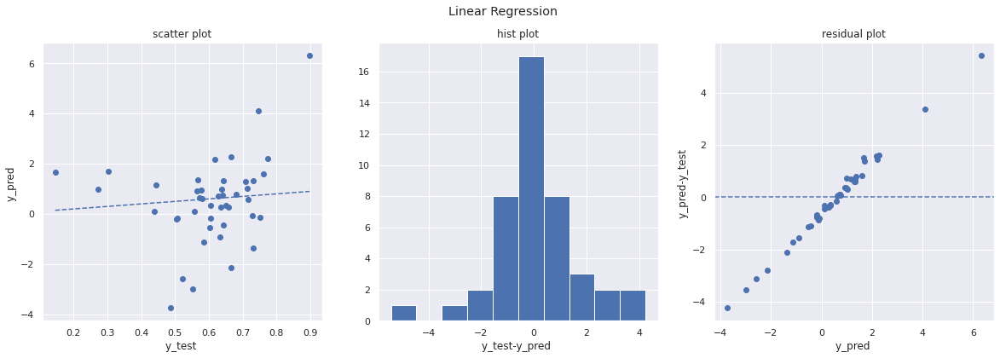


MAE:1.14 MAPE:2.09 MSE:2.73 RMSE:1.65 R2:-1.48e+02 SKB:0.237


/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.919e-01, tolerance: 1.794e-01
  model = cd_fast.enet_coordinate_descent(


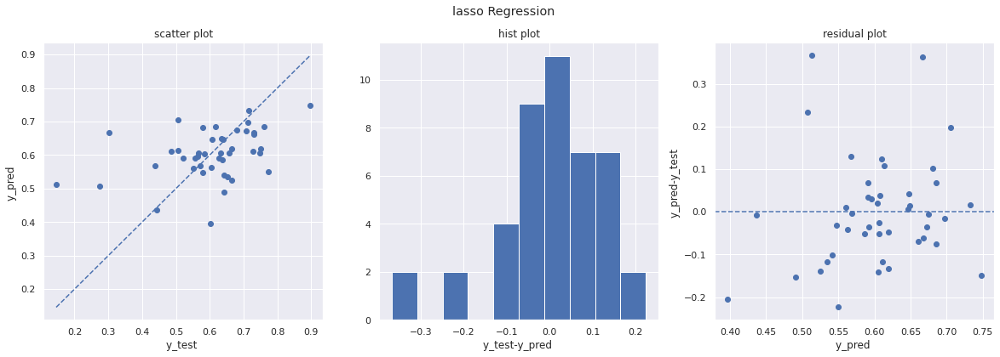


MAE:0.0912 MAPE:0.215 MSE:0.0157 RMSE:0.125 R2:0.139 SKB:0.38


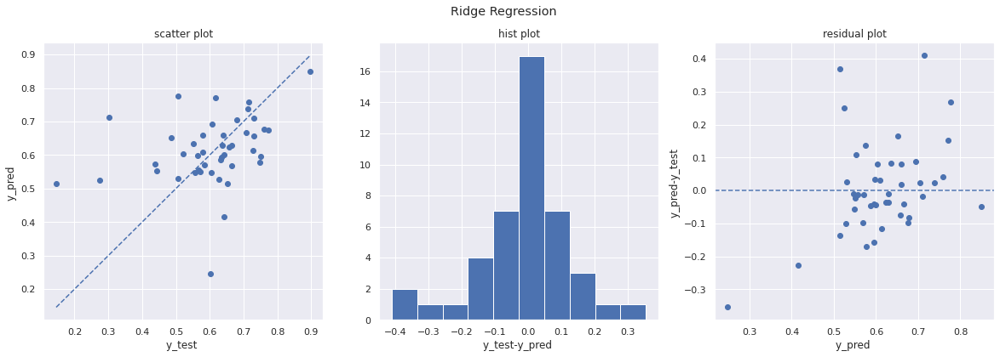


MAE:0.101 MAPE:0.237 MSE:0.0199 RMSE:0.141 R2:-0.0907 SKB:0.377

MAE:0.106 MAPE:0.228 MSE:0.02 RMSE:0.141 R2:-0.0965 SKB:0.396


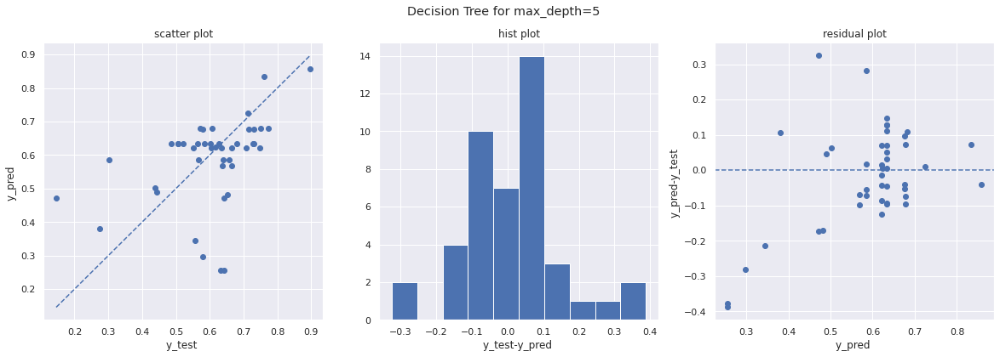


MAE:0.0935 MAPE:0.201 MSE:0.0141 RMSE:0.119 R2:0.23 SKB:0.323


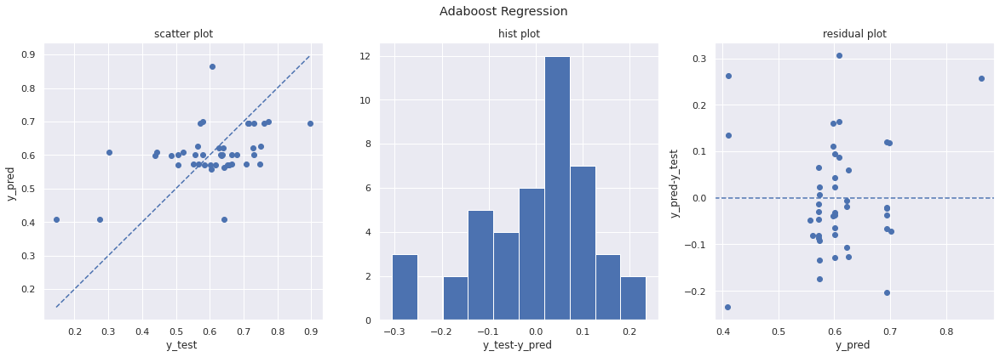

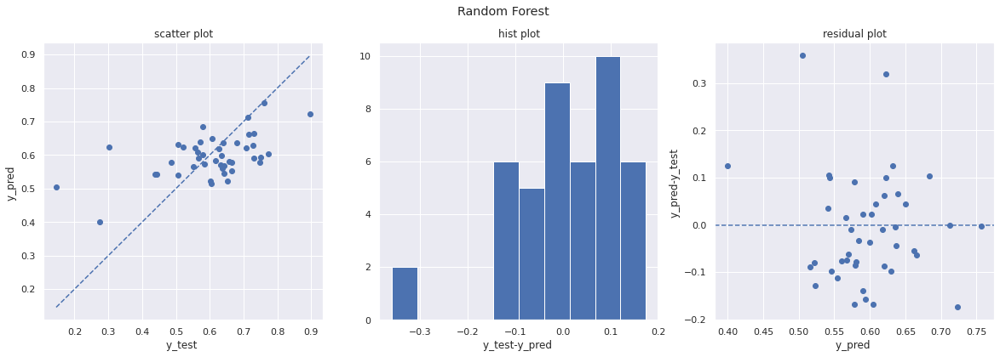


MAE:0.0883 MAPE:0.201 MSE:0.013 RMSE:0.114 R2:0.29 SKB:0.394


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

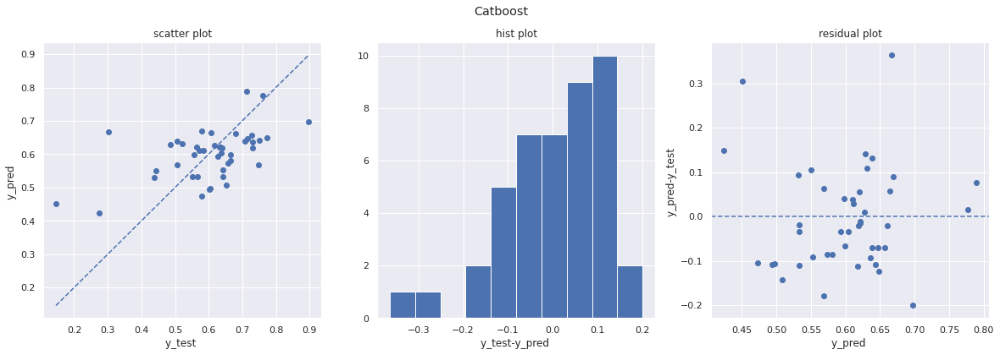

Streaming output truncated to the last 5000 lines.
12:	learn: 0.1340485	total: 80.1ms	remaining: 6.08s
13:	learn: 0.1331368	total: 86.4ms	remaining: 6.08s
14:	learn: 0.1320147	total: 92.4ms	remaining: 6.07s
15:	learn: 0.1309663	total: 98ms	remaining: 6.03s
16:	learn: 0.1300368	total: 103ms	remaining: 5.98s
17:	learn: 0.1291268	total: 109ms	remaining: 5.94s
18:	learn: 0.1278967	total: 114ms	remaining: 5.9s
19:	learn: 0.1269055	total: 120ms	remaining: 5.87s
20:	learn: 0.1260630	total: 125ms	remaining: 5.84s
21:	learn: 0.1250847	total: 132ms	remaining: 5.87s
22:	learn: 0.1242191	total: 137ms	remaining: 5.84s
23:	learn: 0.1232158	total: 143ms	remaining: 5.82s
24:	learn: 0.1221773	total: 148ms	remaining: 5.79s
25:	learn: 0.1212135	total: 154ms	remaining: 5.76s
26:	learn: 0.1204376	total: 159ms	remaining: 5.72s
27:	learn: 0.1196017	total: 164ms	remaining: 5.7s
28:	learn: 0.1189190	total: 169ms	remaining: 5.67s
29:	learn: 0.1179890	total: 175ms	remaining: 5.64s
30:	learn: 0.1173996	total: 180

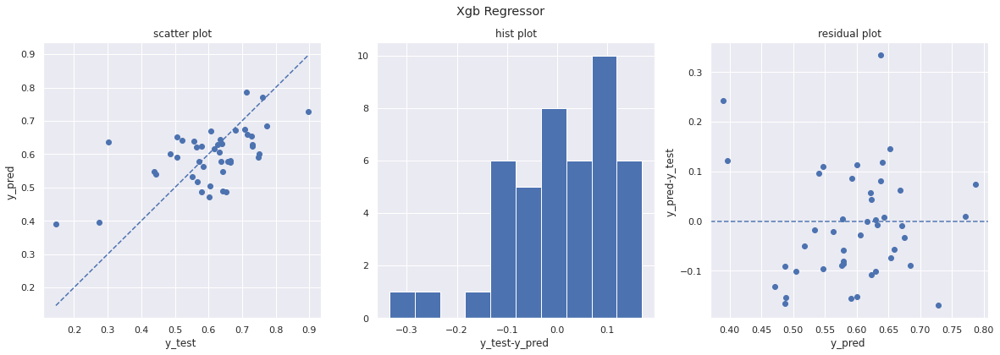


MAE:0.0872 MAPE:0.188 MSE:0.0119 RMSE:0.109 R2:0.346 SKB:0.455


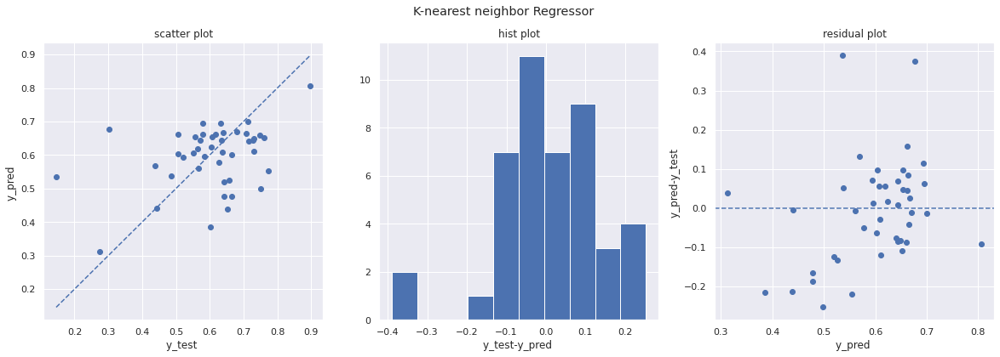


MAE:0.0995 MAPE:0.221 MSE:0.0175 RMSE:0.132 R2:0.0391 SKB:0.196


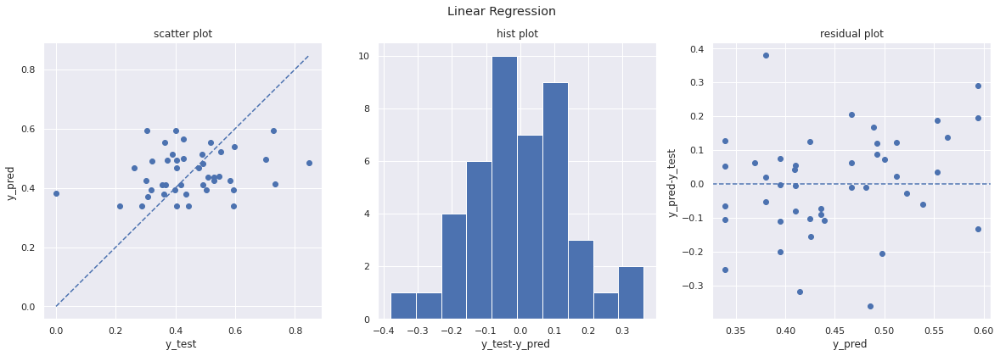

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))



MAE:0.118 MAPE:inf MSE:0.0224 RMSE:0.15 R2:-0.00496 SKB:0.232


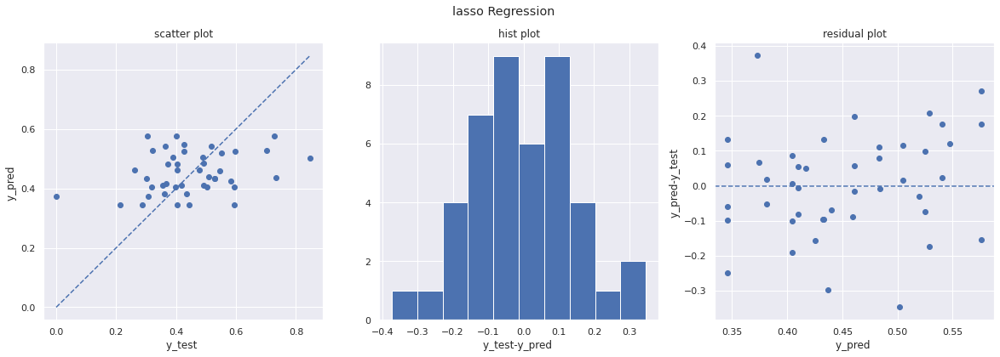

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))



MAE:0.115 MAPE:inf MSE:0.021 RMSE:0.145 R2:0.0575 SKB:0.234


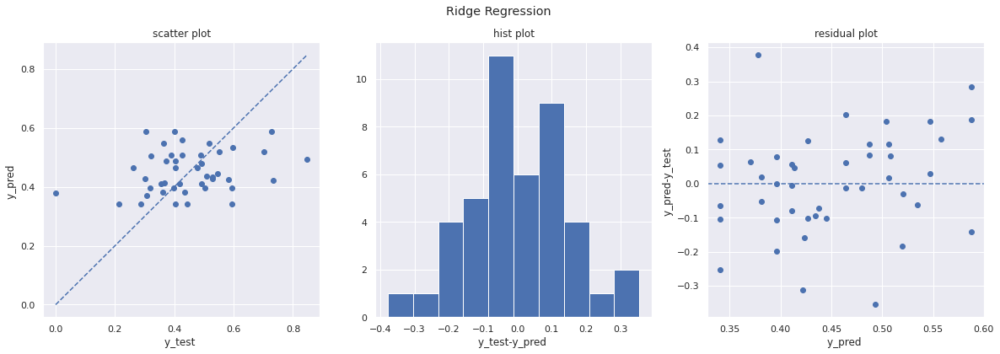

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))
<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))



MAE:0.116 MAPE:inf MSE:0.0218 RMSE:0.148 R2:0.0247 SKB:0.243

MAE:0.133 MAPE:inf MSE:0.0288 RMSE:0.17 R2:-0.29 SKB:0.106


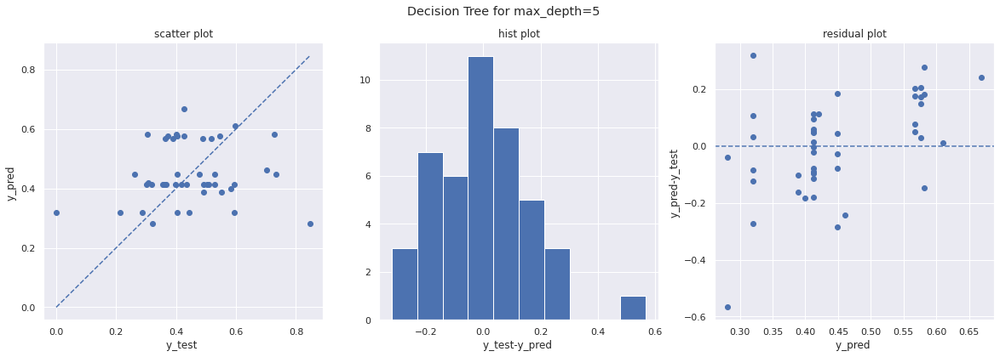

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))



MAE:0.129 MAPE:inf MSE:0.0269 RMSE:0.164 R2:-0.203 SKB:0.154


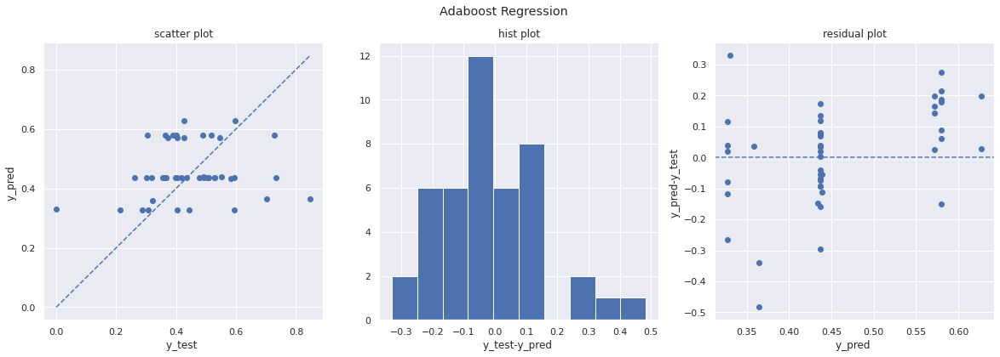

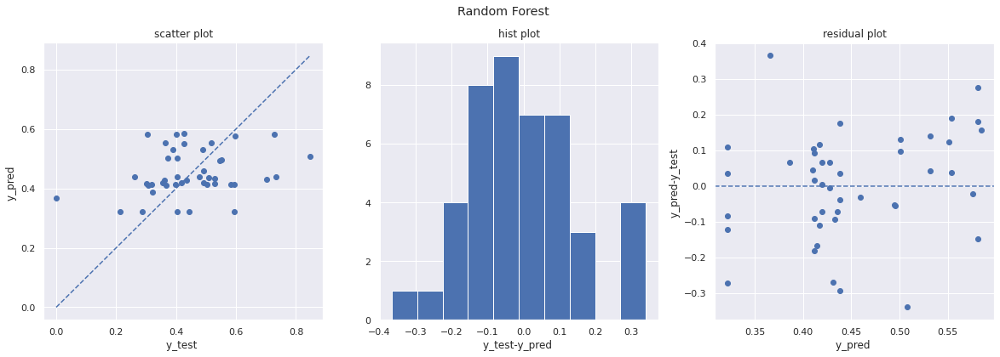

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))



MAE:0.118 MAPE:inf MSE:0.0219 RMSE:0.148 R2:0.0174 SKB:0.276


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

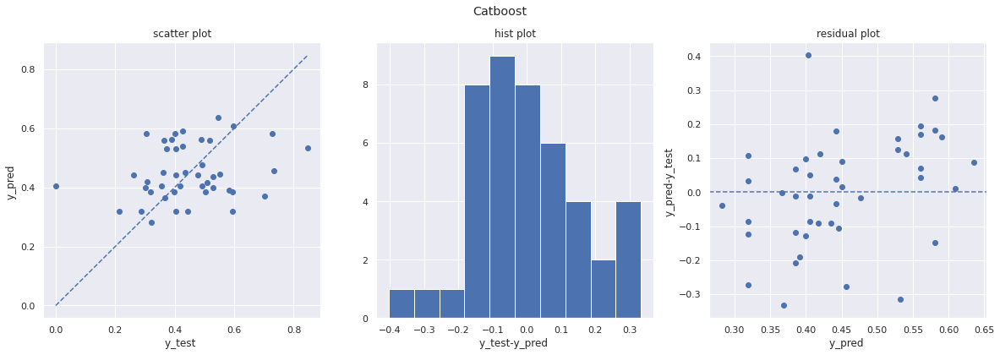

Streaming output truncated to the last 5000 lines.
8:	learn: 0.1413787	total: 10.3ms	remaining: 1.14s
9:	learn: 0.1408137	total: 11.9ms	remaining: 1.18s
10:	learn: 0.1403136	total: 12.2ms	remaining: 1.09s
11:	learn: 0.1395265	total: 12.5ms	remaining: 1.03s
12:	learn: 0.1388484	total: 12.8ms	remaining: 974ms
13:	learn: 0.1382012	total: 13.1ms	remaining: 925ms
14:	learn: 0.1375407	total: 13.5ms	remaining: 886ms
15:	learn: 0.1369325	total: 13.8ms	remaining: 850ms
16:	learn: 0.1364513	total: 14.1ms	remaining: 815ms
17:	learn: 0.1362063	total: 14.4ms	remaining: 785ms
18:	learn: 0.1357348	total: 14.9ms	remaining: 771ms
19:	learn: 0.1352377	total: 15.3ms	remaining: 749ms
20:	learn: 0.1349034	total: 15.5ms	remaining: 723ms
21:	learn: 0.1345824	total: 15.7ms	remaining: 699ms
22:	learn: 0.1339427	total: 16ms	remaining: 681ms
23:	learn: 0.1334496	total: 16.4ms	remaining: 666ms
24:	learn: 0.1332292	total: 16.6ms	remaining: 647ms
25:	learn: 0.1327486	total: 16.9ms	remaining: 634ms
26:	learn: 0.1324

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


[23:38:42] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[23:38:42] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[23:38:42] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[23:38:42] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


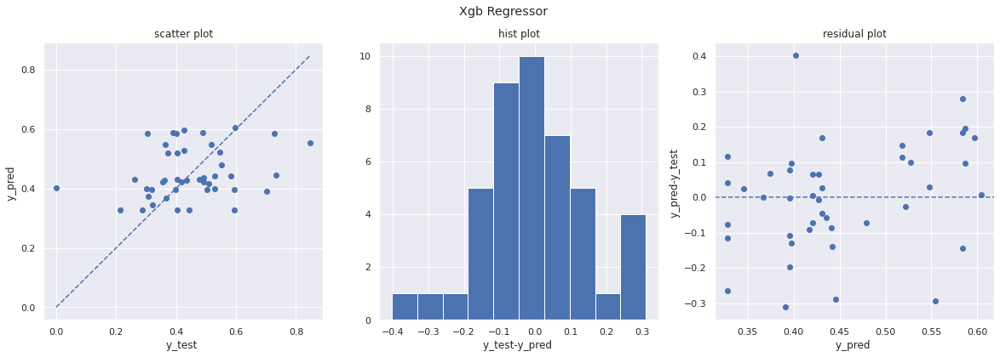

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))



MAE:0.118 MAPE:inf MSE:0.0227 RMSE:0.151 R2:-0.0168 SKB:0.271


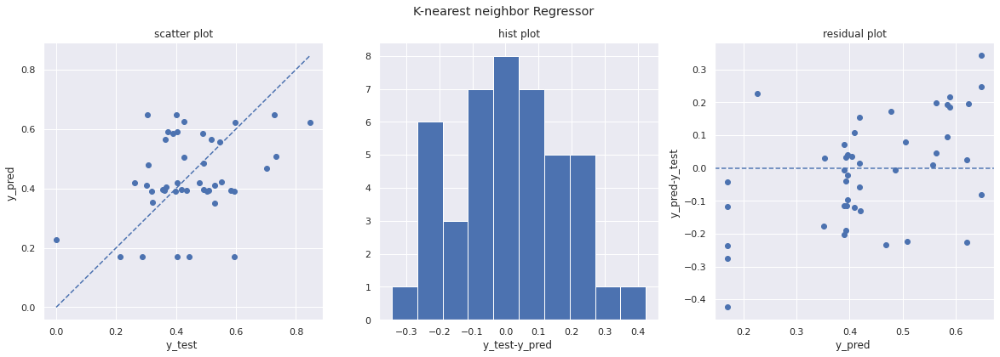

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))



MAE:0.133 MAPE:inf MSE:0.0271 RMSE:0.165 R2:-0.215 SKB:0.214


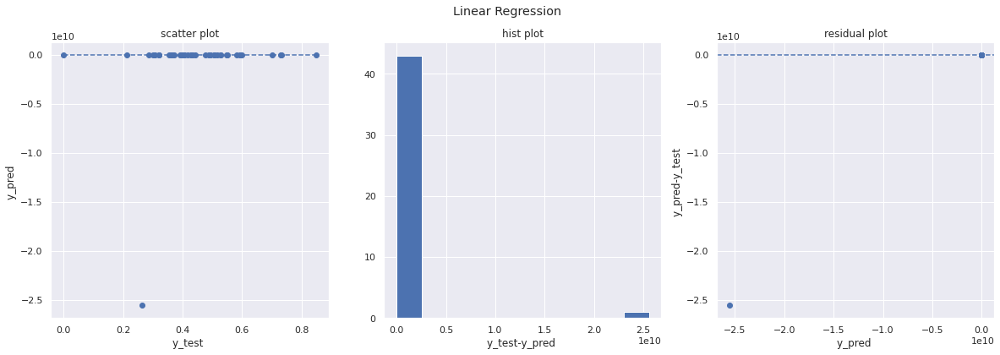

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))



MAE:5.81e+08 MAPE:inf MSE:1.48e+19 RMSE:3.85e+09 R2:-6.65e+20 SKB:0.349


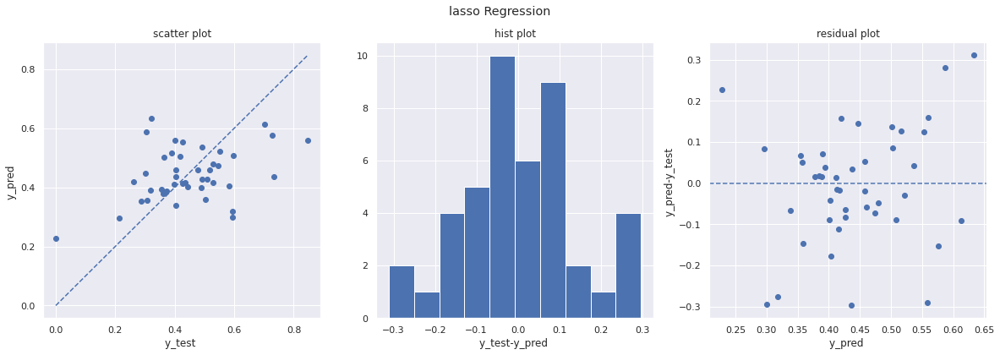

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))



MAE:0.109 MAPE:inf MSE:0.0196 RMSE:0.14 R2:0.122 SKB:0.301


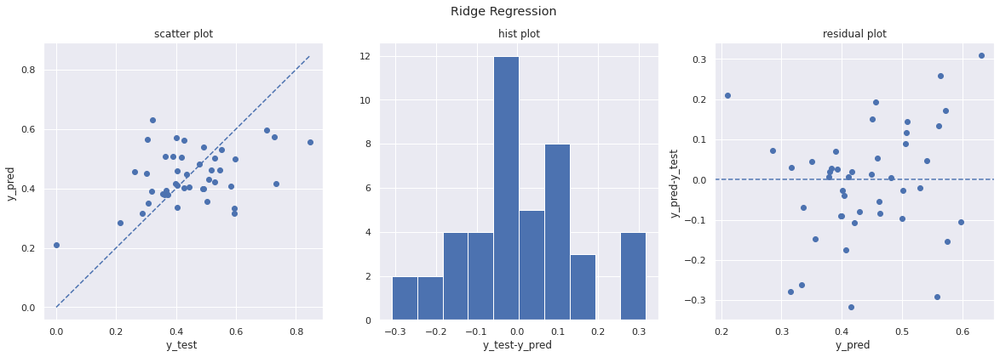

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))
<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))



MAE:0.108 MAPE:inf MSE:0.0195 RMSE:0.14 R2:0.126 SKB:0.284

MAE:0.111 MAPE:inf MSE:0.0209 RMSE:0.145 R2:0.0624 SKB:0.282


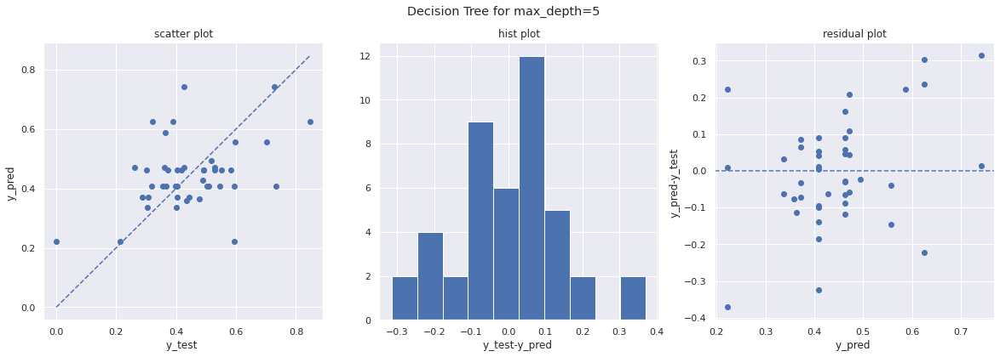

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))



MAE:0.112 MAPE:inf MSE:0.021 RMSE:0.145 R2:0.0586 SKB:0.416


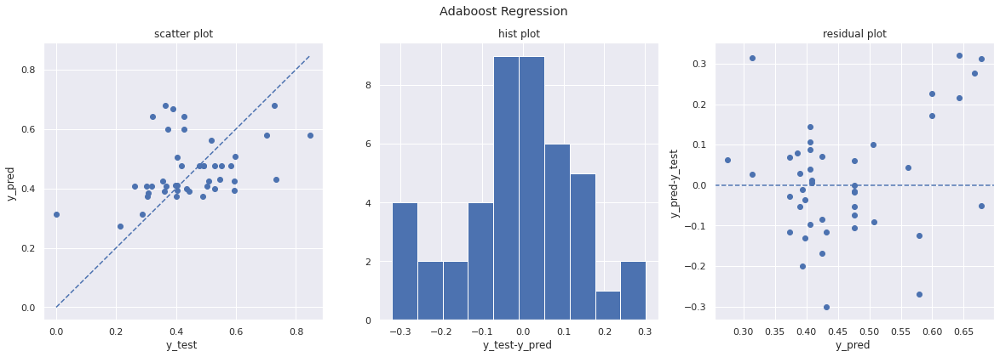

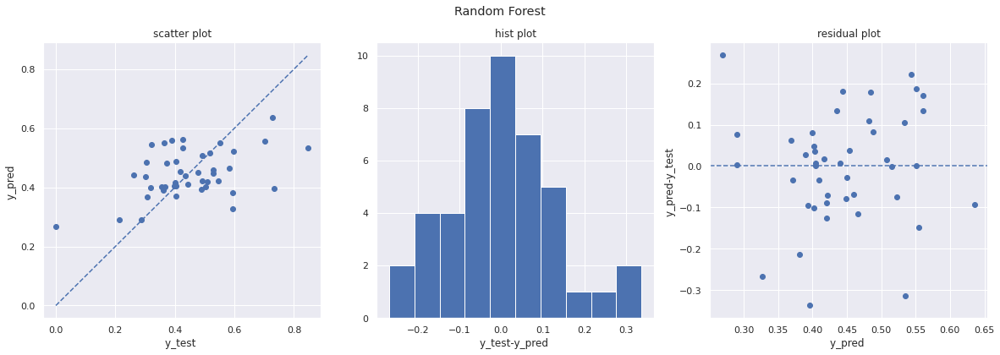

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))



MAE:0.102 MAPE:inf MSE:0.0177 RMSE:0.133 R2:0.208 SKB:0.323


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

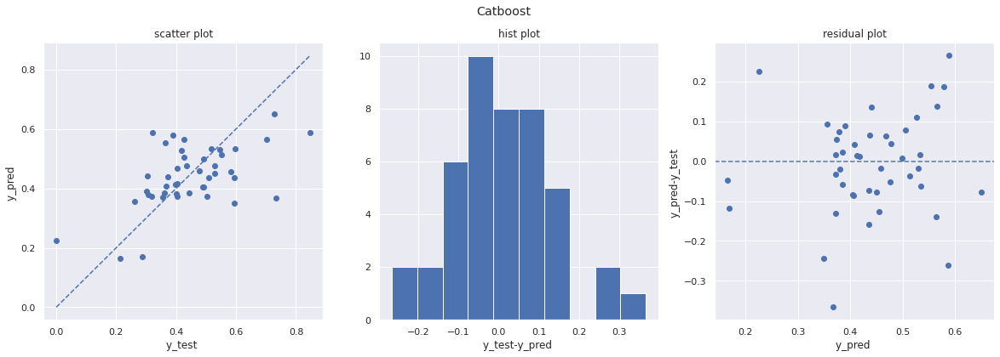

Streaming output truncated to the last 5000 lines.
7:	learn: 0.1395047	total: 28.4ms	remaining: 3.52s
8:	learn: 0.1384580	total: 32ms	remaining: 3.52s
9:	learn: 0.1372072	total: 35.5ms	remaining: 3.51s
10:	learn: 0.1361604	total: 38.8ms	remaining: 3.49s
11:	learn: 0.1352392	total: 42.2ms	remaining: 3.47s
12:	learn: 0.1340048	total: 45.6ms	remaining: 3.46s
13:	learn: 0.1329458	total: 49.3ms	remaining: 3.47s
14:	learn: 0.1318175	total: 52.8ms	remaining: 3.46s
15:	learn: 0.1309908	total: 56.3ms	remaining: 3.46s
16:	learn: 0.1299343	total: 59.8ms	remaining: 3.46s
17:	learn: 0.1291415	total: 63.2ms	remaining: 3.45s
18:	learn: 0.1282669	total: 66.6ms	remaining: 3.44s
19:	learn: 0.1274725	total: 70.1ms	remaining: 3.43s
20:	learn: 0.1265518	total: 73.7ms	remaining: 3.44s
21:	learn: 0.1257858	total: 78.2ms	remaining: 3.47s
22:	learn: 0.1250055	total: 79.4ms	remaining: 3.37s
23:	learn: 0.1243012	total: 80.9ms	remaining: 3.29s
24:	learn: 0.1234994	total: 82.4ms	remaining: 3.21s
25:	learn: 0.12277

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


[23:39:12] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[23:39:12] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[23:39:12] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[23:39:13] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[23:39:13] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


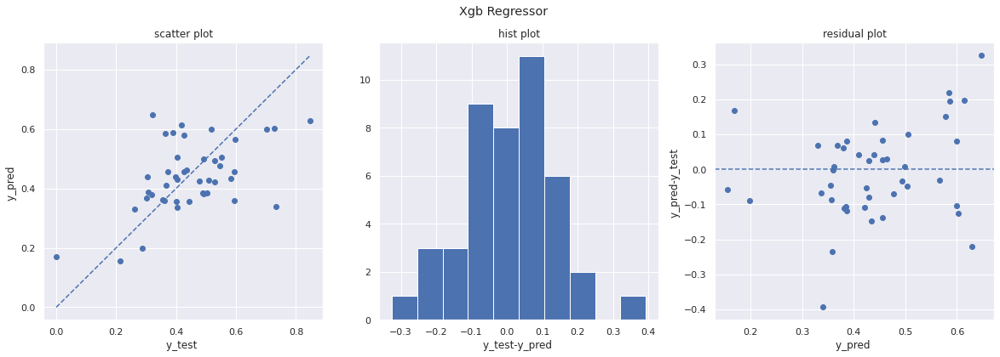

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))



MAE:0.104 MAPE:inf MSE:0.0174 RMSE:0.132 R2:0.219 SKB:0.421


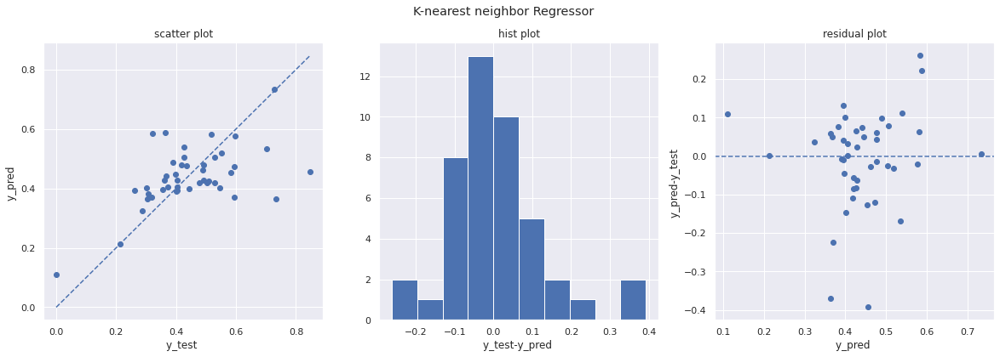

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))



MAE:0.0892 MAPE:inf MSE:0.0155 RMSE:0.125 R2:0.304 SKB:0.457


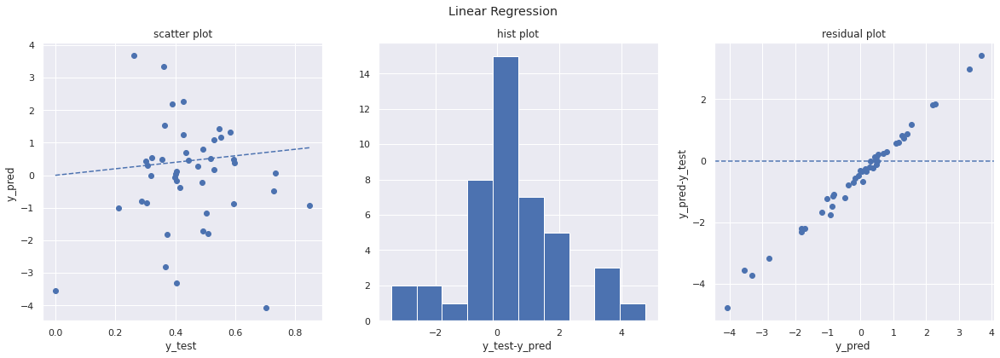

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))



MAE:1.19 MAPE:inf MSE:2.78 RMSE:1.67 R2:-1.23e+02 SKB:-0.0031


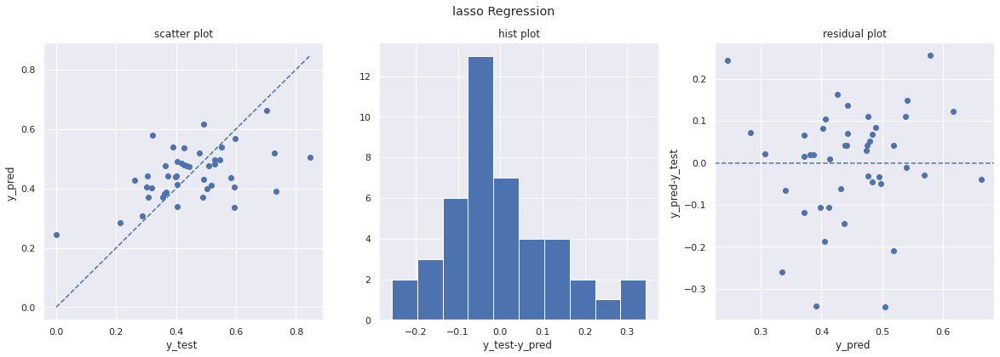

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))



MAE:0.0991 MAPE:inf MSE:0.017 RMSE:0.13 R2:0.241 SKB:0.43


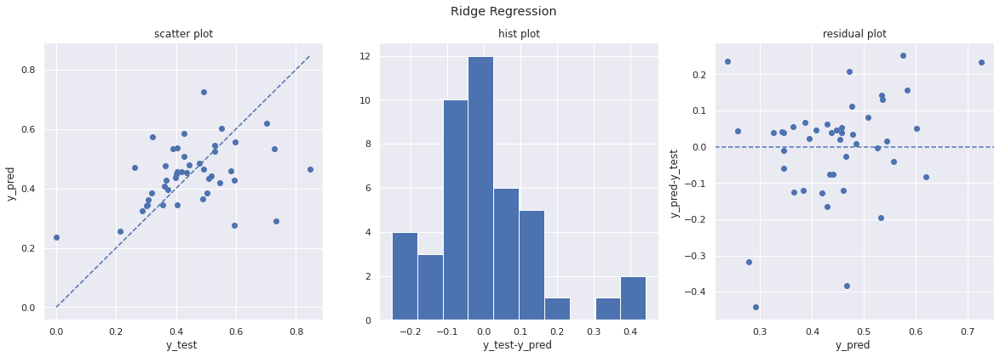

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))



MAE:0.106 MAPE:inf MSE:0.021 RMSE:0.145 R2:0.0578 SKB:0.39


<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))



MAE:0.109 MAPE:inf MSE:0.0219 RMSE:0.148 R2:0.0191 SKB:0.388


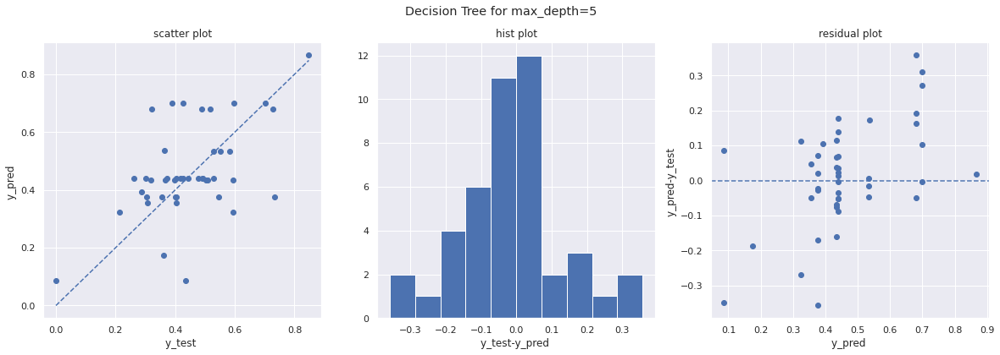

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))



MAE:0.0981 MAPE:inf MSE:0.0164 RMSE:0.128 R2:0.267 SKB:0.463


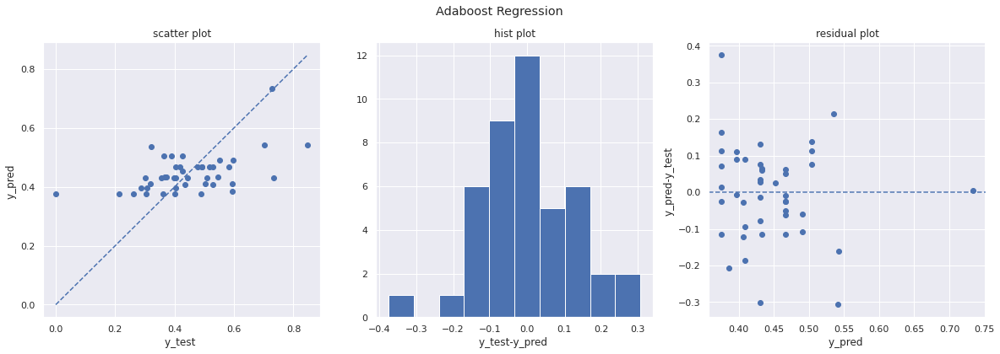

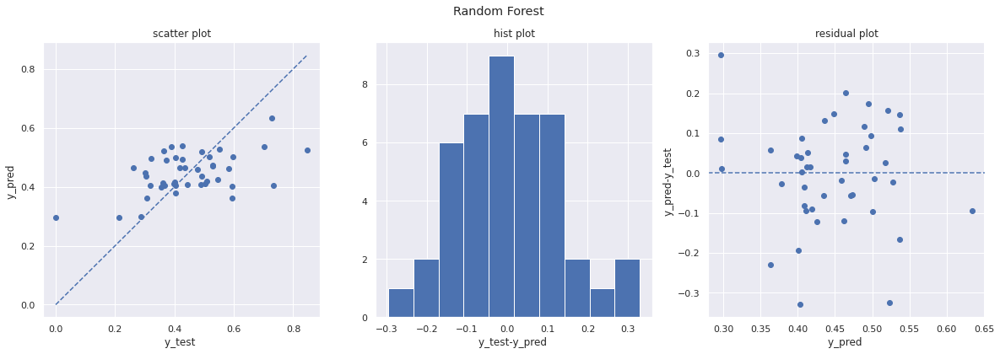

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))



MAE:0.0994 MAPE:inf MSE:0.0165 RMSE:0.128 R2:0.261 SKB:0.363


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

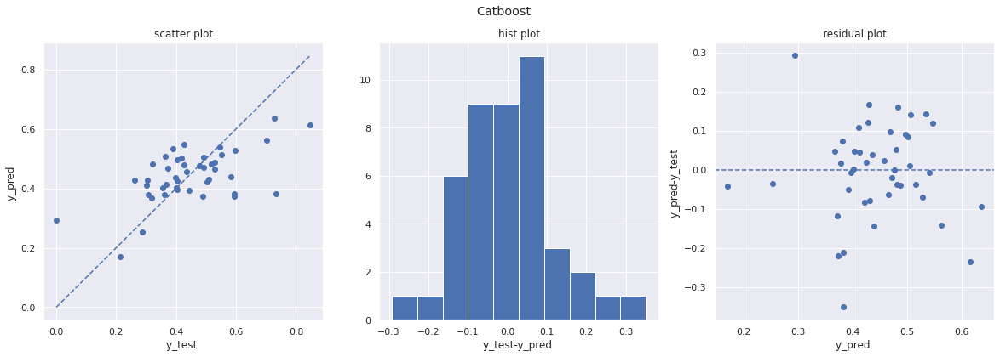

Streaming output truncated to the last 5000 lines.
4:	learn: 0.1428993	total: 54.3ms	remaining: 10.8s
5:	learn: 0.1417209	total: 59.6ms	remaining: 9.87s
6:	learn: 0.1405879	total: 64.9ms	remaining: 9.2s
7:	learn: 0.1394669	total: 70.1ms	remaining: 8.7s
8:	learn: 0.1381694	total: 75.6ms	remaining: 8.32s
9:	learn: 0.1370327	total: 81ms	remaining: 8.01s
10:	learn: 0.1359950	total: 86.1ms	remaining: 7.74s
11:	learn: 0.1349744	total: 91.5ms	remaining: 7.53s
12:	learn: 0.1339393	total: 96.8ms	remaining: 7.35s
13:	learn: 0.1327770	total: 102ms	remaining: 7.19s
14:	learn: 0.1318452	total: 107ms	remaining: 7.04s
15:	learn: 0.1308125	total: 113ms	remaining: 6.92s
16:	learn: 0.1299286	total: 118ms	remaining: 6.82s
17:	learn: 0.1290149	total: 123ms	remaining: 6.72s
18:	learn: 0.1280993	total: 129ms	remaining: 6.64s
19:	learn: 0.1270377	total: 138ms	remaining: 6.75s
20:	learn: 0.1260482	total: 151ms	remaining: 7.03s
21:	learn: 0.1251459	total: 157ms	remaining: 7s
22:	learn: 0.1244137	total: 163ms	r

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))



MAE:0.0906 MAPE:inf MSE:0.0143 RMSE:0.12 R2:0.359 SKB:0.467
[23:40:25] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[23:40:26] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[23:40:26] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[23:40:27] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[23:40:28] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[23:40:28] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


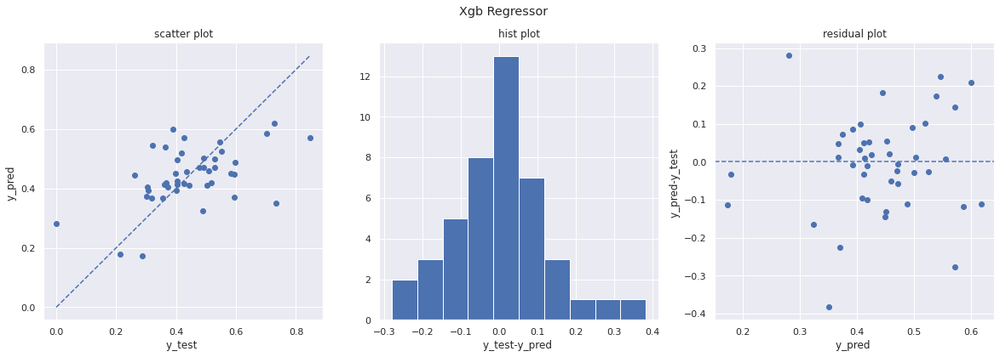

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))



MAE:0.0963 MAPE:inf MSE:0.0166 RMSE:0.129 R2:0.256 SKB:0.456


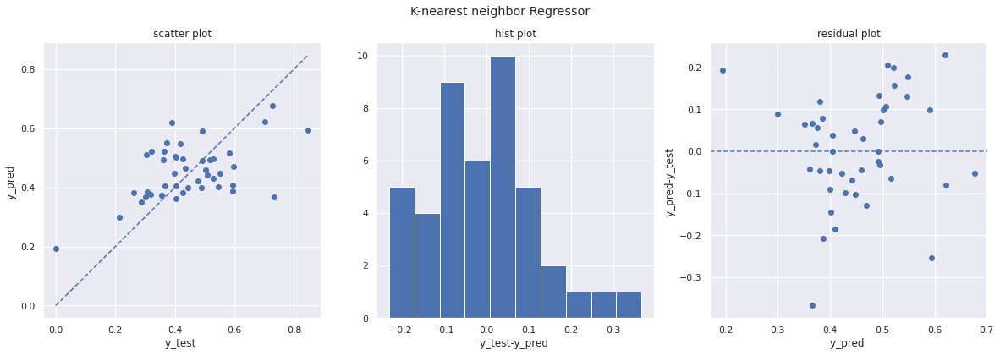

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))



MAE:0.103 MAPE:inf MSE:0.0163 RMSE:0.127 R2:0.272 SKB:0.346


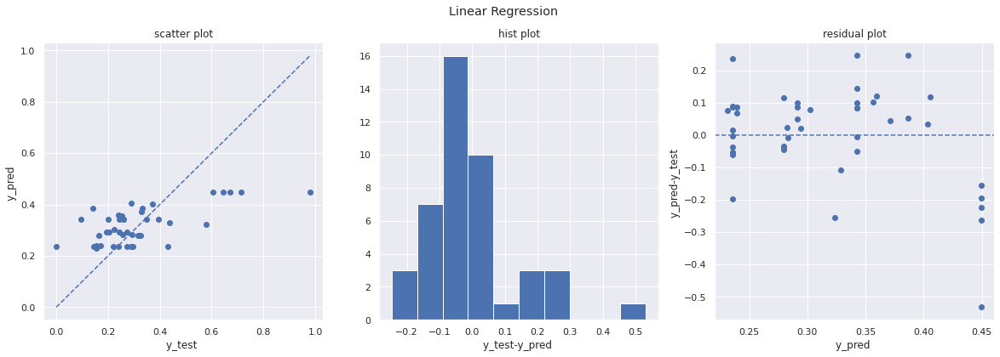

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))



MAE:0.108 MAPE:inf MSE:0.0212 RMSE:0.146 R2:0.36 SKB:0.497


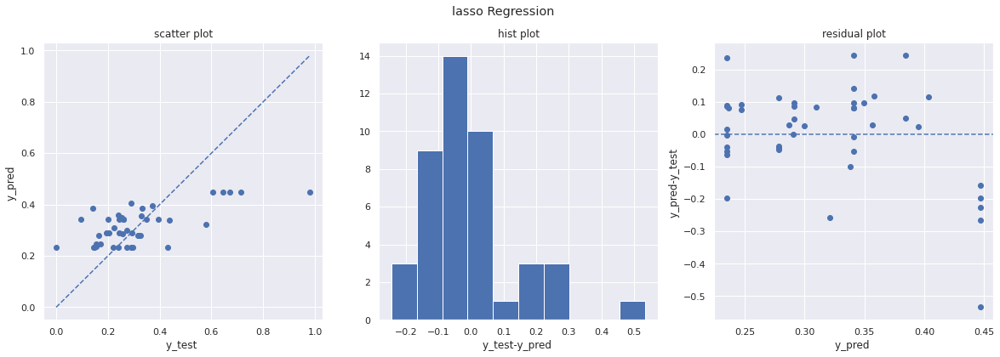

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))



MAE:0.108 MAPE:inf MSE:0.0213 RMSE:0.146 R2:0.357 SKB:0.482


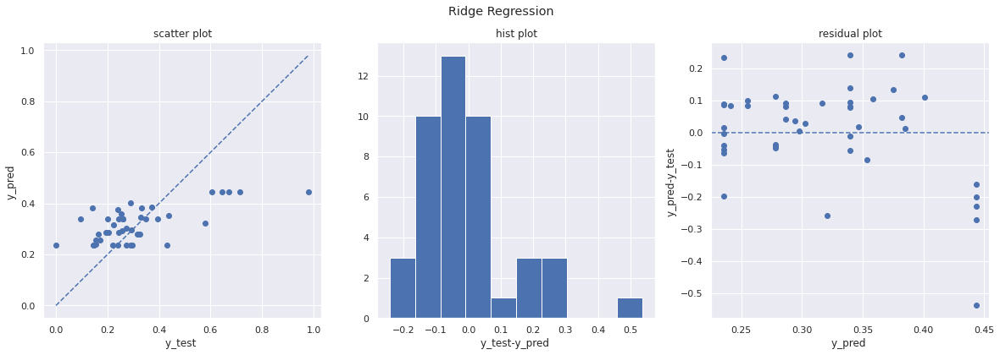

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))
<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))



MAE:0.109 MAPE:inf MSE:0.0215 RMSE:0.147 R2:0.35 SKB:0.508

MAE:0.106 MAPE:inf MSE:0.022 RMSE:0.148 R2:0.335 SKB:0.39


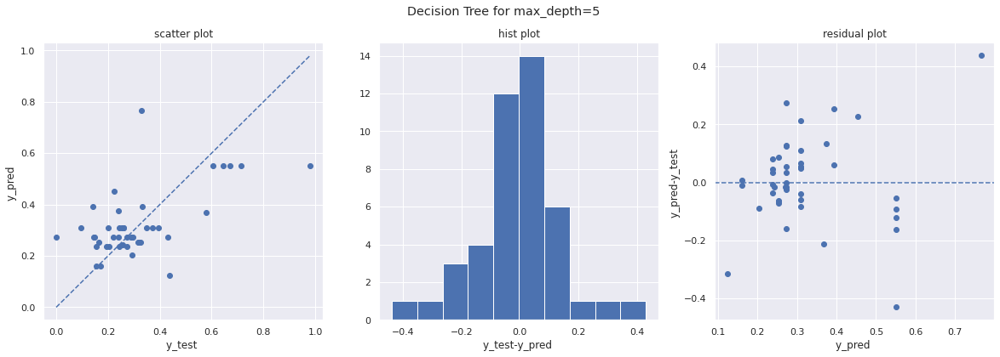

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))



MAE:0.0941 MAPE:inf MSE:0.0164 RMSE:0.128 R2:0.503 SKB:0.394


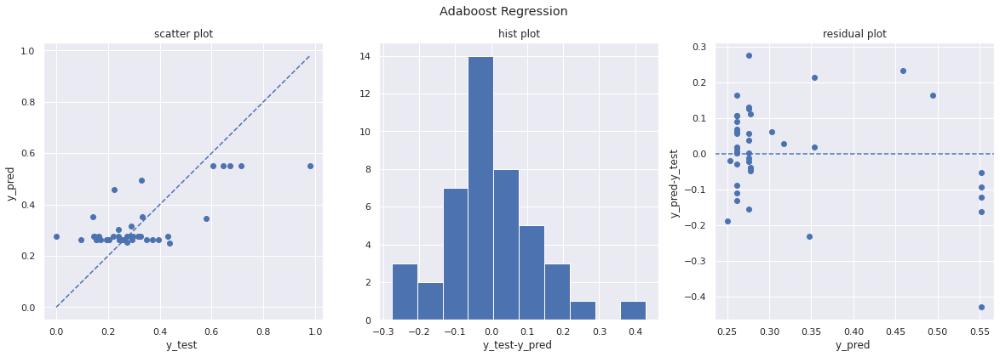

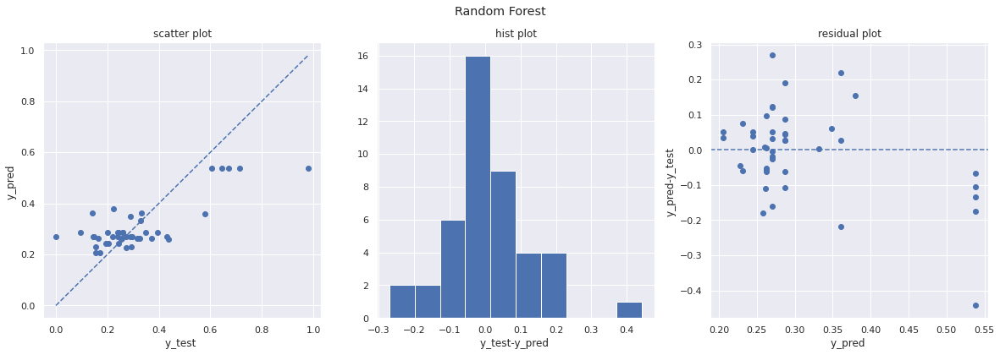

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))



MAE:0.0893 MAPE:inf MSE:0.0151 RMSE:0.123 R2:0.543 SKB:0.401


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

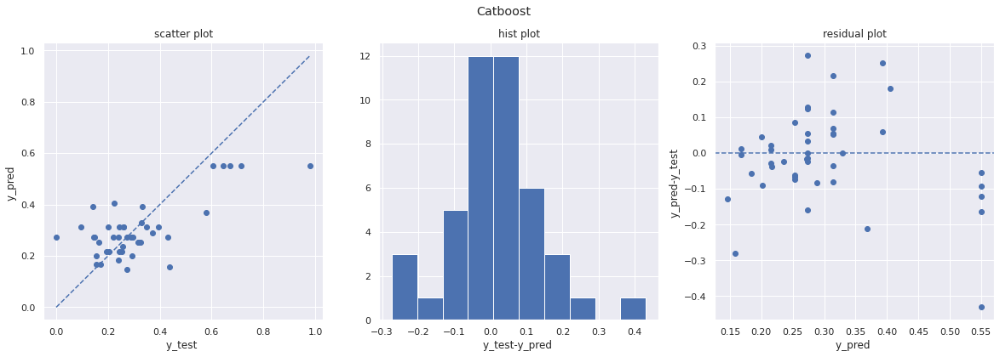

Streaming output truncated to the last 5000 lines.
8:	learn: 0.1551945	total: 2.47ms	remaining: 272ms
9:	learn: 0.1543477	total: 2.74ms	remaining: 272ms
10:	learn: 0.1534272	total: 3.08ms	remaining: 277ms
11:	learn: 0.1530261	total: 3.3ms	remaining: 272ms
12:	learn: 0.1523786	total: 3.61ms	remaining: 274ms
13:	learn: 0.1519317	total: 3.89ms	remaining: 274ms
14:	learn: 0.1515096	total: 4.17ms	remaining: 274ms
15:	learn: 0.1508864	total: 4.49ms	remaining: 276ms
16:	learn: 0.1502346	total: 4.82ms	remaining: 279ms
17:	learn: 0.1498931	total: 5ms	remaining: 273ms
18:	learn: 0.1492984	total: 5.3ms	remaining: 274ms
19:	learn: 0.1490529	total: 5.51ms	remaining: 270ms
20:	learn: 0.1484997	total: 5.9ms	remaining: 275ms
21:	learn: 0.1478388	total: 6.29ms	remaining: 279ms
22:	learn: 0.1475664	total: 6.51ms	remaining: 277ms
23:	learn: 0.1473055	total: 6.72ms	remaining: 273ms
24:	learn: 0.1467535	total: 7.02ms	remaining: 274ms
25:	learn: 0.1463775	total: 7.25ms	remaining: 272ms
26:	learn: 0.1460807	

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


[23:40:47] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[23:40:47] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[23:40:48] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[23:40:48] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


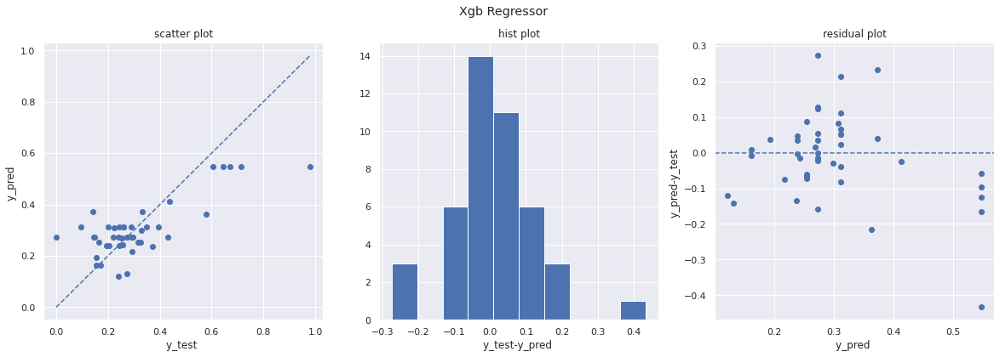

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))



MAE:0.0882 MAPE:inf MSE:0.0148 RMSE:0.122 R2:0.552 SKB:0.47


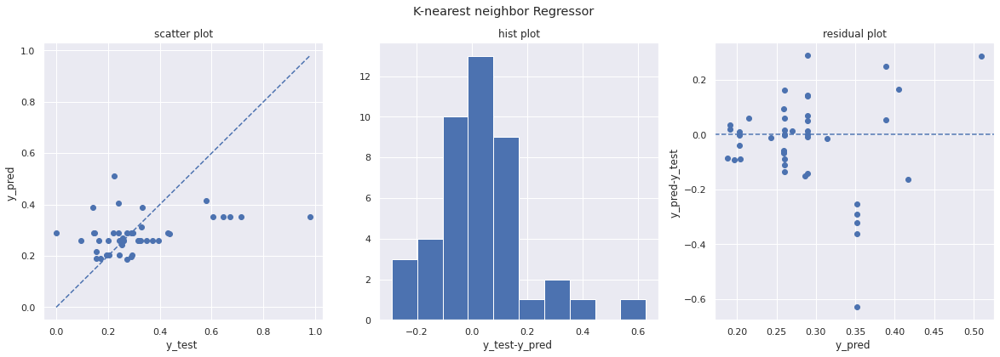

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))



MAE:0.116 MAPE:inf MSE:0.0289 RMSE:0.17 R2:0.127 SKB:0.311


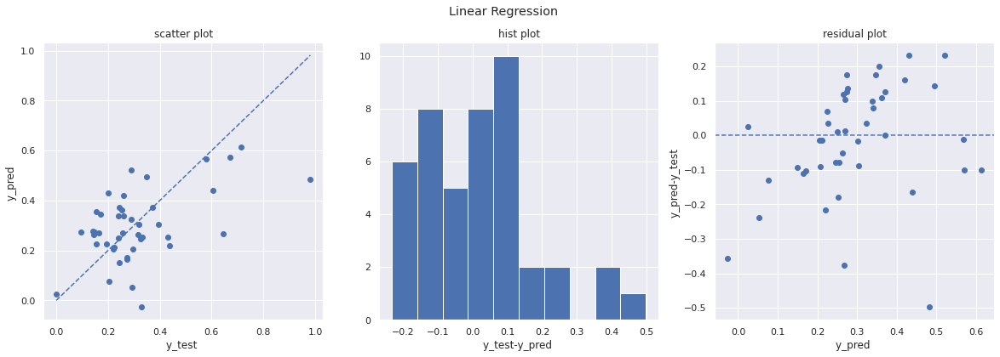

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))



MAE:0.125 MAPE:inf MSE:0.026 RMSE:0.161 R2:0.213 SKB:0.304


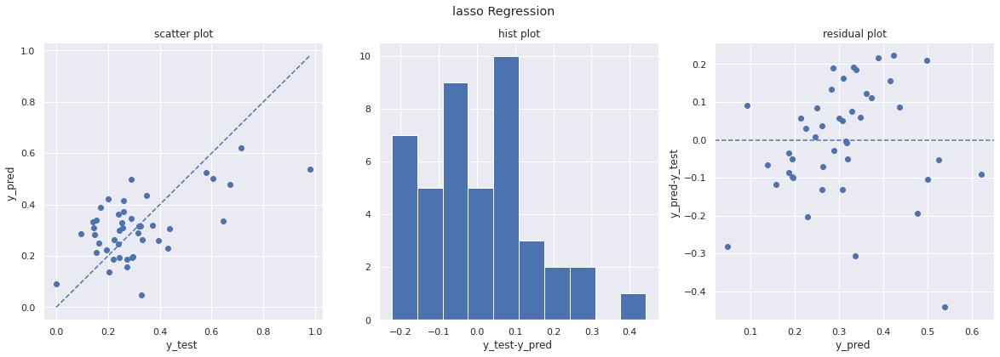

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))



MAE:0.118 MAPE:inf MSE:0.0216 RMSE:0.147 R2:0.348 SKB:0.358


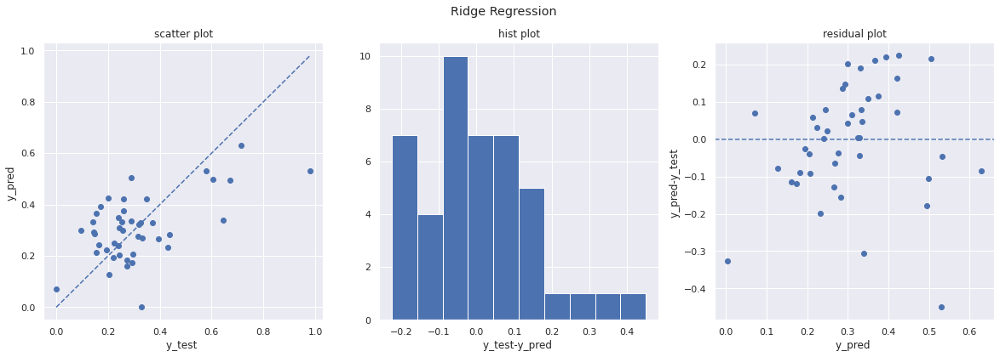

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))
<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))



MAE:0.118 MAPE:inf MSE:0.0225 RMSE:0.15 R2:0.321 SKB:0.333

MAE:0.073 MAPE:inf MSE:0.00914 RMSE:0.0956 R2:0.724 SKB:0.501


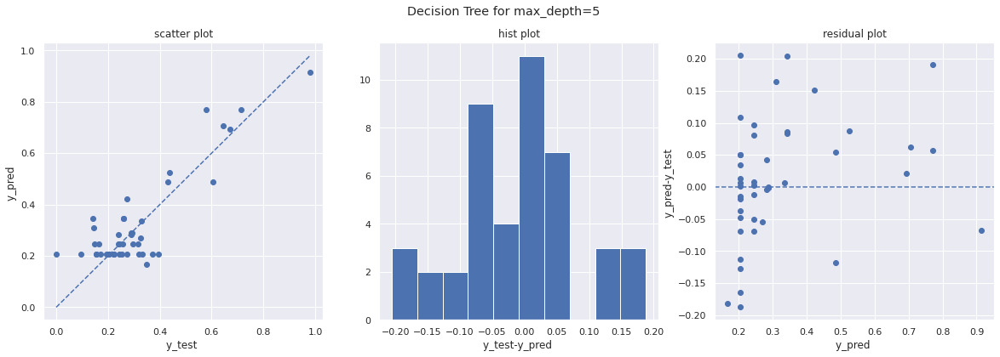

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))



MAE:0.0795 MAPE:inf MSE:0.0102 RMSE:0.101 R2:0.691 SKB:0.575


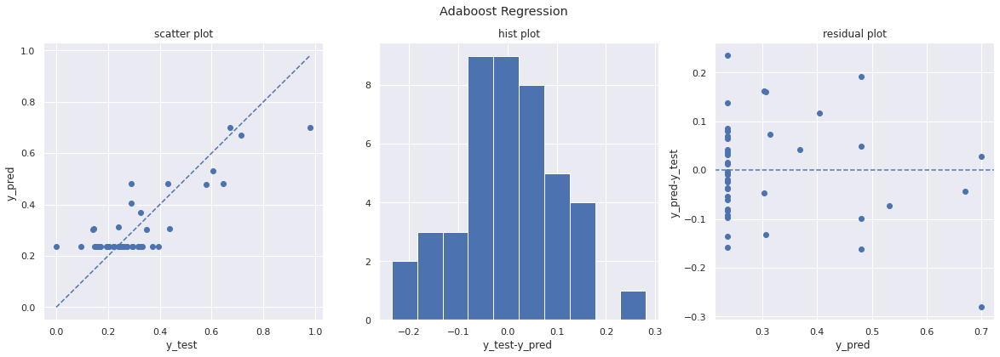

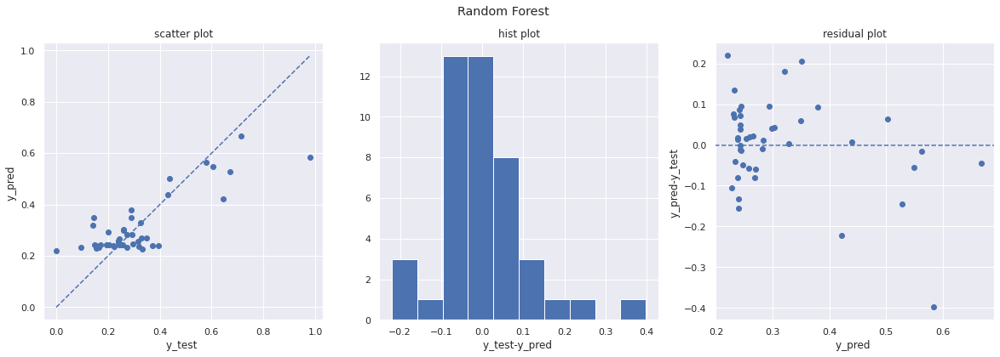

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))



MAE:0.0773 MAPE:inf MSE:0.0118 RMSE:0.108 R2:0.645 SKB:0.556


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

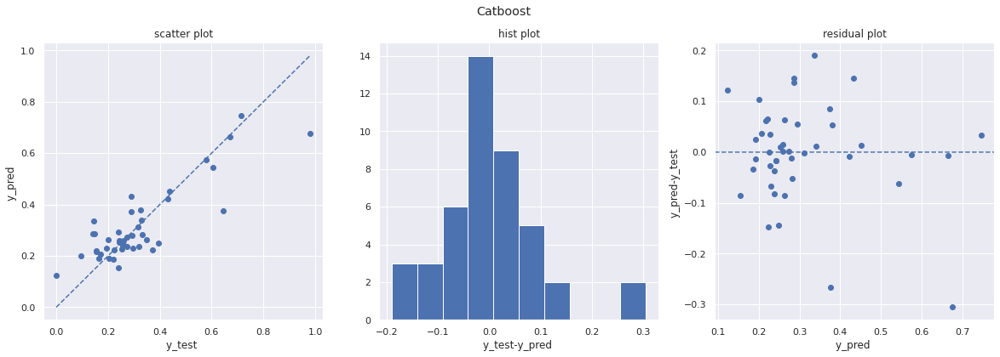

Streaming output truncated to the last 5000 lines.
7:	learn: 0.1506344	total: 27.7ms	remaining: 3.43s
8:	learn: 0.1492842	total: 32ms	remaining: 3.52s
9:	learn: 0.1479670	total: 35.4ms	remaining: 3.5s
10:	learn: 0.1466181	total: 38.2ms	remaining: 3.43s
11:	learn: 0.1452515	total: 41.5ms	remaining: 3.42s
12:	learn: 0.1436368	total: 43.8ms	remaining: 3.33s
13:	learn: 0.1422526	total: 47.2ms	remaining: 3.32s
14:	learn: 0.1411583	total: 50.6ms	remaining: 3.32s
15:	learn: 0.1399697	total: 54ms	remaining: 3.32s
16:	learn: 0.1388059	total: 57.3ms	remaining: 3.31s
17:	learn: 0.1375414	total: 60.6ms	remaining: 3.3s
18:	learn: 0.1364593	total: 63.9ms	remaining: 3.3s
19:	learn: 0.1351946	total: 68ms	remaining: 3.33s
20:	learn: 0.1339851	total: 70.5ms	remaining: 3.29s
21:	learn: 0.1330613	total: 73.1ms	remaining: 3.25s
22:	learn: 0.1318789	total: 75.6ms	remaining: 3.21s
23:	learn: 0.1310328	total: 78.8ms	remaining: 3.2s
24:	learn: 0.1301811	total: 82.1ms	remaining: 3.2s
25:	learn: 0.1292648	total:

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


[23:41:18] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[23:41:18] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[23:41:19] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[23:41:19] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[23:41:19] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


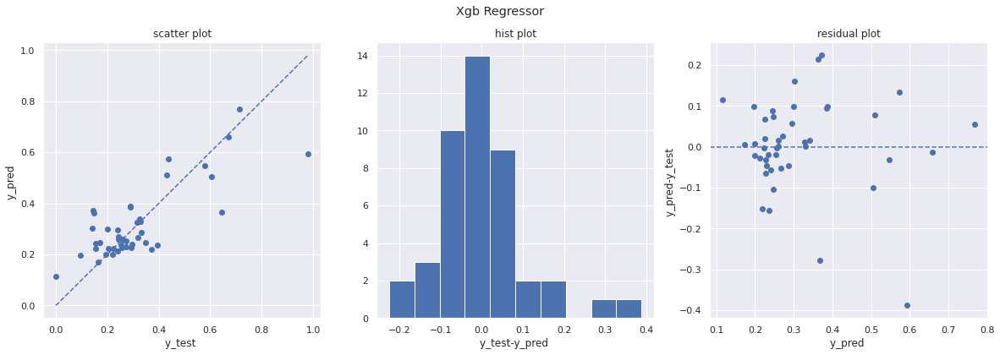

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))



MAE:0.077 MAPE:inf MSE:0.0123 RMSE:0.111 R2:0.629 SKB:0.585


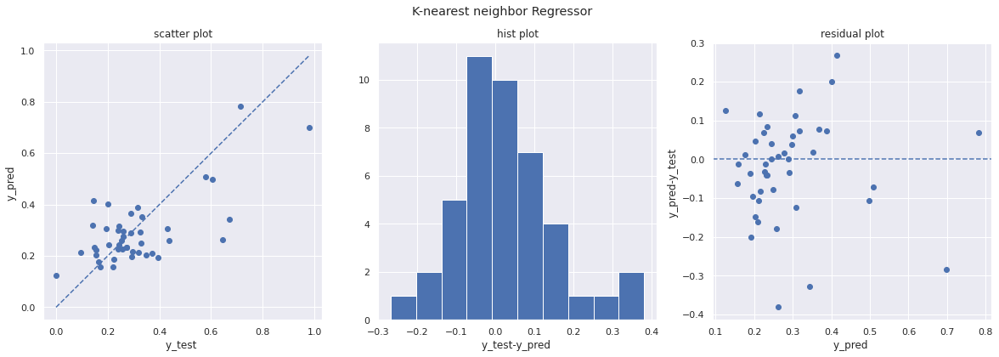

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))



MAE:0.098 MAPE:inf MSE:0.0173 RMSE:0.131 R2:0.478 SKB:0.372


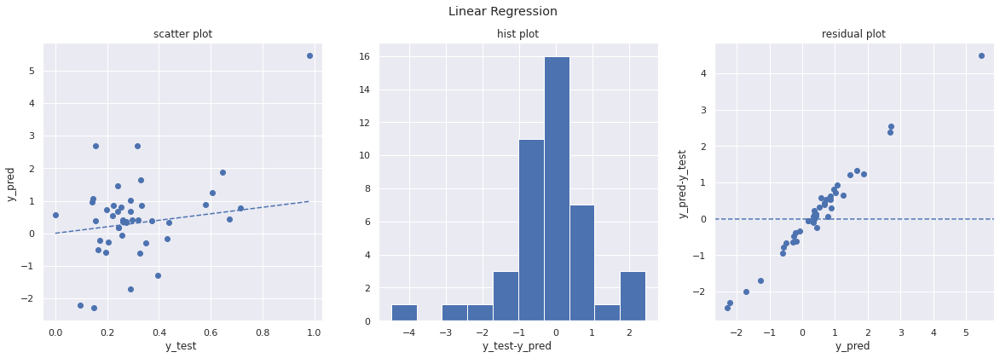

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))



MAE:0.799 MAPE:inf MSE:1.44 RMSE:1.2 R2:-42.4 SKB:0.199


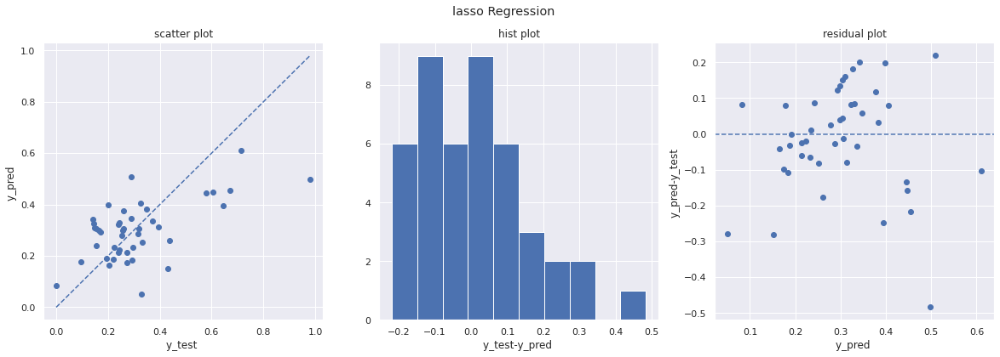

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))



MAE:0.113 MAPE:inf MSE:0.0213 RMSE:0.146 R2:0.356 SKB:0.401


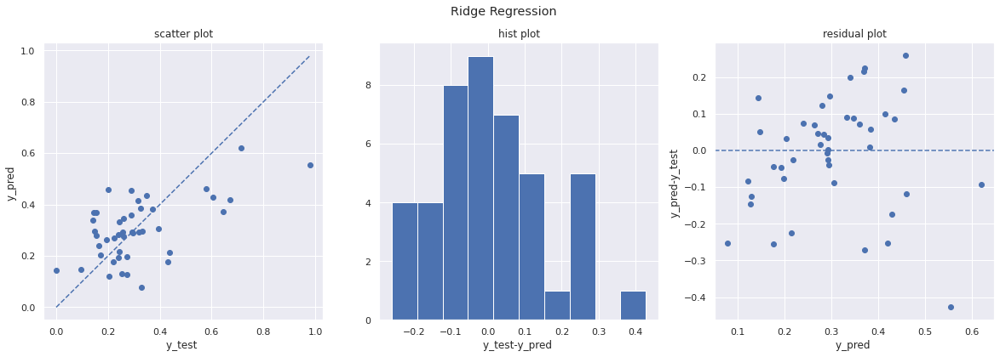

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))



MAE:0.116 MAPE:inf MSE:0.022 RMSE:0.148 R2:0.337 SKB:0.435


<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))



MAE:0.0896 MAPE:inf MSE:0.0171 RMSE:0.131 R2:0.485 SKB:0.57


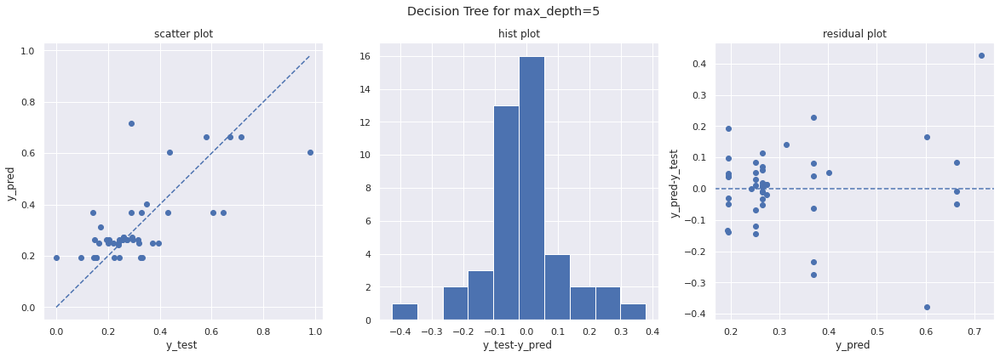

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))



MAE:0.0743 MAPE:inf MSE:0.0126 RMSE:0.112 R2:0.621 SKB:0.716


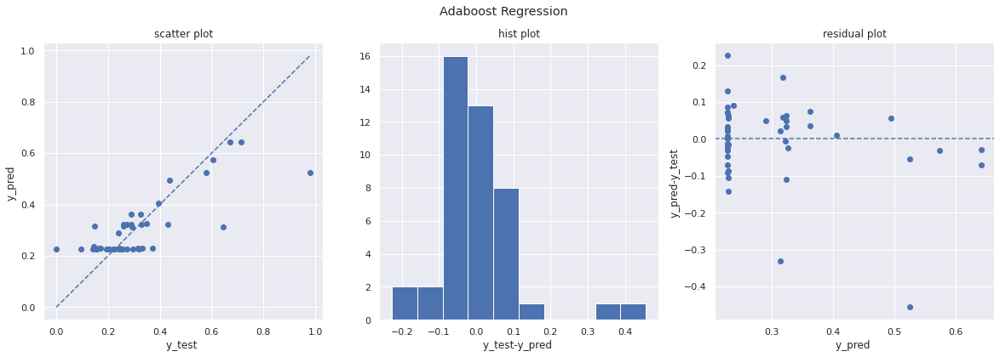

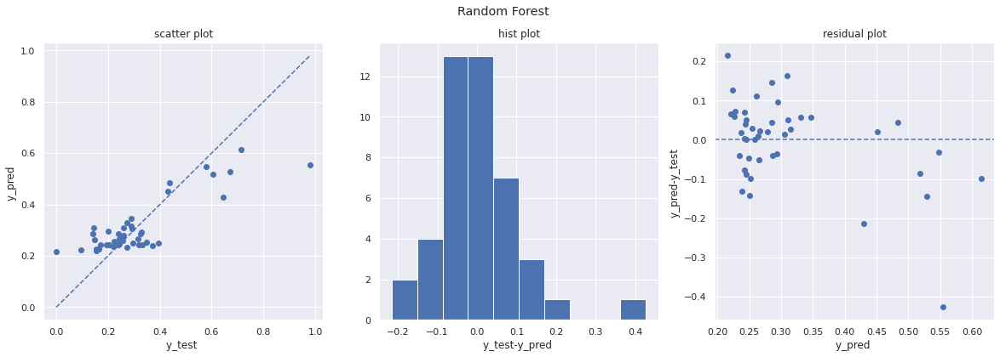

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))



MAE:0.0771 MAPE:inf MSE:0.0116 RMSE:0.107 R2:0.651 SKB:0.621


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

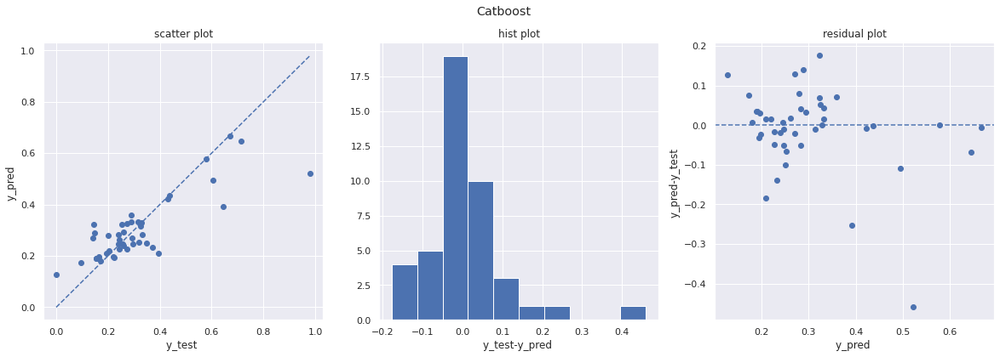

Streaming output truncated to the last 5000 lines.
7:	learn: 0.1505014	total: 104ms	remaining: 12.8s
8:	learn: 0.1489715	total: 108ms	remaining: 11.9s
9:	learn: 0.1475263	total: 114ms	remaining: 11.3s
10:	learn: 0.1461878	total: 119ms	remaining: 10.7s
11:	learn: 0.1449447	total: 124ms	remaining: 10.2s
12:	learn: 0.1435280	total: 130ms	remaining: 9.87s
13:	learn: 0.1424860	total: 136ms	remaining: 9.57s
14:	learn: 0.1410119	total: 141ms	remaining: 9.29s
15:	learn: 0.1399403	total: 147ms	remaining: 9.02s
16:	learn: 0.1387257	total: 152ms	remaining: 8.81s
17:	learn: 0.1375810	total: 158ms	remaining: 8.6s
18:	learn: 0.1362496	total: 163ms	remaining: 8.42s
19:	learn: 0.1351691	total: 169ms	remaining: 8.29s
20:	learn: 0.1340245	total: 174ms	remaining: 8.13s
21:	learn: 0.1329002	total: 180ms	remaining: 7.99s
22:	learn: 0.1317807	total: 185ms	remaining: 7.86s
23:	learn: 0.1305320	total: 192ms	remaining: 7.8s
24:	learn: 0.1292865	total: 203ms	remaining: 7.91s
25:	learn: 0.1281875	total: 222ms	re

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


[23:42:40] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[23:42:41] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[23:42:41] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[23:42:42] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[23:42:43] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


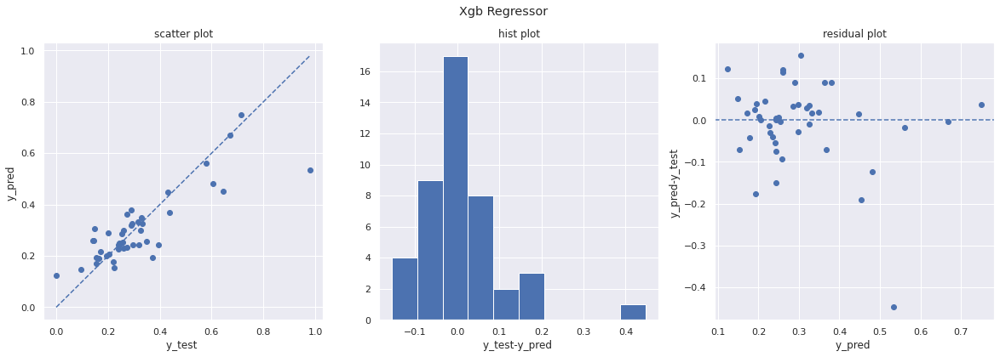

<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))



MAE:0.0646 MAPE:inf MSE:0.0101 RMSE:0.101 R2:0.695 SKB:0.721


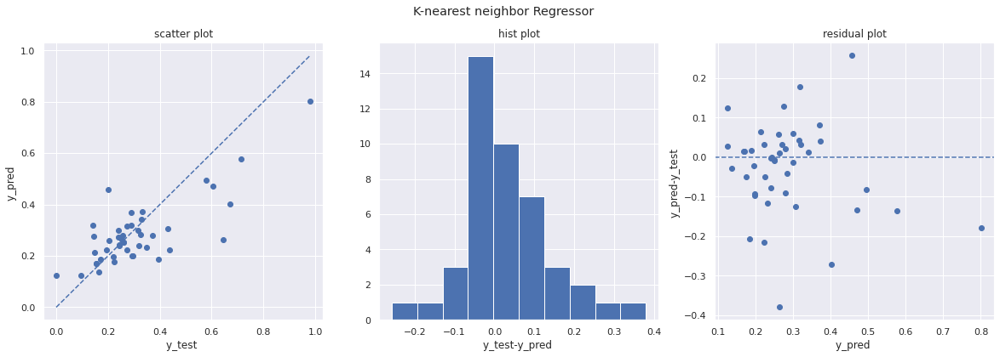


MAE:0.0836 MAPE:inf MSE:0.0138 RMSE:0.118 R2:0.582 SKB:0.552


<ipython-input-21-e4ef786e505e>:8: RuntimeWarning: divide by zero encountered in true_divide
  mape=np.mean(np.abs((y_test - y_pred)/y_test))


In [ ]:
models_dict={}
for target_var_index in target_var:
    models_dict[target_var_index]={}
    for n in features_number:
        models_dict[target_var_index][n]=[model(a[n][target_var_index],b[n][target_var_index],0.1)['matrix'] for model in models_function]

[Text(0, 0, 'linearRegression'),
 Text(1, 0, 'Lasso'),
 Text(2, 0, 'Ridge'),
 Text(3, 0, 'Decision Tree'),
 Text(4, 0, 'Adaboost'),
 Text(5, 0, 'Randomforest'),
 Text(6, 0, 'Catboost'),
 Text(7, 0, 'Xgboost'),
 Text(8, 0, 'Knn')]

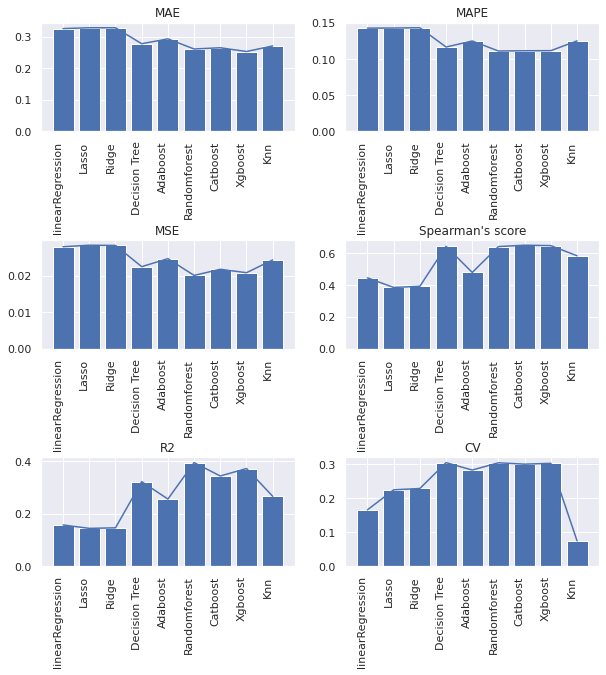

In [ ]:
label=['linearRegression','Lasso','Ridge','Decision Tree','Adaboost','Randomforest','Catboost','Xgboost','Knn']
x_pos = np.arange(len(label))

MAE_y=[model['matrix']['MAE'] for model in models]
MAPE_y=[model['matrix']['MAPE'] for model in models]
MSE_y=[model['matrix']['MSE'] for model in models]
RMSE_y=[model['matrix']['RMSE'] for model in models]
R2_y=[model['matrix']['R2'] for model in models]
SKB_y=[model['matrix']['SKB'] for model in models]
CV_y=[model['matrix']['CV'] for model in models]
CV_y[4]=np.mean(CV_y[4])

figure, axis = plt.subplots(3,2)
figure.set_figheight(10)
figure.set_figwidth(10)
#figure.suptitle('Erros bar Plot')

axis[0][0].bar(label[:],MAPE_y[:])
axis[0][0].plot(label[:],MAPE_y[:])
axis[0][0].set_title('MAE')

axis[0][1].bar(label[:],MAE_y[:])
axis[0][1].plot(label[:],MAE_y[:])
axis[0][1].set_title('MAPE')

axis[1][0].bar(label[:],MSE_y[:])
axis[1][0].plot(label[:],MSE_y[:])
axis[1][0].set_title('MSE')

axis[1][1].bar(label[:],SKB_y[:])
axis[1][1].plot(label[:],SKB_y[:])
axis[1][1].set_title('Spearman\'s score')

axis[2][0].bar(label[:],R2_y[:])
axis[2][0].plot(label[:],R2_y[:])
axis[2][0].set_title('R2')

axis[2][1].bar(label[:],CV_y[:])
axis[2][1].plot(label[:],CV_y[:])
axis[2][1].set_title('CV')


plt.draw()
plt.subplots_adjust(hspace=1)
axis[0][0].set_xticklabels(axis[0][1].get_xticklabels(), rotation=90, ha='right')
axis[0][1].set_xticklabels(axis[0][1].get_xticklabels(), rotation=90, ha='right')
axis[1][0].set_xticklabels(axis[1][0].get_xticklabels(), rotation=90, ha='right')
axis[1][1].set_xticklabels(axis[1][1].get_xticklabels(), rotation=90, ha='right')
axis[2][0].set_xticklabels(axis[1][0].get_xticklabels(), rotation=90, ha='right')
axis[2][1].set_xticklabels(axis[1][1].get_xticklabels(), rotation=90, ha='right')

[Text(0, 0, 'Lasso'),
 Text(1, 0, 'Ridge'),
 Text(2, 0, 'Decision Tree'),
 Text(3, 0, 'Adaboost'),
 Text(4, 0, 'Randomforest'),
 Text(5, 0, 'Catboost'),
 Text(6, 0, 'Xgboost'),
 Text(7, 0, 'Knn')]

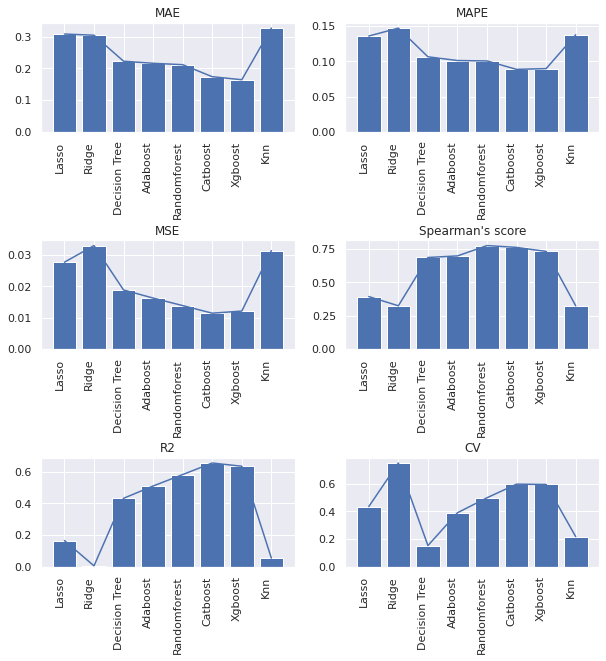

In [ ]:
label=['Lasso','Ridge','Decision Tree','Adaboost','Randomforest','Catboost','Xgboost','Knn']
x_pos = np.arange(len(label))
models=models[1:]
MAE_y=[model['matrix']['MAE'] for model in models]
MAPE_y=[model['matrix']['MAPE'] for model in models]
MSE_y=[model['matrix']['MSE'] for model in models]
RMSE_y=[model['matrix']['RMSE'] for model in models]
R2_y=[model['matrix']['R2'] for model in models]
SKB_y=[model['matrix']['SKB'] for model in models]
CV_y=[model['matrix']['CV'] for model in models]
CV_y[3]=np.mean(CV_y[3])

figure, axis = plt.subplots(3,2)
figure.set_figheight(10)
figure.set_figwidth(10)
#figure.suptitle('Erros bar Plot')

axis[0][0].bar(label[:],MAPE_y[:])
axis[0][0].plot(label[:],MAPE_y[:])
axis[0][0].set_title('MAE')

axis[0][1].bar(label[:],MAE_y[:])
axis[0][1].plot(label[:],MAE_y[:])
axis[0][1].set_title('MAPE')

axis[1][0].bar(label[:],MSE_y[:])
axis[1][0].plot(label[:],MSE_y[:])
axis[1][0].set_title('MSE')

axis[1][1].bar(label[:],SKB_y[:])
axis[1][1].plot(label[:],SKB_y[:])
axis[1][1].set_title('Spearman\'s score')

axis[2][0].bar(label[:],R2_y[:])
axis[2][0].plot(label[:],R2_y[:])
axis[2][0].set_title('R2')

axis[2][1].bar(label[:],CV_y[:])
axis[2][1].plot(label[:],CV_y[:])
axis[2][1].set_title('CV')


plt.draw()
plt.subplots_adjust(hspace=1)
axis[0][0].set_xticklabels(axis[0][1].get_xticklabels(), rotation=90, ha='right')
axis[0][1].set_xticklabels(axis[0][1].get_xticklabels(), rotation=90, ha='right')
axis[1][0].set_xticklabels(axis[1][0].get_xticklabels(), rotation=90, ha='right')
axis[1][1].set_xticklabels(axis[1][1].get_xticklabels(), rotation=90, ha='right')
axis[2][0].set_xticklabels(axis[1][0].get_xticklabels(), rotation=90, ha='right')
axis[2][1].set_xticklabels(axis[1][1].get_xticklabels(), rotation=90, ha='right')

In [ ]:
for num in features_number:
    for trait in target_var:
        models_dict[trait][num][4]['CV']=np.mean(models_dict[trait][num][4]['CV'])

In [ ]:
import pickle

f = open("models_dict.pkl","wb")
pickle.dump(models_dict,f)
f.close()



In [ ]:
models_dict['Height']

{10: [{'MAE': 0.1426580515936082,
   'MAPE': 0.3260062781671845,
   'MSE': 0.027957722404094464,
   'RMSE': 0.16720562910408987,
   'R2': 0.1566310975778067,
   'SKB': array(0.4450411),
   'CV': 0.16545714566332761},
  {'MAE': 0.1427774073777388,
   'MAPE': 0.3286419106478008,
   'MSE': 0.028385303414713247,
   'RMSE': 0.16847938572630555,
   'R2': 0.14373274618816267,
   'SKB': array(0.38432335),
   'CV': 0.2242207803441023},
  {'MAE': 0.14318088902121884,
   'MAPE': 0.32855978067848784,
   'MSE': 0.028317312040257368,
   'RMSE': 0.16827748524463207,
   'R2': 0.14578376486630196,
   'SKB': array(0.39175804),
   'CV': 0.228157384160674},
  {'MAE': 0.11852386323786793,
   'MAPE': 0.2816914453287611,
   'MSE': 0.022681248677595887,
   'RMSE': 0.15060295042792451,
   'R2': 0.3158004959664583,
   'SKB': array(0.63055987),
   'CV': 0.305130663087516},
  {'MAE': 0.12486897802575321,
   'MAPE': 0.2933885473872769,
   'MSE': 0.02469030016441666,
   'RMSE': 0.15713147413684078,
   'R2': 0.25519